*Initially created at 13.03.2018 by Petteri Nevavuori (<petteri.nevavuori@mtech.fi>)*

---

# CNN Optimization

In this notebook we'll train several CNNs with Drone datasets and research if the drone images are valid with just themselves as inputs in predicting the yield outputs. We will perform training by the datasets generated at the previous notebook. We will use the images as inputs and use area-wise means as training targets.

The CNN will effectively comprise of a multilayer CNN connected to several linear layers for yield prediction. Some research questions:

- How many layers is optimal?
- What optimizer is optimal?
- What hyperparameters are optimal?
- Which input image size yields best results?

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#1.-Optimizer-Comparison" data-toc-modified-id="1.-Optimizer-Comparison-1">1. Optimizer Comparison</a></span><ul class="toc-item"><li><span><a href="#1.1-Batch-Size-Limits" data-toc-modified-id="1.1-Batch-Size-Limits-1.1">1.1 Batch Size Limits</a></span><ul class="toc-item"><li><span><a href="#1.1.1-SGD" data-toc-modified-id="1.1.1-SGD-1.1.1">1.1.1 SGD</a></span></li><li><span><a href="#1.1.2-RMSProp" data-toc-modified-id="1.1.2-RMSProp-1.1.2">1.1.2 RMSProp</a></span></li><li><span><a href="#1.1.3-Adadelta" data-toc-modified-id="1.1.3-Adadelta-1.1.3">1.1.3 Adadelta</a></span></li><li><span><a href="#1.1.4-Conclusions" data-toc-modified-id="1.1.4-Conclusions-1.1.4">1.1.4 Conclusions</a></span></li></ul></li><li><span><a href="#1.2-Comparing-with-Distinct-Datasets" data-toc-modified-id="1.2-Comparing-with-Distinct-Datasets-1.2">1.2 Comparing with Distinct Datasets</a></span><ul class="toc-item"><li><span><a href="#1.2.1-NDVI-Earlier-Dataset" data-toc-modified-id="1.2.1-NDVI-Earlier-Dataset-1.2.1">1.2.1 NDVI Earlier Dataset</a></span></li><li><span><a href="#1.2.2-NDVI-Later-Dataset" data-toc-modified-id="1.2.2-NDVI-Later-Dataset-1.2.2">1.2.2 NDVI Later Dataset</a></span></li><li><span><a href="#1.2.3-RGB-Earlier-Dataset" data-toc-modified-id="1.2.3-RGB-Earlier-Dataset-1.2.3">1.2.3 RGB Earlier Dataset</a></span></li><li><span><a href="#1.2.4-RGB-Later-Dataset" data-toc-modified-id="1.2.4-RGB-Later-Dataset-1.2.4">1.2.4 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#1.4-Conclusion-for-the-Optimizer" data-toc-modified-id="1.4-Conclusion-for-the-Optimizer-1.3">1.4 Conclusion for the Optimizer</a></span><ul class="toc-item"><li><span><a href="#1.4.1-NDVI-Datasets" data-toc-modified-id="1.4.1-NDVI-Datasets-1.3.1">1.4.1 NDVI Datasets</a></span></li><li><span><a href="#1.4.2-RGB-Datasets" data-toc-modified-id="1.4.2-RGB-Datasets-1.3.2">1.4.2 RGB Datasets</a></span></li><li><span><a href="#1.4.3-Final-Optimizer-Conclusions" data-toc-modified-id="1.4.3-Final-Optimizer-Conclusions-1.3.3">1.4.3 Final Optimizer Conclusions</a></span></li></ul></li></ul></li><li><span><a href="#2.-Optimal-Depth" data-toc-modified-id="2.-Optimal-Depth-2">2. Optimal Depth</a></span><ul class="toc-item"><li><span><a href="#2.1-Depth-Comparisons" data-toc-modified-id="2.1-Depth-Comparisons-2.1">2.1 Depth Comparisons</a></span><ul class="toc-item"><li><span><a href="#2.1.1-NDVI-Earlier-Dataset" data-toc-modified-id="2.1.1-NDVI-Earlier-Dataset-2.1.1">2.1.1 NDVI Earlier Dataset</a></span></li><li><span><a href="#2.1.2-NDVI-Later-Dataset" data-toc-modified-id="2.1.2-NDVI-Later-Dataset-2.1.2">2.1.2 NDVI Later Dataset</a></span></li><li><span><a href="#2.1.3-RGB-Earlier-Dataset" data-toc-modified-id="2.1.3-RGB-Earlier-Dataset-2.1.3">2.1.3 RGB Earlier Dataset</a></span></li><li><span><a href="#2.1.4-RGB-Later-Dataset" data-toc-modified-id="2.1.4-RGB-Later-Dataset-2.1.4">2.1.4 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#2.3-Conclusion-for-the-Depth" data-toc-modified-id="2.3-Conclusion-for-the-Depth-2.2">2.3 Conclusion for the Depth</a></span></li></ul></li><li><span><a href="#3.-Regularization" data-toc-modified-id="3.-Regularization-3">3. Regularization</a></span><ul class="toc-item"><li><span><a href="#3.1-Initializing-Networks" data-toc-modified-id="3.1-Initializing-Networks-3.1">3.1 Initializing Networks</a></span><ul class="toc-item"><li><span><a href="#3.1.1-RGB-Earlier-Dataset" data-toc-modified-id="3.1.1-RGB-Earlier-Dataset-3.1.1">3.1.1 RGB Earlier Dataset</a></span></li><li><span><a href="#3.1.2-RGB-Later-Dataset" data-toc-modified-id="3.1.2-RGB-Later-Dataset-3.1.2">3.1.2 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#3.2-Benchmark-Trainings" data-toc-modified-id="3.2-Benchmark-Trainings-3.2">3.2 Benchmark Trainings</a></span><ul class="toc-item"><li><span><a href="#3.2.1-RGB-Earlier-Dataset" data-toc-modified-id="3.2.1-RGB-Earlier-Dataset-3.2.1">3.2.1 RGB Earlier Dataset</a></span></li><li><span><a href="#3.2.2-RGB-Later-Dataset" data-toc-modified-id="3.2.2-RGB-Later-Dataset-3.2.2">3.2.2 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#3.2-Weight-decay" data-toc-modified-id="3.2-Weight-decay-3.3">3.2 Weight decay</a></span><ul class="toc-item"><li><span><a href="#3.2.1-Grid-Search-with-Both-RGB-Datasets" data-toc-modified-id="3.2.1-Grid-Search-with-Both-RGB-Datasets-3.3.1">3.2.1 Grid Search with Both RGB Datasets</a></span><ul class="toc-item"><li><span><a href="#3.2.1.1-RGB-Earlier-Dataset" data-toc-modified-id="3.2.1.1-RGB-Earlier-Dataset-3.3.1.1">3.2.1.1 RGB Earlier Dataset</a></span></li><li><span><a href="#3.2.1.2-RGB-Later-Dataset" data-toc-modified-id="3.2.1.2-RGB-Later-Dataset-3.3.1.2">3.2.1.2 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#3.2.2-Random-Search-with-Both-Datasets" data-toc-modified-id="3.2.2-Random-Search-with-Both-Datasets-3.3.2">3.2.2 Random Search with Both Datasets</a></span><ul class="toc-item"><li><span><a href="#3.2.2.1-RGB-Earlier-Dataset" data-toc-modified-id="3.2.2.1-RGB-Earlier-Dataset-3.3.2.1">3.2.2.1 RGB Earlier Dataset</a></span></li><li><span><a href="#3.2.2.2-RGB-Later-Dataset" data-toc-modified-id="3.2.2.2-RGB-Later-Dataset-3.3.2.2">3.2.2.2 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#3.2.3-Conclusions" data-toc-modified-id="3.2.3-Conclusions-3.3.3">3.2.3 Conclusions</a></span></li></ul></li><li><span><a href="#3.3-Early-Stopping" data-toc-modified-id="3.3-Early-Stopping-3.4">3.3 Early Stopping</a></span><ul class="toc-item"><li><span><a href="#3.3.1-RGB-Earlier-Dataset" data-toc-modified-id="3.3.1-RGB-Earlier-Dataset-3.4.1">3.3.1 RGB Earlier Dataset</a></span></li><li><span><a href="#3.3.2-RGB-Later-Dataset" data-toc-modified-id="3.3.2-RGB-Later-Dataset-3.4.2">3.3.2 RGB Later Dataset</a></span></li><li><span><a href="#3.3.3-Conclusions" data-toc-modified-id="3.3.3-Conclusions-3.4.3">3.3.3 Conclusions</a></span></li></ul></li><li><span><a href="#3.4-Conclusions-for-Regularization" data-toc-modified-id="3.4-Conclusions-for-Regularization-3.5">3.4 Conclusions for Regularization</a></span></li></ul></li><li><span><a href="#4.-Optimizer-Tuning" data-toc-modified-id="4.-Optimizer-Tuning-4">4. Optimizer Tuning</a></span><ul class="toc-item"><li><span><a href="#4.1-Grid-Search" data-toc-modified-id="4.1-Grid-Search-4.1">4.1 Grid Search</a></span><ul class="toc-item"><li><span><a href="#4.1.1-RGB-Earlier-Dataset" data-toc-modified-id="4.1.1-RGB-Earlier-Dataset-4.1.1">4.1.1 RGB Earlier Dataset</a></span></li><li><span><a href="#4.1.2-RGB-Later-Dataset" data-toc-modified-id="4.1.2-RGB-Later-Dataset-4.1.2">4.1.2 RGB Later Dataset</a></span></li><li><span><a href="#4.1.3-Conclusions" data-toc-modified-id="4.1.3-Conclusions-4.1.3">4.1.3 Conclusions</a></span></li></ul></li><li><span><a href="#4.2-Random-Search" data-toc-modified-id="4.2-Random-Search-4.2">4.2 Random Search</a></span><ul class="toc-item"><li><span><a href="#4.2.1-RGB-Earlier-Dataset" data-toc-modified-id="4.2.1-RGB-Earlier-Dataset-4.2.1">4.2.1 RGB Earlier Dataset</a></span></li><li><span><a href="#4.2.2-RGB-Later-Dataset" data-toc-modified-id="4.2.2-RGB-Later-Dataset-4.2.2">4.2.2 RGB Later Dataset</a></span></li><li><span><a href="#4.2.3-Conclusions" data-toc-modified-id="4.2.3-Conclusions-4.2.3">4.2.3 Conclusions</a></span></li></ul></li><li><span><a href="#4.3.-Full-Training" data-toc-modified-id="4.3.-Full-Training-4.3">4.3. Full Training</a></span><ul class="toc-item"><li><span><a href="#4.3.1-RGB-Earlier-Dataset" data-toc-modified-id="4.3.1-RGB-Earlier-Dataset-4.3.1">4.3.1 RGB Earlier Dataset</a></span></li><li><span><a href="#4.3.2-RGB-Later-Dataset" data-toc-modified-id="4.3.2-RGB-Later-Dataset-4.3.2">4.3.2 RGB Later Dataset</a></span></li></ul></li></ul></li></ul></div>

## 1. Optimizer Comparison

The first comparison point is the optimizer. While some hints were already provided in the CNN building phase, we'll asses the differences more distinctly here. We will compare vanilla implementations of `PyTorch`'s SGD with momentum, RMSProp and Adadelta. The CNN will by default use SGD with momentum, so we'll introduce explicitly only the RMSProp and Adadelta. We won't use early stopping yet, as we want to see how the training progresses.


### 1.1 Batch Size Limits

During the course of training the models with varying optimzier it was noticed that sometimes a batch size too large would result in the optimizer failing to reduce the objective loss. Thus we will explore the optimizer limits. The initial intuition is that there exists a dual limit to batch size. The first is the GPU memory and the second is a level above which the optimizer switches from functional to detrimental.

We will test every batch size with triple initialization. This is to see whether random initialization of model's parameters has a noticeable role.

In [3]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import numpy as np
from torch import optim

from field_analysis.model.dataset.dataperiod import DroneNDVIEarlier, DroneRGBEarlier
from field_analysis.model.nets.cnn import DroneYieldMeanCNN

db_32 = 'field_analysis_10m_32px.db'
db_64 = 'field_analysis_20m_64px.db'
db_128 = 'field_analysis_40m_128px.db'
dbs = [db_32, db_64, db_128]


def test_optimizer_batch_size(optimizer):
    
    plt.rcParams['figure.figsize'] = 10, 6
    batch_sizes = [32*2**x for x in range(6)]

    for i, source_dim in enumerate([32, 64, 128]):
        
        for j, dataset in enumerate([DroneNDVIEarlier, DroneRGBEarlier]):

            ds_name = "NDVI"
            if j == 1:
                ds_name = "RGB"
                
            gs = GridSpec(nrows=2, ncols=1, height_ratios=[3,1])
            plt.subplot(gs[0])

            batch_losses_deltas = []
            
            for batch_size in batch_sizes:

                print("Dataset {} {}x{}, batch_size={}".format(
                    ds_name, source_dim, source_dim, batch_size))

                losses = []
                losses_deltas = []

                try:

                    for k in range(3):

                        print("\tInitialization {}".format(k+1), end=" - ")


                        train, test = dataset(dbs[i]).separate_train_test(
                            batch_size=batch_size,
                            train_ratio=0.8)

                        cnn = DroneYieldMeanCNN(
                            source_bands=max(1, 3*j),
                            source_dim=source_dim,
                            optimizer=optimizer)
                        losses_dict = cnn.train(
                            epochs=3,
                            training_data=train,
                            test_data=test,
                            visualize=False,
                            suppress_output=True)

                        losses.append(np.array(losses_dict['test_losses_mean_std'])[:,0].min())
                        losses_deltas.append(
                            1 - np.min(losses_dict['test_losses']) / np.max(losses_dict['training_losses']))

                except Exception as ex:

                    print("Exception:", ex)

                if len(losses) > 0 and len(losses_deltas) > 0:

                    losses = np.array(losses)
                    plt.scatter([batch_size]*len(losses), losses, alpha=0.5)
                    plt.errorbar(batch_size, losses.mean(),
                                 losses.std(), capsize=6, marker='o')

                batch_losses_deltas.append(np.mean(losses_deltas))
                
            plt.title('Best Test Losses for {} {}x{}'.format(ds_name, source_dim, source_dim))
            plt.xlabel('Batch Size')
            plt.ylabel('$\mu_{Loss}$')
            plt.xticks(batch_sizes)
            plt.ylim(ymin=0)
            plt.xlim(16, 1040)
            plt.grid()
            
            plt.subplot(gs[1])
            plt.bar(batch_sizes, batch_losses_deltas, 20)
            plt.title('Mean Loss Reduction Ratio')
            plt.xlabel('Batch Size')
            plt.ylabel('$1-(L_{min}/L_{max})$')
            plt.xticks(batch_sizes)
            plt.ylim(0,1)
            plt.xlim(16, 1040)
            plt.grid()
            
            plt.tight_layout()
            plt.show()

#### 1.1.1 SGD

Dataset NDVI 32x32, batch_size=32
	Initialization 1 - Best Test Loss: 1087.94
	Initialization 2 - Best Test Loss: 1058.50
	Initialization 3 - Best Test Loss: 1108.32
Dataset NDVI 32x32, batch_size=64
	Initialization 1 - Best Test Loss: 1080.46
	Initialization 2 - Best Test Loss: 1115.91
	Initialization 3 - Best Test Loss: 1141.46
Dataset NDVI 32x32, batch_size=128
	Initialization 1 - Best Test Loss: 1133.36
	Initialization 2 - Best Test Loss: 1137.74
	Initialization 3 - Best Test Loss: 1159.66
Dataset NDVI 32x32, batch_size=256
	Initialization 1 - Best Test Loss: 5632.66
	Initialization 2 - Best Test Loss: 1481.02
	Initialization 3 - Best Test Loss: 4471.89
Dataset NDVI 32x32, batch_size=512
	Initialization 1 - Best Test Loss: 6734.96
	Initialization 2 - Best Test Loss: 7091.15
	Initialization 3 - Best Test Loss: 6600.42
Dataset NDVI 32x32, batch_size=1024
	Initialization 1 - Best Test Loss: 6981.56
	Initialization 2 - Best Test Loss: 6893.37
	Initialization 3 - Best Test Loss: 7058.23

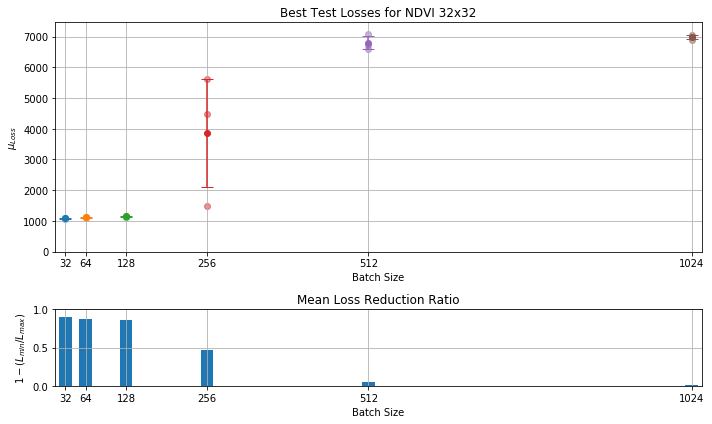

Dataset RGB 32x32, batch_size=32
	Initialization 1 - Best Test Loss: 1047.87
	Initialization 2 - Best Test Loss: 995.58
	Initialization 3 - Best Test Loss: 1013.40
Dataset RGB 32x32, batch_size=64
	Initialization 1 - Best Test Loss: 1077.67
	Initialization 2 - Best Test Loss: 1000.08
	Initialization 3 - Best Test Loss: 1019.08
Dataset RGB 32x32, batch_size=128
	Initialization 1 - Best Test Loss: 1079.69
	Initialization 2 - Best Test Loss: 991.05
	Initialization 3 - Best Test Loss: 1039.82
Dataset RGB 32x32, batch_size=256
	Initialization 1 - Best Test Loss: 4582.66
	Initialization 2 - Best Test Loss: 3412.55
	Initialization 3 - Best Test Loss: 6830.36
Dataset RGB 32x32, batch_size=512
	Initialization 1 - Best Test Loss: 6701.04
	Initialization 2 - Best Test Loss: 6604.89
	Initialization 3 - Best Test Loss: 6777.97
Dataset RGB 32x32, batch_size=1024
	Initialization 1 - Best Test Loss: 6887.96
	Initialization 2 - Best Test Loss: 6730.08
	Initialization 3 - Best Test Loss: 6931.64


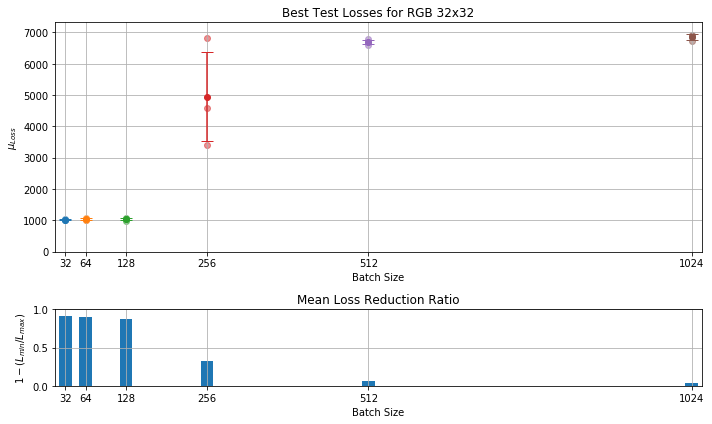

Dataset NDVI 64x64, batch_size=32
	Initialization 1 - Best Test Loss: 982.68
	Initialization 2 - Best Test Loss: 984.77
	Initialization 3 - Best Test Loss: 975.88
Dataset NDVI 64x64, batch_size=64
	Initialization 1 - Best Test Loss: 976.19
	Initialization 2 - Best Test Loss: 1074.22
	Initialization 3 - Best Test Loss: 1028.92
Dataset NDVI 64x64, batch_size=128
	Initialization 1 - Best Test Loss: 1069.41
	Initialization 2 - Best Test Loss: 6806.47
	Initialization 3 - Best Test Loss: 1111.75
Dataset NDVI 64x64, batch_size=256
	Initialization 1 - Best Test Loss: 4362.65
	Initialization 2 - Best Test Loss: 2975.72
	Initialization 3 - Best Test Loss: 6871.54
Dataset NDVI 64x64, batch_size=512
	Initialization 1 - Best Test Loss: 6664.50
	Initialization 2 - Best Test Loss: 6811.89
	Initialization 3 - Best Test Loss: 6600.29
Dataset NDVI 64x64, batch_size=1024
	Initialization 1 - Best Test Loss: 6717.95
	Initialization 2 - Best Test Loss: 6809.24
	Initialization 3 - Best Test Loss: 6763.13


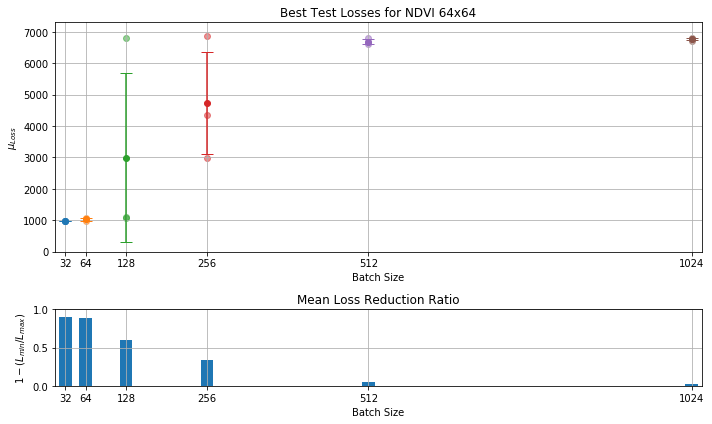

Dataset RGB 64x64, batch_size=32
	Initialization 1 - Best Test Loss: 929.23
	Initialization 2 - Best Test Loss: 842.04
	Initialization 3 - Best Test Loss: 920.07
Dataset RGB 64x64, batch_size=64
	Initialization 1 - Best Test Loss: 913.80
	Initialization 2 - Best Test Loss: 6808.16
	Initialization 3 - Best Test Loss: 880.35
Dataset RGB 64x64, batch_size=128
	Initialization 1 - Best Test Loss: 911.95
	Initialization 2 - Best Test Loss: 933.26
	Initialization 3 - Best Test Loss: 917.19
Dataset RGB 64x64, batch_size=256
	Initialization 1 - Best Test Loss: 2987.86
	Initialization 2 - Best Test Loss: 3413.57
	Initialization 3 - Best Test Loss: 1787.20
Dataset RGB 64x64, batch_size=512
	Initialization 1 - Best Test Loss: 6440.34
	Initialization 2 - Best Test Loss: 6352.65
	Initialization 3 - Best Test Loss: 6898.55
Dataset RGB 64x64, batch_size=1024
	Initialization 1 - Best Test Loss: 6969.51
	Initialization 2 - Best Test Loss: 6794.66
	Initialization 3 - Best Test Loss: 6824.15


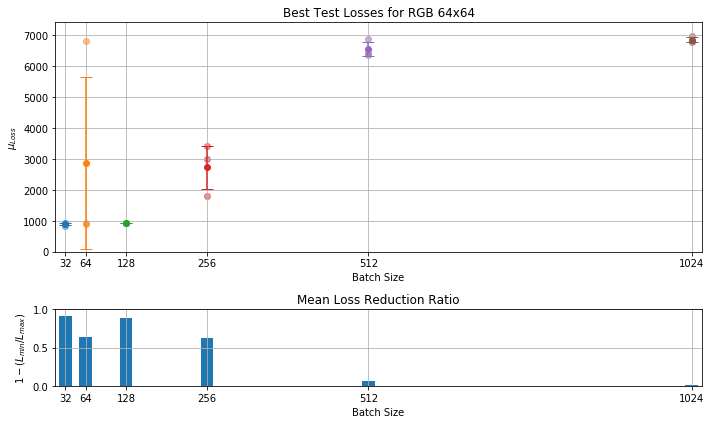

Dataset NDVI 128x128, batch_size=32
	Initialization 1 - Best Test Loss: 798.22
	Initialization 2 - Best Test Loss: 818.31
	Initialization 3 - Best Test Loss: 786.28
Dataset NDVI 128x128, batch_size=64
	Initialization 1 - Best Test Loss: 902.25
	Initialization 2 - Best Test Loss: 919.90
	Initialization 3 - Best Test Loss: 925.30
Dataset NDVI 128x128, batch_size=128
	Initialization 1 - Best Test Loss: 971.34
	Initialization 2 - Best Test Loss: 5153.55
	Initialization 3 - Best Test Loss: 1018.11
Dataset NDVI 128x128, batch_size=256
	Initialization 1 - Best Test Loss: 3712.72
	Initialization 2 - Best Test Loss: 4859.53
	Initialization 3 - Best Test Loss: 3988.16
Dataset NDVI 128x128, batch_size=512
	Initialization 1 - Best Test Loss: 6178.88
	Initialization 2 - Best Test Loss: 6647.85
	Initialization 3 - Best Test Loss: 6408.09
Dataset NDVI 128x128, batch_size=1024
	Initialization 1 - Exception: cuda runtime error (2) : out of memory at /opt/conda/conda-bld/pytorch_1518244421288/work/torch

/home/nevavuor/.conda/envs/pytorch/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/nevavuor/.conda/envs/pytorch/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


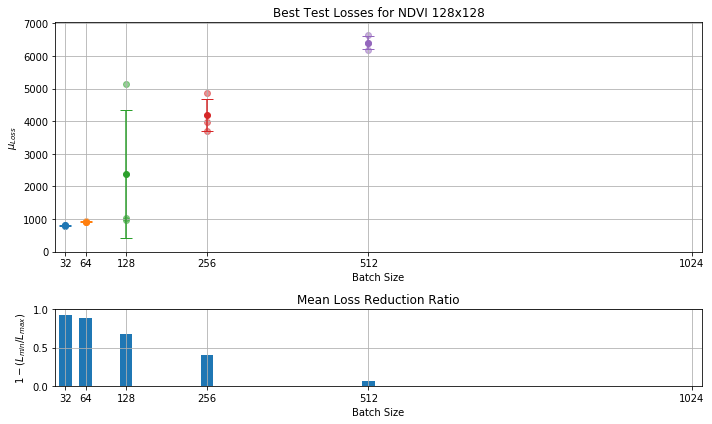

Dataset RGB 128x128, batch_size=32
	Initialization 1 - Best Test Loss: 6656.70
	Initialization 2 - Best Test Loss: 826.32
	Initialization 3 - Best Test Loss: 729.00
Dataset RGB 128x128, batch_size=64
	Initialization 1 - Best Test Loss: 833.66
	Initialization 2 - Best Test Loss: 796.58
	Initialization 3 - Best Test Loss: 791.06
Dataset RGB 128x128, batch_size=128
	Initialization 1 - Best Test Loss: 782.29
	Initialization 2 - Best Test Loss: 792.74
	Initialization 3 - Best Test Loss: 800.44
Dataset RGB 128x128, batch_size=256
	Initialization 1 - Best Test Loss: 3360.24
	Initialization 2 - Best Test Loss: 2821.46
	Initialization 3 - Best Test Loss: 2991.64
Dataset RGB 128x128, batch_size=512
	Initialization 1 - Best Test Loss: 6150.20
	Initialization 2 - Best Test Loss: 6421.86
	Initialization 3 - Best Test Loss: 6374.78
Dataset RGB 128x128, batch_size=1024
	Initialization 1 - Exception: cuda runtime error (2) : out of memory at /opt/conda/conda-bld/pytorch_1518244421288/work/torch/lib/TH

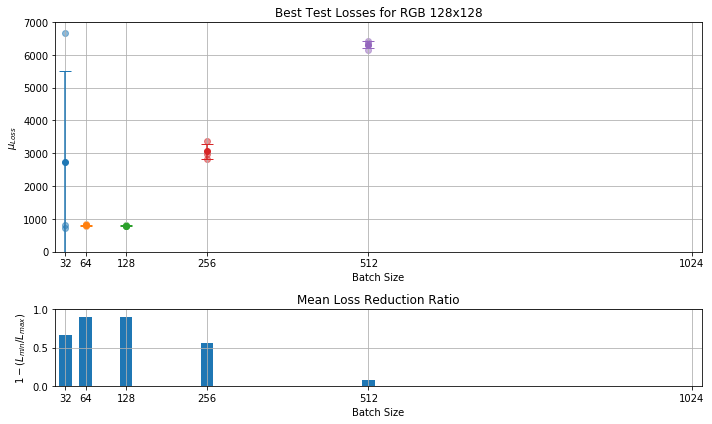

In [4]:
test_optimizer_batch_size(optimizer=None)

#### 1.1.2 RMSProp

Dataset NDVI 32x32, batch_size=32
	Initialization 1 - Best Test Loss: 6998.56
	Initialization 2 - Best Test Loss: 1583.01
	Initialization 3 - Best Test Loss: 1099.98
Dataset NDVI 32x32, batch_size=64
	Initialization 1 - Best Test Loss: 6962.73
	Initialization 2 - Best Test Loss: 6949.46
	Initialization 3 - Best Test Loss: 6962.71
Dataset NDVI 32x32, batch_size=128
	Initialization 1 - Best Test Loss: 1073.98
	Initialization 2 - Best Test Loss: 6977.61
	Initialization 3 - Best Test Loss: 1202.24
Dataset NDVI 32x32, batch_size=256
	Initialization 1 - Best Test Loss: 1180.93
	Initialization 2 - Best Test Loss: 1132.71
	Initialization 3 - Best Test Loss: 1269.30
Dataset NDVI 32x32, batch_size=512
	Initialization 1 - Best Test Loss: 1487.98
	Initialization 2 - Best Test Loss: 1466.78
	Initialization 3 - Best Test Loss: 1298.41
Dataset NDVI 32x32, batch_size=1024
	Initialization 1 - Best Test Loss: 6947.57
	Initialization 2 - Best Test Loss: 6991.75
	Initialization 3 - Best Test Loss: 1673.51

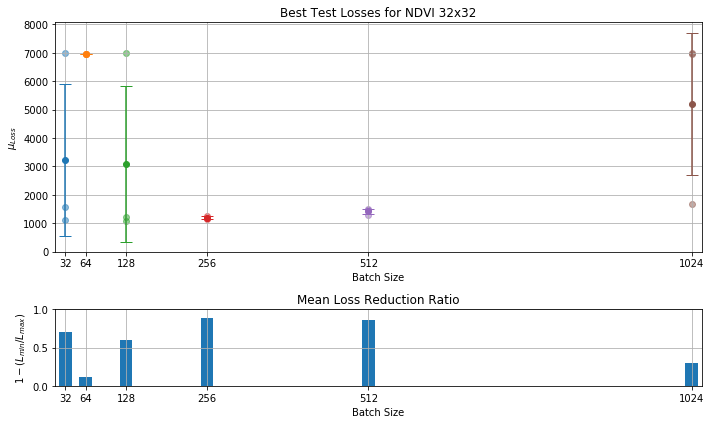

Dataset RGB 32x32, batch_size=32
	Initialization 1 - Best Test Loss: 978.51
	Initialization 2 - Best Test Loss: 1056.41
	Initialization 3 - Best Test Loss: 1037.11
Dataset RGB 32x32, batch_size=64
	Initialization 1 - Best Test Loss: 1049.14
	Initialization 2 - Best Test Loss: 1017.94
	Initialization 3 - Best Test Loss: 6981.63
Dataset RGB 32x32, batch_size=128
	Initialization 1 - Best Test Loss: 7002.09
	Initialization 2 - Best Test Loss: 7045.62
	Initialization 3 - Best Test Loss: 990.91
Dataset RGB 32x32, batch_size=256
	Initialization 1 - Best Test Loss: 1092.46
	Initialization 2 - Best Test Loss: 1114.50
	Initialization 3 - Best Test Loss: 1237.09
Dataset RGB 32x32, batch_size=512
	Initialization 1 - Best Test Loss: 1193.30
	Initialization 2 - Best Test Loss: 1615.51
	Initialization 3 - Best Test Loss: 1326.54
Dataset RGB 32x32, batch_size=1024
	Initialization 1 - Best Test Loss: 1202.52
	Initialization 2 - Best Test Loss: 1560.41
	Initialization 3 - Best Test Loss: 1194.93


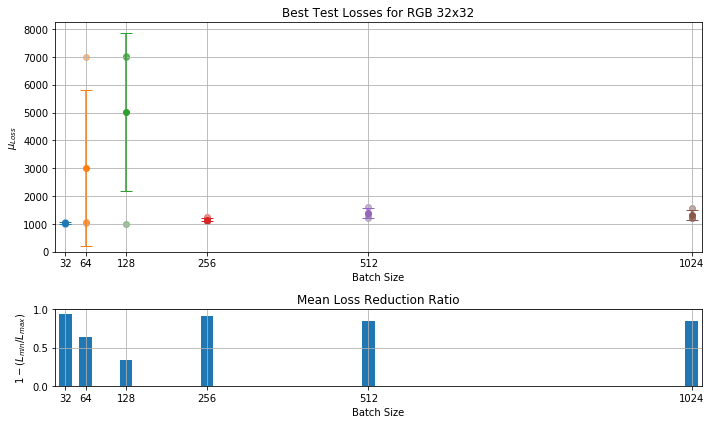

Dataset NDVI 64x64, batch_size=32
	Initialization 1 - Best Test Loss: 969.06
	Initialization 2 - Best Test Loss: 6860.94
	Initialization 3 - Best Test Loss: 6953.90
Dataset NDVI 64x64, batch_size=64
	Initialization 1 - Best Test Loss: 948.11
	Initialization 2 - Best Test Loss: 6828.48
	Initialization 3 - Best Test Loss: 1194.75
Dataset NDVI 64x64, batch_size=128
	Initialization 1 - Best Test Loss: 6839.74
	Initialization 2 - Best Test Loss: 1031.96
	Initialization 3 - Best Test Loss: 6885.71
Dataset NDVI 64x64, batch_size=256
	Initialization 1 - Best Test Loss: 1120.27
	Initialization 2 - Best Test Loss: 1130.71
	Initialization 3 - Best Test Loss: 1098.25
Dataset NDVI 64x64, batch_size=512
	Initialization 1 - Best Test Loss: 6867.74
	Initialization 2 - Best Test Loss: 6863.87
	Initialization 3 - Best Test Loss: 1307.73
Dataset NDVI 64x64, batch_size=1024
	Initialization 1 - Best Test Loss: 1436.59
	Initialization 2 - Best Test Loss: 1135.07
	Initialization 3 - Best Test Loss: 1364.68


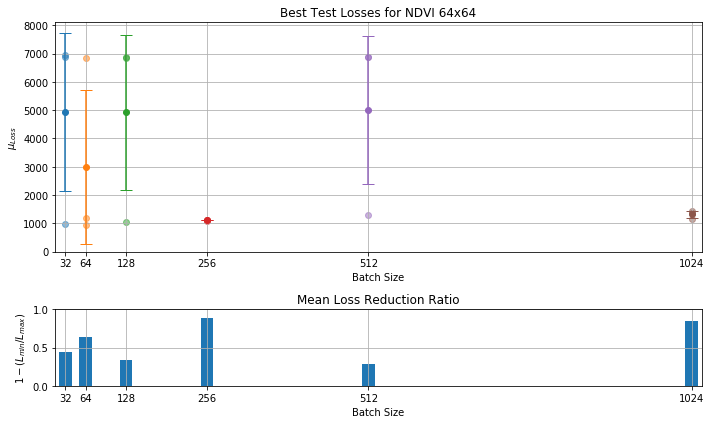

Dataset RGB 64x64, batch_size=32
	Initialization 1 - Best Test Loss: 6886.21
	Initialization 2 - Best Test Loss: 6882.16
	Initialization 3 - Best Test Loss: 884.62
Dataset RGB 64x64, batch_size=64
	Initialization 1 - Best Test Loss: 6843.69
	Initialization 2 - Best Test Loss: 1364.53
	Initialization 3 - Best Test Loss: 6915.21
Dataset RGB 64x64, batch_size=128
	Initialization 1 - Best Test Loss: 920.24
	Initialization 2 - Best Test Loss: 889.78
	Initialization 3 - Best Test Loss: 893.67
Dataset RGB 64x64, batch_size=256
	Initialization 1 - Best Test Loss: 981.86
	Initialization 2 - Best Test Loss: 1039.51
	Initialization 3 - Best Test Loss: 890.75
Dataset RGB 64x64, batch_size=512
	Initialization 1 - Best Test Loss: 1186.00
	Initialization 2 - Best Test Loss: 979.75
	Initialization 3 - Best Test Loss: 971.81
Dataset RGB 64x64, batch_size=1024
	Initialization 1 - Best Test Loss: 6780.42
	Initialization 2 - Best Test Loss: 1003.36
	Initialization 3 - Best Test Loss: 939.93


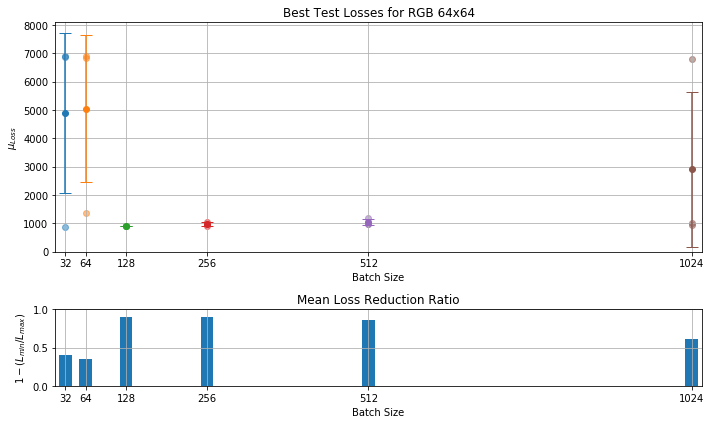

Dataset NDVI 128x128, batch_size=32
	Initialization 1 - Best Test Loss: 6668.27
	Initialization 2 - Best Test Loss: 1083.92
	Initialization 3 - Best Test Loss: 6680.50
Dataset NDVI 128x128, batch_size=64
	Initialization 1 - Best Test Loss: 1411.53
	Initialization 2 - Best Test Loss: 964.09
	Initialization 3 - Best Test Loss: 979.58
Dataset NDVI 128x128, batch_size=128
	Initialization 1 - Best Test Loss: 901.94
	Initialization 2 - Best Test Loss: 931.49
	Initialization 3 - Best Test Loss: 6610.64
Dataset NDVI 128x128, batch_size=256
	Initialization 1 - Best Test Loss: 6726.49
	Initialization 2 - Best Test Loss: 919.67
	Initialization 3 - Best Test Loss: 997.28
Dataset NDVI 128x128, batch_size=512
	Initialization 1 - Best Test Loss: 6631.87
	Initialization 2 - Best Test Loss: 1406.69
	Initialization 3 - Best Test Loss: 934.81
Dataset NDVI 128x128, batch_size=1024
	Initialization 1 - Exception: cuda runtime error (2) : out of memory at /opt/conda/conda-bld/pytorch_1518244421288/work/torch

/home/nevavuor/.conda/envs/pytorch/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/nevavuor/.conda/envs/pytorch/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


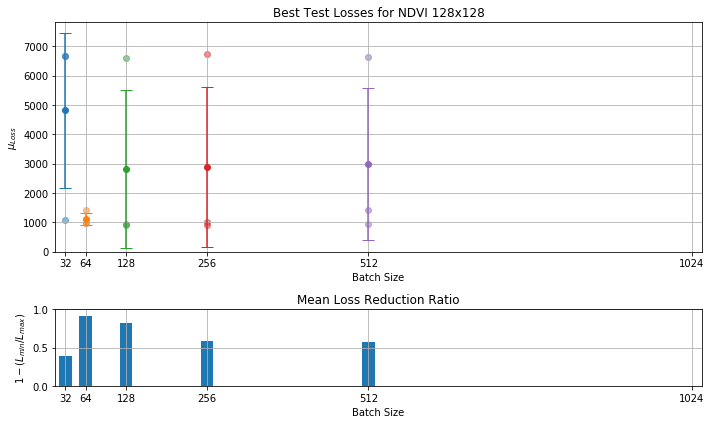

Dataset RGB 128x128, batch_size=32
	Initialization 1 - Best Test Loss: 6620.85
	Initialization 2 - Best Test Loss: 728.03
	Initialization 3 - Best Test Loss: 729.87
Dataset RGB 128x128, batch_size=64
	Initialization 1 - Best Test Loss: 6611.03
	Initialization 2 - Best Test Loss: 709.16
	Initialization 3 - Best Test Loss: 837.18
Dataset RGB 128x128, batch_size=128
	Initialization 1 - Best Test Loss: 6648.92
	Initialization 2 - Best Test Loss: 6623.77
	Initialization 3 - Best Test Loss: 870.83
Dataset RGB 128x128, batch_size=256
	Initialization 1 - Best Test Loss: 976.38
	Initialization 2 - Best Test Loss: 864.10
	Initialization 3 - Best Test Loss: 1005.31
Dataset RGB 128x128, batch_size=512
	Initialization 1 - Best Test Loss: 1804.95
	Initialization 2 - Best Test Loss: 6685.43
	Initialization 3 - Best Test Loss: 1054.49
Dataset RGB 128x128, batch_size=1024
	Initialization 1 - Exception: cuda runtime error (2) : out of memory at /opt/conda/conda-bld/pytorch_1518244421288/work/torch/lib/T

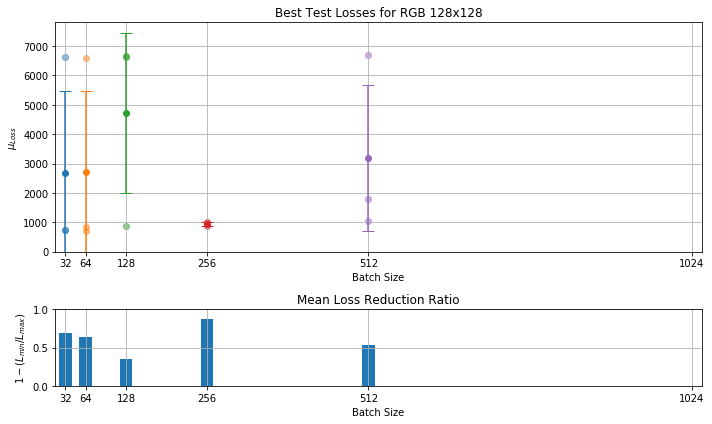

In [5]:
test_optimizer_batch_size(optimizer=optim.RMSprop)

#### 1.1.3 Adadelta

Dataset NDVI 32x32, batch_size=32
	Initialization 1 - Best Test Loss: 1064.74
	Initialization 2 - Best Test Loss: 1155.33
	Initialization 3 - Best Test Loss: 1088.09
Dataset NDVI 32x32, batch_size=64
	Initialization 1 - Best Test Loss: 1101.74
	Initialization 2 - Best Test Loss: 1031.33
	Initialization 3 - Best Test Loss: 1092.86
Dataset NDVI 32x32, batch_size=128
	Initialization 1 - Best Test Loss: 1176.45
	Initialization 2 - Best Test Loss: 1377.71
	Initialization 3 - Best Test Loss: 1178.63
Dataset NDVI 32x32, batch_size=256
	Initialization 1 - Best Test Loss: 1308.39
	Initialization 2 - Best Test Loss: 1336.54
	Initialization 3 - Best Test Loss: 1370.79
Dataset NDVI 32x32, batch_size=512
	Initialization 1 - Best Test Loss: 1306.25
	Initialization 2 - Best Test Loss: 1235.83
	Initialization 3 - Best Test Loss: 1374.58
Dataset NDVI 32x32, batch_size=1024
	Initialization 1 - Best Test Loss: 1944.60
	Initialization 2 - Best Test Loss: 1599.73
	Initialization 3 - Best Test Loss: 1503.28

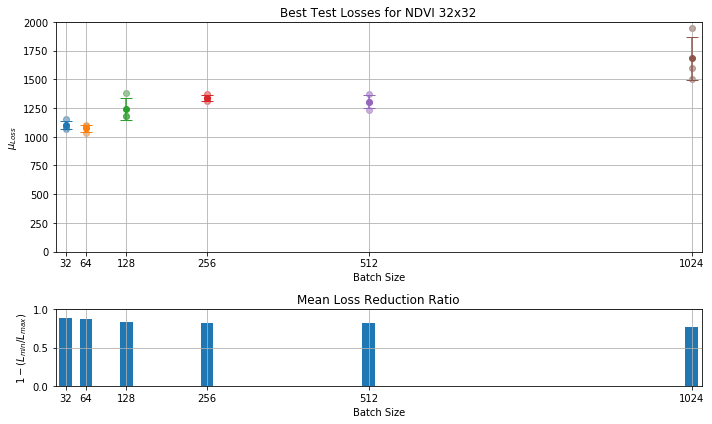

Dataset RGB 32x32, batch_size=32
	Initialization 1 - Best Test Loss: 1011.09
	Initialization 2 - Best Test Loss: 1037.67
	Initialization 3 - Best Test Loss: 1038.44
Dataset RGB 32x32, batch_size=64
	Initialization 1 - Best Test Loss: 1074.94
	Initialization 2 - Best Test Loss: 989.40
	Initialization 3 - Best Test Loss: 1016.00
Dataset RGB 32x32, batch_size=128
	Initialization 1 - Best Test Loss: 1065.51
	Initialization 2 - Best Test Loss: 1006.16
	Initialization 3 - Best Test Loss: 1023.35
Dataset RGB 32x32, batch_size=256
	Initialization 1 - Best Test Loss: 1142.67
	Initialization 2 - Best Test Loss: 1253.46
	Initialization 3 - Best Test Loss: 1219.43
Dataset RGB 32x32, batch_size=512
	Initialization 1 - Best Test Loss: 1195.15
	Initialization 2 - Best Test Loss: 1190.26
	Initialization 3 - Best Test Loss: 1114.64
Dataset RGB 32x32, batch_size=1024
	Initialization 1 - Best Test Loss: 1329.64
	Initialization 2 - Best Test Loss: 1414.34
	Initialization 3 - Best Test Loss: 1644.53


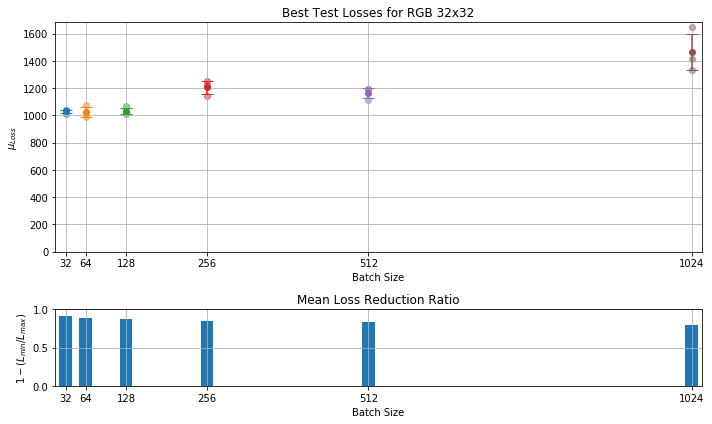

Dataset NDVI 64x64, batch_size=32
	Initialization 1 - Best Test Loss: 1257.95
	Initialization 2 - Best Test Loss: 1090.27
	Initialization 3 - Best Test Loss: 925.85
Dataset NDVI 64x64, batch_size=64
	Initialization 1 - Best Test Loss: 1037.40
	Initialization 2 - Best Test Loss: 1009.43
	Initialization 3 - Best Test Loss: 1082.66
Dataset NDVI 64x64, batch_size=128
	Initialization 1 - Best Test Loss: 1281.74
	Initialization 2 - Best Test Loss: 1104.17
	Initialization 3 - Best Test Loss: 994.33
Dataset NDVI 64x64, batch_size=256
	Initialization 1 - Best Test Loss: 1134.68
	Initialization 2 - Best Test Loss: 1341.57
	Initialization 3 - Best Test Loss: 1267.05
Dataset NDVI 64x64, batch_size=512
	Initialization 1 - Best Test Loss: 1229.83
	Initialization 2 - Best Test Loss: 1264.30
	Initialization 3 - Best Test Loss: 1286.10
Dataset NDVI 64x64, batch_size=1024
	Initialization 1 - Best Test Loss: 1802.94
	Initialization 2 - Best Test Loss: 1343.18
	Initialization 3 - Best Test Loss: 1137.56


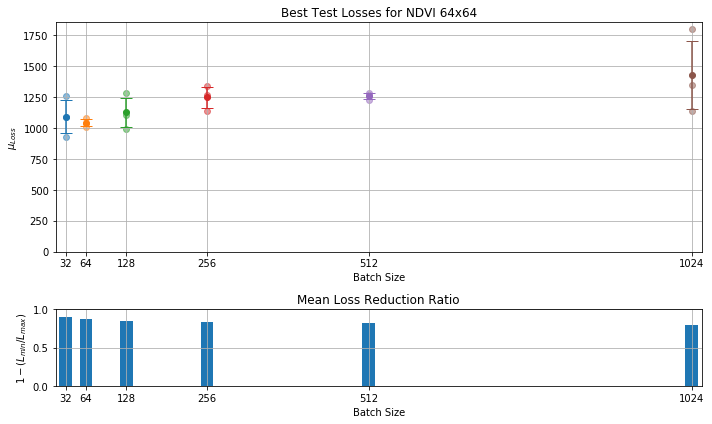

Dataset RGB 64x64, batch_size=32
	Initialization 1 - Best Test Loss: 889.67
	Initialization 2 - Best Test Loss: 851.93
	Initialization 3 - Best Test Loss: 6902.79
Dataset RGB 64x64, batch_size=64
	Initialization 1 - Best Test Loss: 896.86
	Initialization 2 - Best Test Loss: 961.78
	Initialization 3 - Best Test Loss: 921.63
Dataset RGB 64x64, batch_size=128
	Initialization 1 - Best Test Loss: 1089.48
	Initialization 2 - Best Test Loss: 1030.65
	Initialization 3 - Best Test Loss: 1136.05
Dataset RGB 64x64, batch_size=256
	Initialization 1 - Best Test Loss: 1143.80
	Initialization 2 - Best Test Loss: 1138.91
	Initialization 3 - Best Test Loss: 1170.10
Dataset RGB 64x64, batch_size=512
	Initialization 1 - Best Test Loss: 1121.95
	Initialization 2 - Best Test Loss: 1243.25
	Initialization 3 - Best Test Loss: 1009.57
Dataset RGB 64x64, batch_size=1024
	Initialization 1 - Best Test Loss: 1208.01
	Initialization 2 - Best Test Loss: 6868.98
	Initialization 3 - Best Test Loss: 1582.90


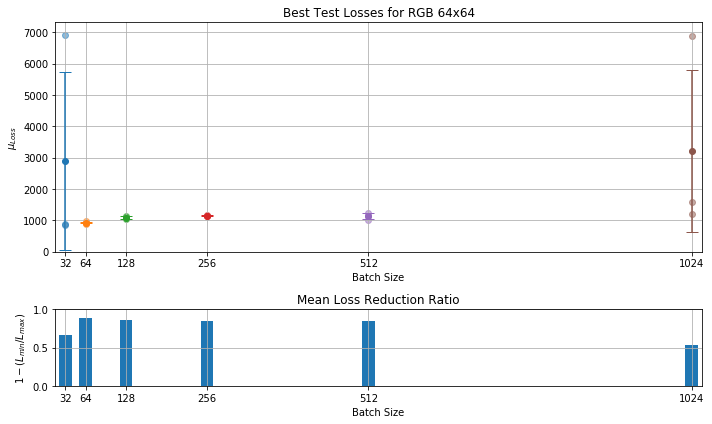

Dataset NDVI 128x128, batch_size=32
	Initialization 1 - Best Test Loss: 790.84
	Initialization 2 - Best Test Loss: 670.38
	Initialization 3 - Best Test Loss: 979.59
Dataset NDVI 128x128, batch_size=64
	Initialization 1 - Best Test Loss: 1283.79
	Initialization 2 - Best Test Loss: 834.52
	Initialization 3 - Best Test Loss: 1340.53
Dataset NDVI 128x128, batch_size=128
	Initialization 1 - Best Test Loss: 1138.18
	Initialization 2 - Best Test Loss: 1162.39
	Initialization 3 - Best Test Loss: 6624.90
Dataset NDVI 128x128, batch_size=256
	Initialization 1 - Best Test Loss: 1061.61
	Initialization 2 - Best Test Loss: 1062.83
	Initialization 3 - Best Test Loss: 1206.98
Dataset NDVI 128x128, batch_size=512
	Initialization 1 - Best Test Loss: 1503.22
	Initialization 2 - Best Test Loss: 1243.24
	Initialization 3 - Best Test Loss: 1496.32
Dataset NDVI 128x128, batch_size=1024
	Initialization 1 - Exception: cuda runtime error (2) : out of memory at /opt/conda/conda-bld/pytorch_1518244421288/work/to

/home/nevavuor/.conda/envs/pytorch/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/nevavuor/.conda/envs/pytorch/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


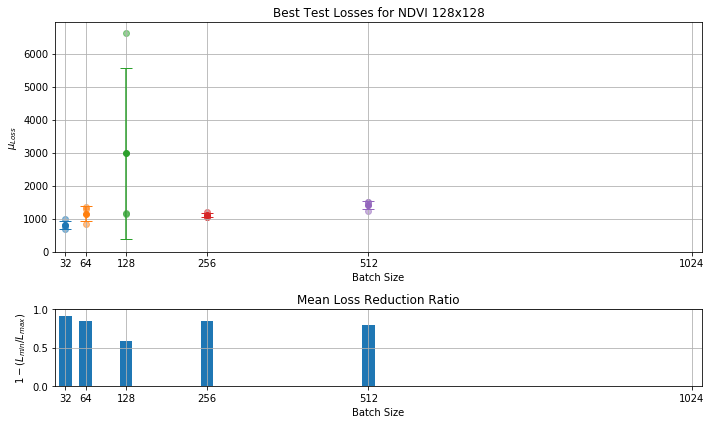

Dataset RGB 128x128, batch_size=32
	Initialization 1 - Best Test Loss: 881.90
	Initialization 2 - Best Test Loss: 715.56
	Initialization 3 - Best Test Loss: 699.67
Dataset RGB 128x128, batch_size=64
	Initialization 1 - Best Test Loss: 826.02
	Initialization 2 - Best Test Loss: 789.04
	Initialization 3 - Best Test Loss: 750.42
Dataset RGB 128x128, batch_size=128
	Initialization 1 - Best Test Loss: 6607.30
	Initialization 2 - Best Test Loss: 999.85
	Initialization 3 - Best Test Loss: 808.59
Dataset RGB 128x128, batch_size=256
	Initialization 1 - Best Test Loss: 1053.86
	Initialization 2 - Best Test Loss: 1005.85
	Initialization 3 - Best Test Loss: 1025.43
Dataset RGB 128x128, batch_size=512
	Initialization 1 - Best Test Loss: 840.53
	Initialization 2 - Best Test Loss: 1175.17
	Initialization 3 - Best Test Loss: 1134.95
Dataset RGB 128x128, batch_size=1024
	Initialization 1 - Exception: cuda runtime error (2) : out of memory at /opt/conda/conda-bld/pytorch_1518244421288/work/torch/lib/THC

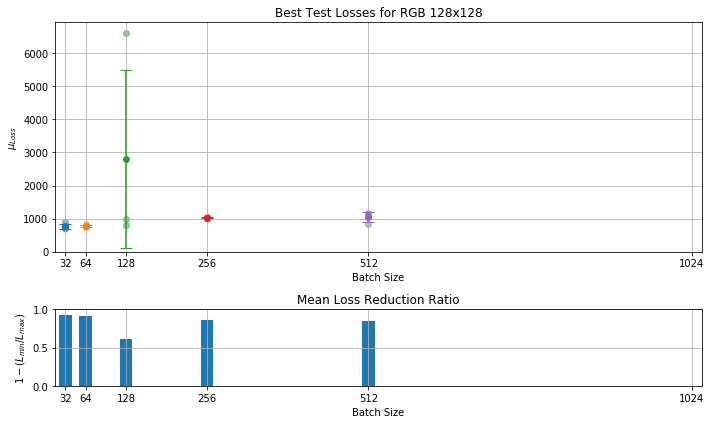

In [6]:
test_optimizer_batch_size(optimizer=optim.Adadelta)

#### 1.1.4 Conclusions

Here are the results from trying out multiple batch size in range $[2^5, 2^{10}]$. The results are given for each optimizer and dataset and presented in table below. The columns represent the batch sizes and the rows the batch-wise feasibilities for each optimizer and dataset. The possible outcomes are **feasible** (Y), **not feasible** (N) and **over the GPU memory limit** (-). 

The feasibility is determined by whether the optimizer was able to start minimizing the test error during three epochs. A telltale sign of the inability to minimize is when the values stay around the level of the median of the target values. This essentially means that the network produces values close to zero while the absolute target values are around 6500. As each dataset-optimizer-pair is initialized and trained three times, **a pair is feasible when majority of initialization provide sufficient minimization**. With three initialization this means that one non-minimizing initialization is within the threshold.

   | 32 | 64 | 128 | 256 | 512 | 1024
 --- | --- | --- | --- | --- | --- | 
**SGD** | | | | | | 
*NDVI32* | Y | Y | Y | Y | N | N
*RGB32* | Y | Y | Y | Y | N | N
*NDVI64* | Y | Y | Y | Y | N | N
*RGB64* | Y | Y | Y | Y | N | N
*NDVI128* | Y | Y | Y | Y | N | -
*RGB128* | Y | Y | Y | Y | N | -
 | | | | | | 
**RMSprop** | | | | | | 
*NDVI32* | Y | N | Y | Y | Y | N
*RGB32* | Y | N | Y | Y | Y | Y
*NDVI64* | N | Y | N | Y | N | Y
*RGB64* | N | N | Y | Y | Y | Y
*NDVI128* | N | Y | Y | Y | Y | -	
*RGB128* | Y | Y | N | Y | Y | -	
 | | | | | | 
**Adadelta** | | | | | | 
*NDVI32* | Y | Y | Y | Y | Y | Y
*RGB32* | Y | Y | Y | Y | Y | Y
*NDVI64* | Y | Y | Y | Y | Y | Y
*RGB64* | Y | Y | Y | Y | Y | Y
*NDVI128* | Y | Y | Y | Y | Y | -
*RGB128* | Y | Y | Y | Y | Y | -

Adadelta seems to be the most robust while the RMSprop is the pickiest one. Also the way the RMSprop behaves induces mistrust towards it as it seems quite unreliable. **The comparison will thus continue with SGD and Adadelta only and with a fixed batch size of 128.** This is because they are reliable and do not seemingly randomly tend to fail to start initializing. This is the case with RMSprop, as there is no clear distinction in the setting that causes the optimization to fail. While SGD fails at times, it is clearly with higher batch sizes. RMSprop fails from the smallest to the largest  batch sizes.

### 1.2 Comparing with Distinct Datasets

We'll begin by looking at the NDVI datasets first. Initially we'll use a tad deeper topology, as it proved to have a large enough capacity to show distinction between training and test losses. This is a good thing as the model is able to fit better. This also makes the use of regularization viable in driving the test losses down.

Then we'll do the same comparison with RGB images. We will train each dataset with each of the optimizers and see how they manage.

In [1]:
import pandas as pd
import numpy as np
from torch import optim
from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN
%matplotlib inline

db_32 = 'field_analysis_10m_32px.db'
db_64 = 'field_analysis_20m_64px.db'
db_128 = 'field_analysis_40m_128px.db'
dbs = [db_32, db_64, db_128]

optimizers = [None, optim.Adadelta]


def test_optimizer(dataloader):
    
    losses = pd.DataFrame()

    for i, db in enumerate(dbs):

        dataset = dataloader(db_name=db)
        dataset_name = dataset.__class__.__name__

        source_bands = 1  # NDVI
        if 'RGB' in dataset_name:
            source_bands = 3

        for optimizer in optimizers:

            source_dim = 32*(2**i)
            optim_name = str(optimizer)

            if optimizer is not None:
                
                optim_name = 'Adadelta'
                
            else:
                
                optim_name = 'SGD'

            print("Dataset={}, Image={}x{}, Optimizer={}".format(
                dataset_name, source_dim, source_dim, optim_name))

            cnn = DroneYieldMeanCNN(
                source_bands=source_bands,
                source_dim=source_dim,
                cnn_layers=6,
                fc_layers=2,
                optimizer=optimizer)

            losses_dict = cnn.train(
                epochs=50,
                training_data=dataset,
                k_cv_folds=3,
                suppress_output=True)
            
            best_loss = np.array(losses_dict['test_losses_mean_std'])[:, 0].min()
            losses.loc[source_dim,optim_name] = best_loss
            
    return losses

#### 1.2.1 NDVI Earlier Dataset

Dataset=DroneNDVIEarlier, Image=32x32, Optimizer=SGD
Best Test Loss: 995.47


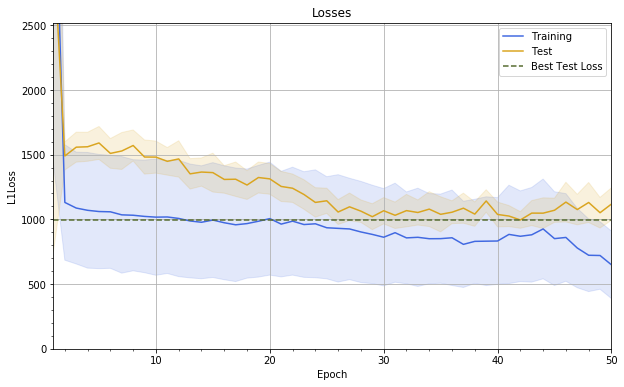

Dataset=DroneNDVIEarlier, Image=32x32, Optimizer=Adadelta
Best Test Loss: 831.53


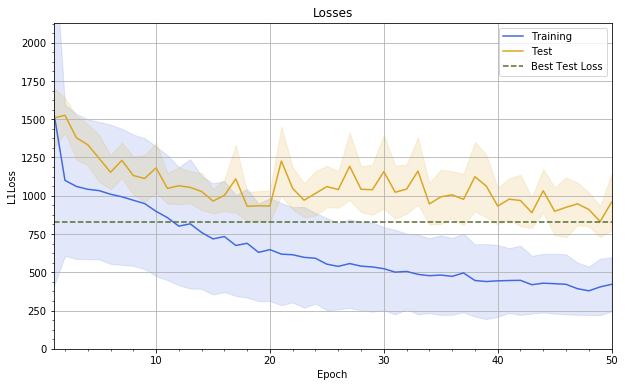

Dataset=DroneNDVIEarlier, Image=64x64, Optimizer=SGD
Best Test Loss: 931.17


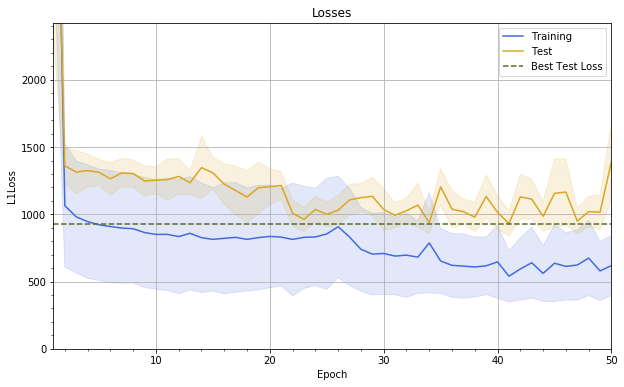

Dataset=DroneNDVIEarlier, Image=64x64, Optimizer=Adadelta
Best Test Loss: 855.64


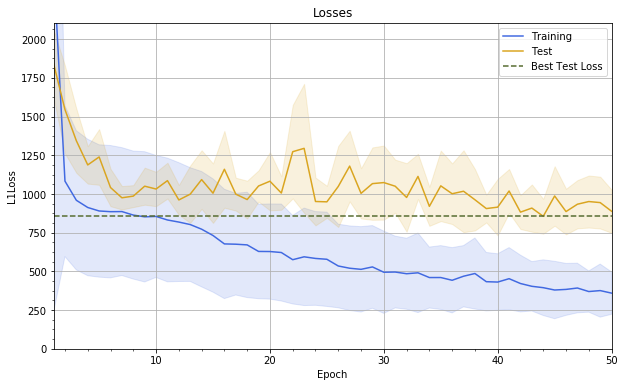

Dataset=DroneNDVIEarlier, Image=128x128, Optimizer=SGD
Best Test Loss: 868.06


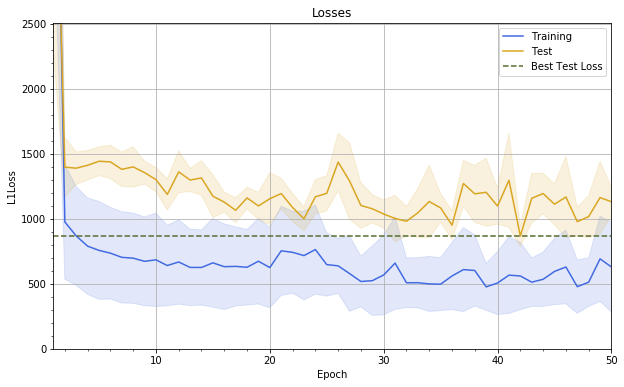

Dataset=DroneNDVIEarlier, Image=128x128, Optimizer=Adadelta
Best Test Loss: 664.84


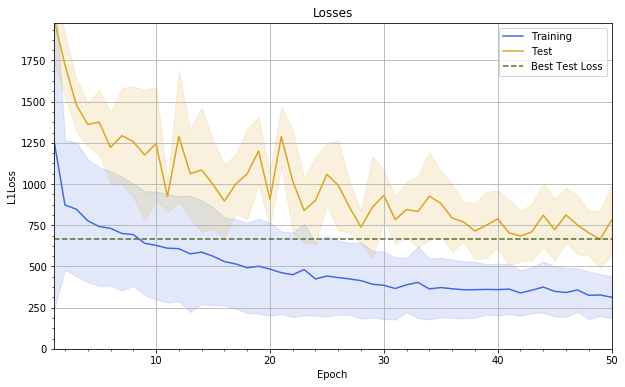

In [2]:
result_earlier_ndvi = test_optimizer(dataloader=dp.DroneNDVIEarlier)

#### 1.2.2 NDVI Later Dataset

Dataset=DroneNDVILater, Image=32x32, Optimizer=SGD
Best Test Loss: 1378.73


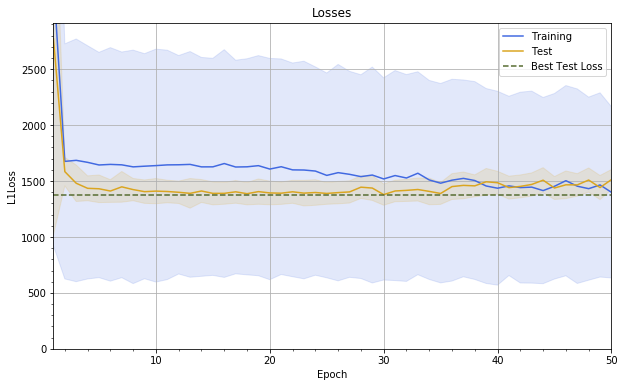

Dataset=DroneNDVILater, Image=32x32, Optimizer=Adadelta
Best Test Loss: 1368.44


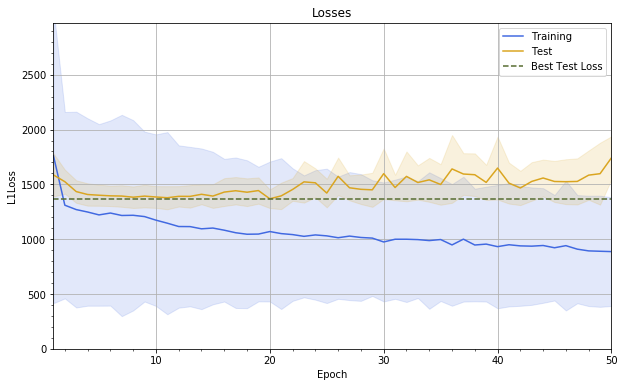

Dataset=DroneNDVILater, Image=64x64, Optimizer=SGD
Best Test Loss: 1269.87


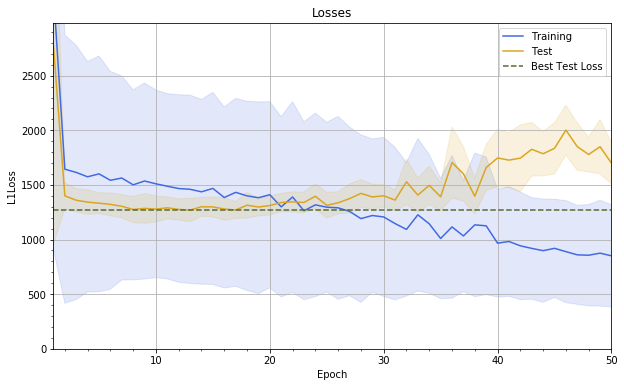

Dataset=DroneNDVILater, Image=64x64, Optimizer=Adadelta
Best Test Loss: 1180.63


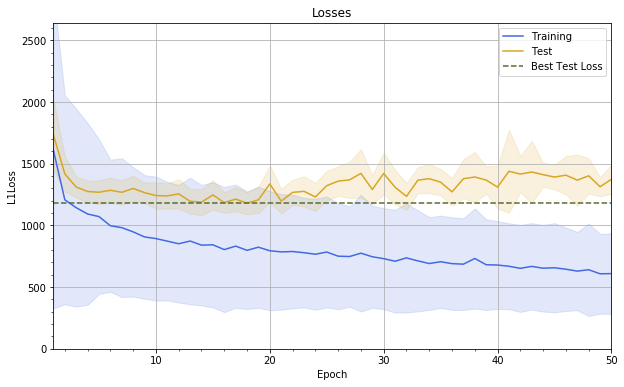

Dataset=DroneNDVILater, Image=128x128, Optimizer=SGD
Best Test Loss: 1196.04


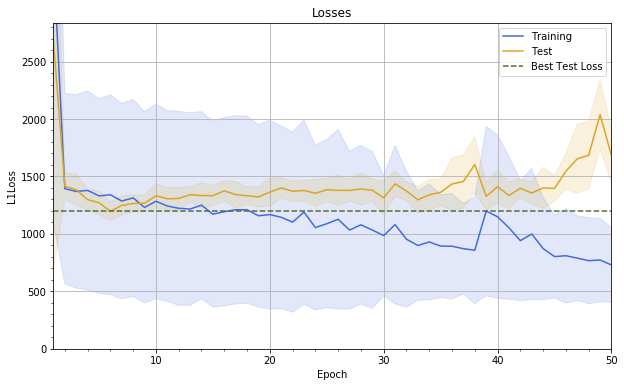

Dataset=DroneNDVILater, Image=128x128, Optimizer=Adadelta
Best Test Loss: 1031.79


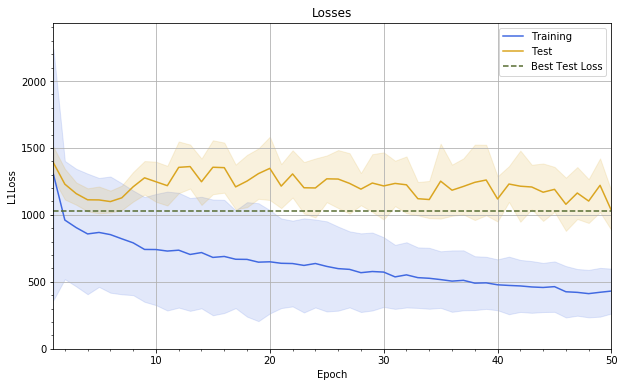

In [3]:
result_later_ndvi = test_optimizer(dataloader=dp.DroneNDVILater)

#### 1.2.3 RGB Earlier Dataset

Dataset=DroneRGBEarlier, Image=32x32, Optimizer=SGD
Best Test Loss: 792.03


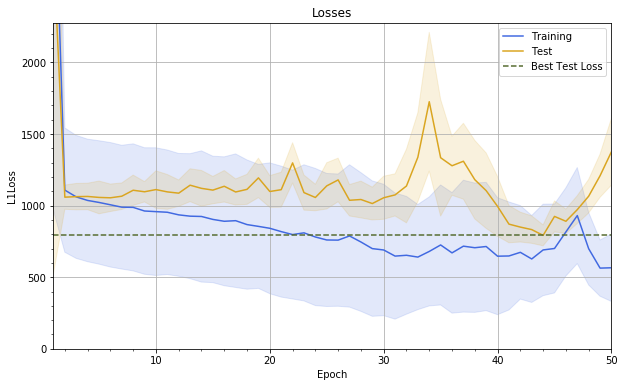

Dataset=DroneRGBEarlier, Image=32x32, Optimizer=Adadelta
Best Test Loss: 696.99


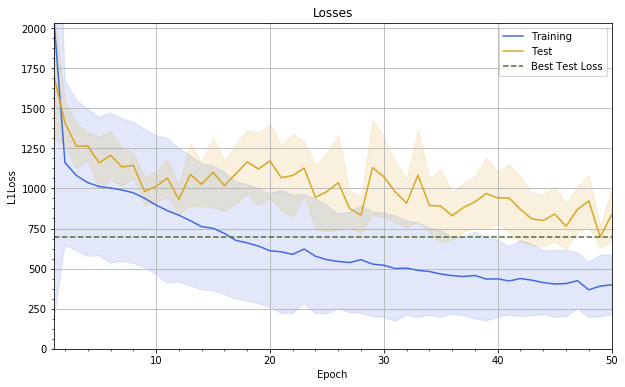

Dataset=DroneRGBEarlier, Image=64x64, Optimizer=SGD
Best Test Loss: 883.84


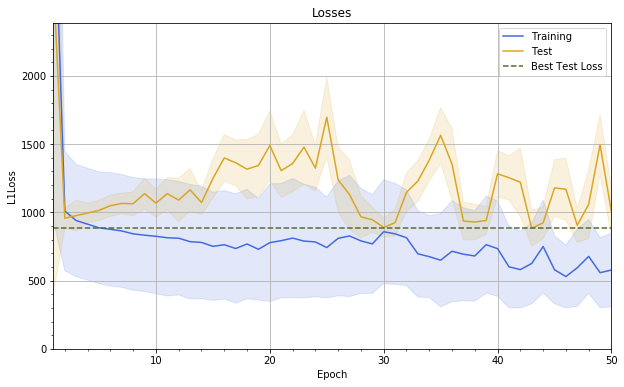

Dataset=DroneRGBEarlier, Image=64x64, Optimizer=Adadelta
Best Test Loss: 699.11


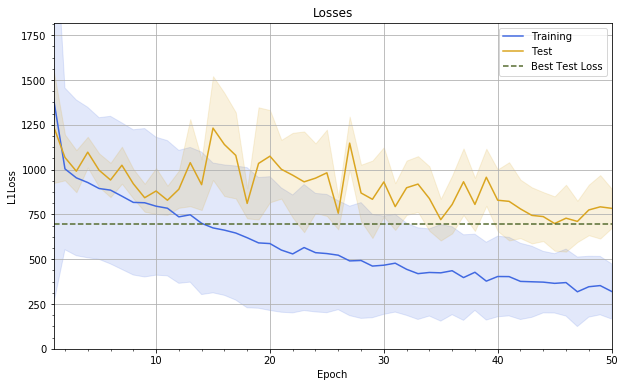

Dataset=DroneRGBEarlier, Image=128x128, Optimizer=SGD
Best Test Loss: 687.72


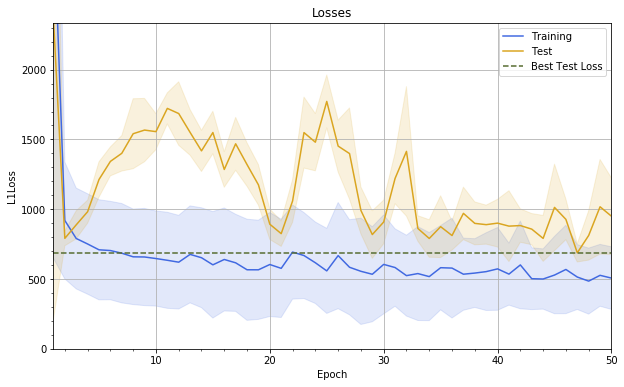

Dataset=DroneRGBEarlier, Image=128x128, Optimizer=Adadelta
Best Test Loss: 554.97


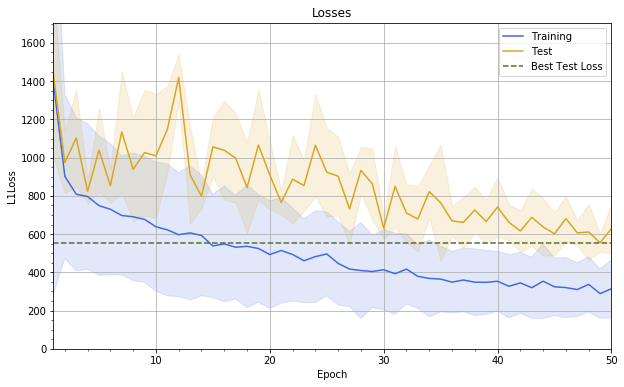

In [4]:
result_earlier_rgb = test_optimizer(dataloader=dp.DroneRGBEarlier)

#### 1.2.4 RGB Later Dataset

Dataset=DroneRGBLater, Image=32x32, Optimizer=SGD
Best Test Loss: 1038.82


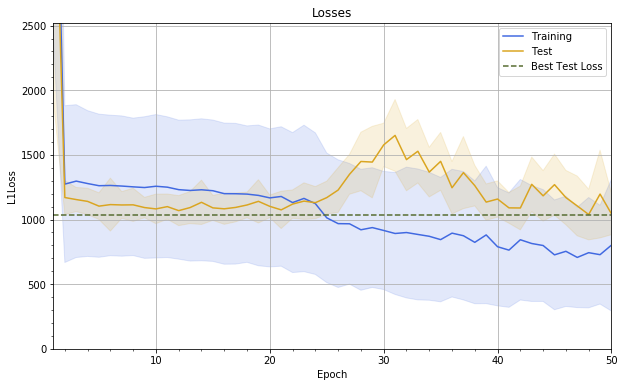

Dataset=DroneRGBLater, Image=32x32, Optimizer=Adadelta
Best Test Loss: 588.61


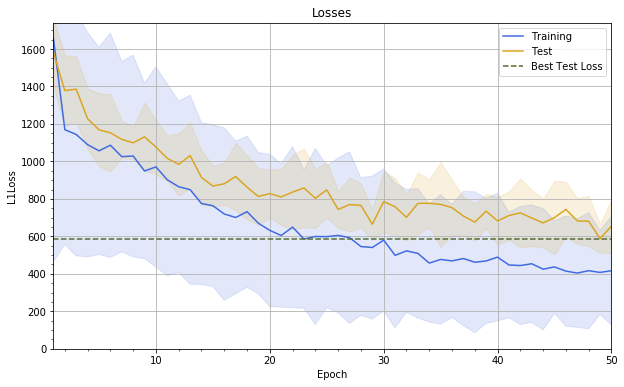

Dataset=DroneRGBLater, Image=64x64, Optimizer=SGD
Best Test Loss: 900.90


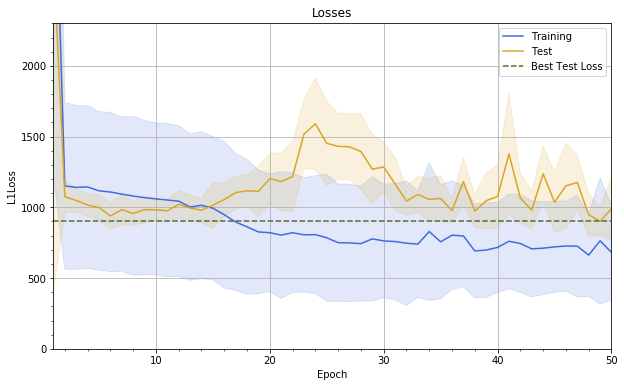

Dataset=DroneRGBLater, Image=64x64, Optimizer=Adadelta
Best Test Loss: 567.07


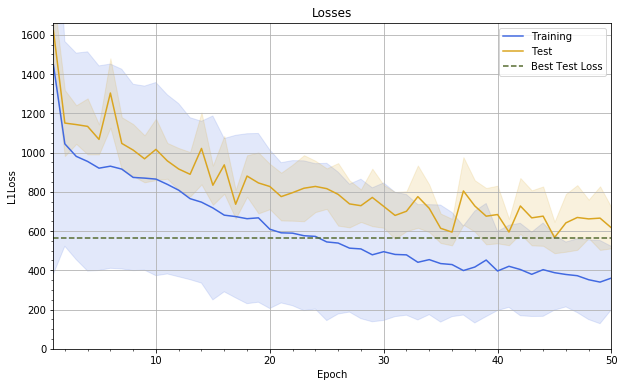

Dataset=DroneRGBLater, Image=128x128, Optimizer=SGD
Best Test Loss: 540.73


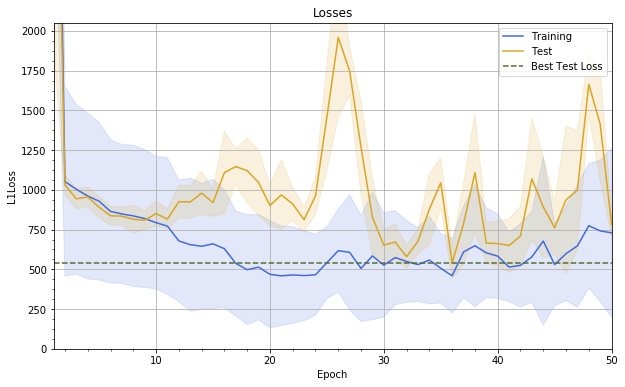

Dataset=DroneRGBLater, Image=128x128, Optimizer=Adadelta
Best Test Loss: 381.66


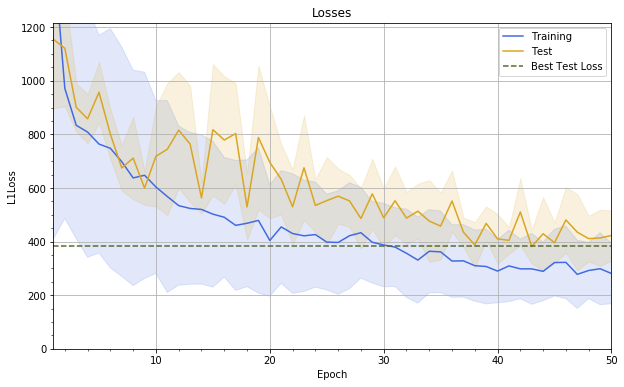

In [5]:
result_later_rgb = test_optimizer(dataloader=dp.DroneRGBLater)

### 1.4 Conclusion for the Optimizer

First we'll take a look at the test losses produced with distinct datasets for each optimizer.

#### 1.4.1 NDVI Datasets

The following tables show the best test L1-losses with distinct datasets and optimizers. The first table is for the earlier dataset with pre-July Drone NDVI images:

In [10]:
result_earlier_ndvi

,SGD,Adadelta
32,995.466228,831.530996
64,931.174973,855.635717
128,868.064123,664.841029


In [11]:
result_later_ndvi

,SGD,Adadelta
32,1378.729429,1368.439753
64,1269.873617,1180.628831
128,1196.035215,1031.791116


#### 1.4.2 RGB Datasets

Let's pull up the tables for period-wise lowest L1-losses with only 60 epochs and no tuning. First one is the table for pre-July RGB datasets:

In [12]:
result_earlier_rgb

,SGD,Adadelta
32,792.027260,696.988411
64,883.835851,699.106946
128,687.717251,554.968372


In [13]:
result_later_rgb

,SGD,Adadelta
32,1038.824291,588.608884
64,900.896259,567.070030
128,540.730753,381.663714


#### 1.4.3 Final Optimizer Conclusions

After ruling out the RMSprop in the optimal batch size exploration stage already the comparison was conducted between the SGD with momentum and Adadelta. Adadelta produced the best results out every training configuration. This means that it succeeded better in utilizing the capacity of the model. **We will thus use Adadelta as the optimizer.**

## 2. Optimal Depth

Next up is comparing several depths for the CNN component of the network. We will attempt at keeping the FC layers at two to really isolate the CNN performance. A good result is achieved when the network is able to even overfit. That means the capacity is sufficient and allows for the utilization of regularization to drive the test error down.

Even though the number of total trainings is high (48 distinct trainings), we will still go through them. In the later stages of the optimization we will use only some of the datasets if similar results are produced to the comparison of optimizers. We will also increase the number of epochs to see where the deeper models would progress.

In [3]:
import pandas as pd
import numpy as np
from torch import optim
from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN
%matplotlib inline

db_32 = 'field_analysis_10m_32px.db'
db_64 = 'field_analysis_20m_64px.db'
db_128 = 'field_analysis_40m_128px.db'
dbs = [db_32, db_64, db_128]


def test_depth(dataloader, bands):

    depths = list(range(4, 14, 2))
    multi_index = pd.MultiIndex.from_product([[32,64,128],depths])
    losses = pd.DataFrame(index=['test','train'],columns=multi_index)

    for i, db in enumerate(dbs):

        dataset = dataloader(db_name=db)
        dataset_name = dataset.__class__.__name__

        source_bands = 1  # NDVI
        if 'RGB' in dataset_name:
            source_bands = 3

        for depth in depths:

            source_dim = 32*(2**i)
            print("Dataset={}, Image={}x{}, CNN Depth={}".format(
                dataset_name, source_dim, source_dim, depth))

            cnn = DroneYieldMeanCNN(
                source_bands=bands,
                source_dim=source_dim,
                cnn_layers=depth,
                fc_layers=2,
                optimizer=optim.Adadelta)

            losses_dict= cnn.train(
                epochs=50,
                training_data=dataset,
                k_cv_folds=3,
                suppress_output=True)
            
            best_test_loss = np.array(losses_dict['test_losses_mean_std'])[:, 0].min()
            best_train_loss = np.array(losses_dict['training_losses_mean_std'])[:, 0].min()
            
            losses.loc['test',(source_dim,depth)] = best_test_loss
            losses.loc['train',(source_dim,depth)] = best_train_loss
            
    return losses

### 2.1 Depth Comparisons

First, as with the optimizer, we'll go through the NDVI datasets. Then the RGB ones.

#### 2.1.1 NDVI Earlier Dataset

Dataset=DroneNDVIEarlier, Image=32x32, CNN Depth=4
Best Test Loss: 911.93


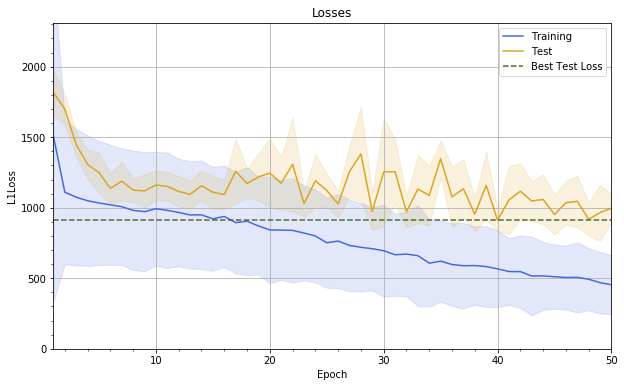

Dataset=DroneNDVIEarlier, Image=32x32, CNN Depth=6
Best Test Loss: 799.67


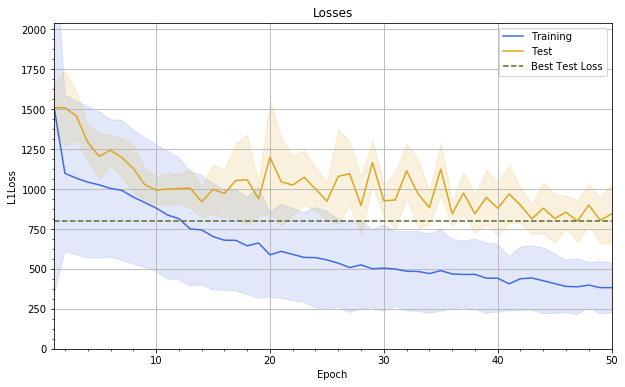

Dataset=DroneNDVIEarlier, Image=32x32, CNN Depth=8
Best Test Loss: 836.31


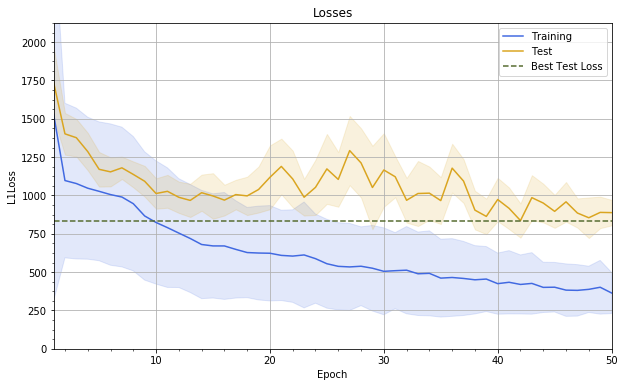

Dataset=DroneNDVIEarlier, Image=32x32, CNN Depth=10
Best Test Loss: 828.30


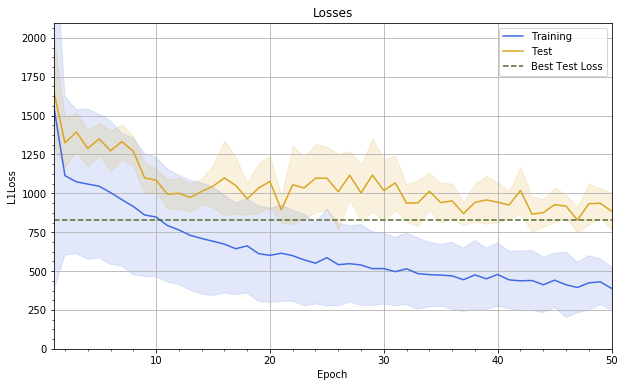

Dataset=DroneNDVIEarlier, Image=32x32, CNN Depth=12
Best Test Loss: 944.26


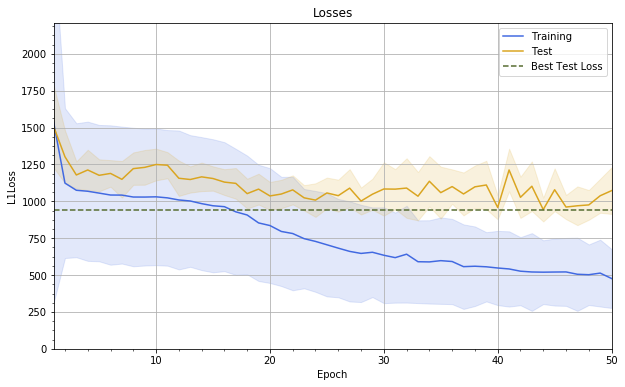

Dataset=DroneNDVIEarlier, Image=64x64, CNN Depth=4
Best Test Loss: 897.72


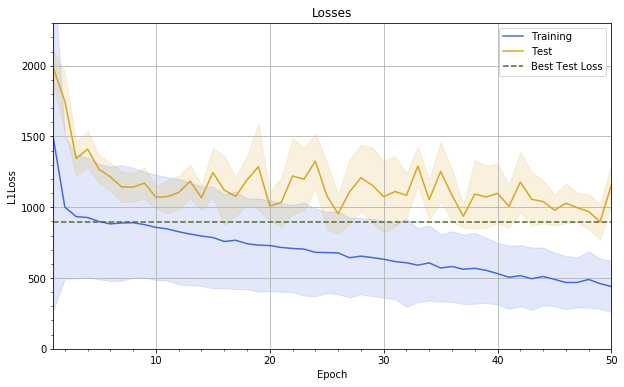

Dataset=DroneNDVIEarlier, Image=64x64, CNN Depth=6
Best Test Loss: 844.05


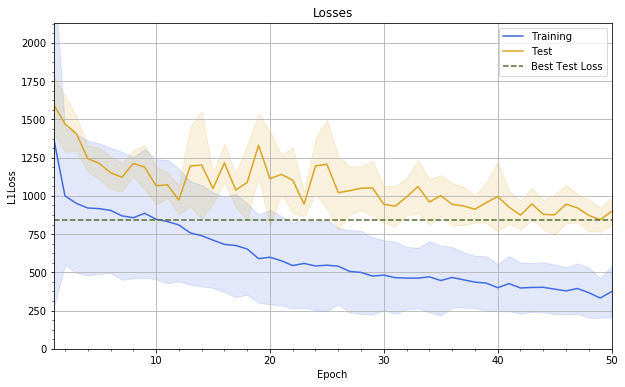

Dataset=DroneNDVIEarlier, Image=64x64, CNN Depth=8
Best Test Loss: 706.19


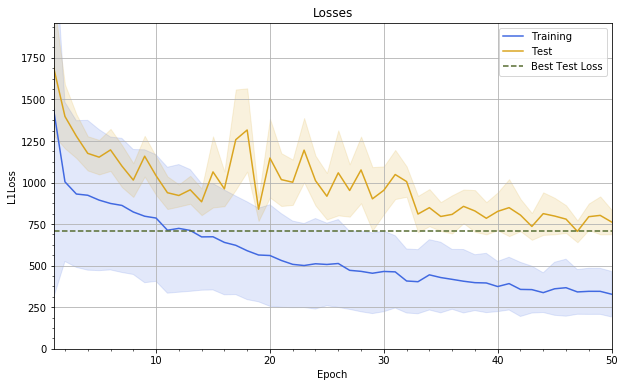

Dataset=DroneNDVIEarlier, Image=64x64, CNN Depth=10
Best Test Loss: 691.86


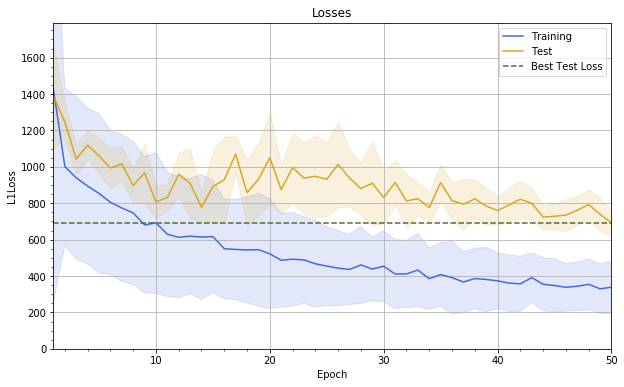

Dataset=DroneNDVIEarlier, Image=64x64, CNN Depth=12
Best Test Loss: 782.79


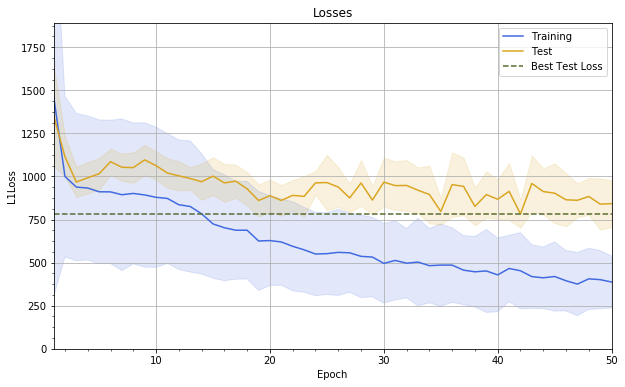

Dataset=DroneNDVIEarlier, Image=128x128, CNN Depth=4
Best Test Loss: 845.80


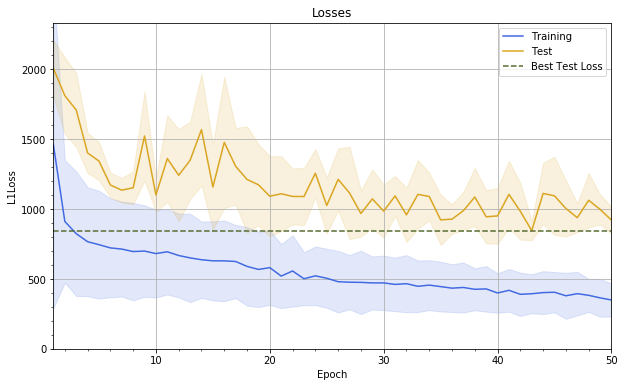

Dataset=DroneNDVIEarlier, Image=128x128, CNN Depth=6
Best Test Loss: 718.12


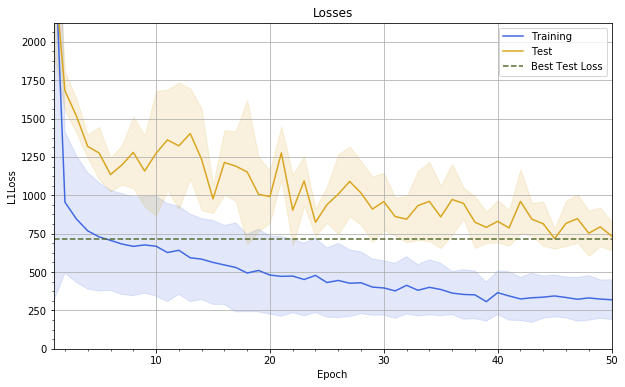

Dataset=DroneNDVIEarlier, Image=128x128, CNN Depth=8
Best Test Loss: 700.64


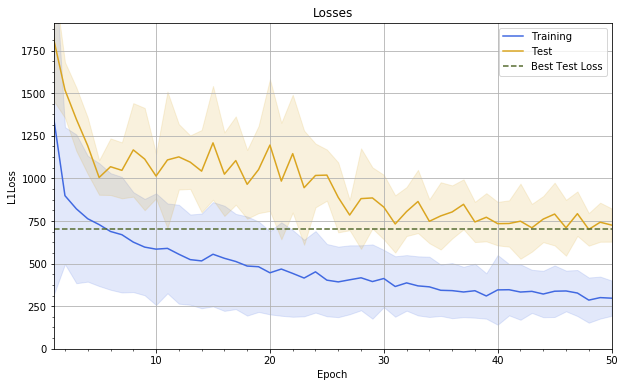

Dataset=DroneNDVIEarlier, Image=128x128, CNN Depth=10
Best Test Loss: 666.16


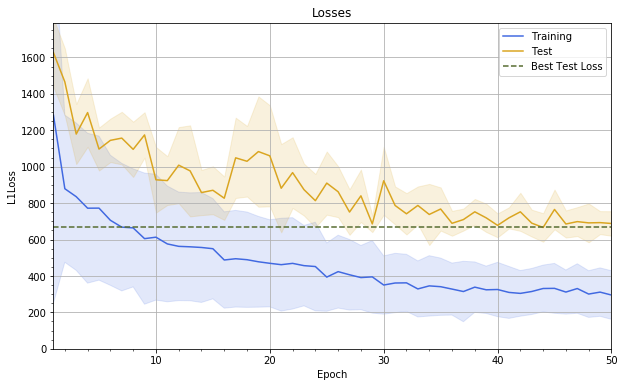

Dataset=DroneNDVIEarlier, Image=128x128, CNN Depth=12
Best Test Loss: 782.62


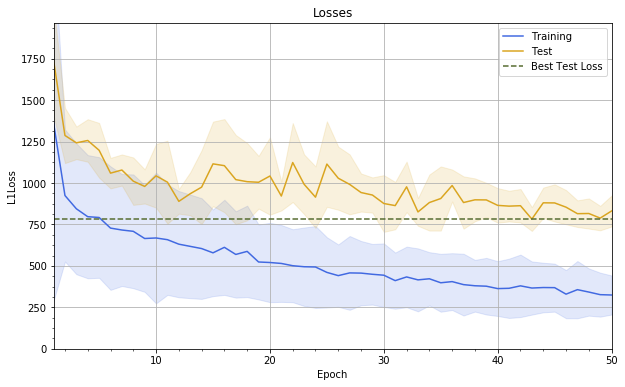

In [4]:
depth_ndvi_earlier = test_depth(dp.DroneNDVIEarlier, 1)

#### 2.1.2 NDVI Later Dataset

Dataset=DroneNDVILater, Image=32x32, CNN Depth=4
Best Test Loss: 1376.76


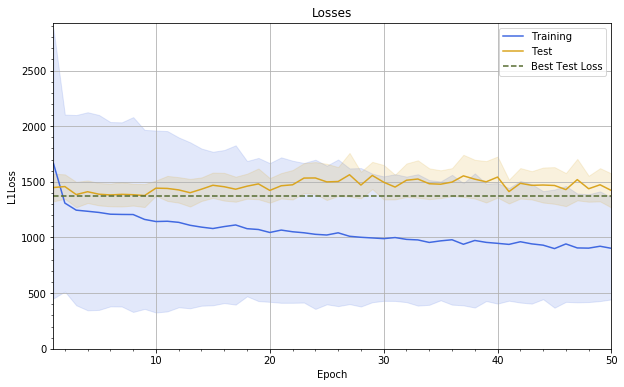

Dataset=DroneNDVILater, Image=32x32, CNN Depth=6
Best Test Loss: 1383.07


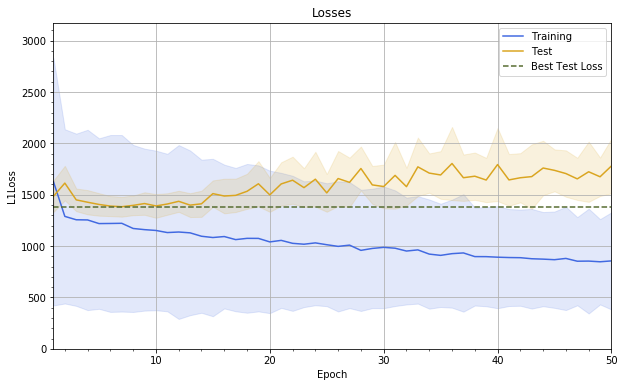

Dataset=DroneNDVILater, Image=32x32, CNN Depth=8
Best Test Loss: 1377.54


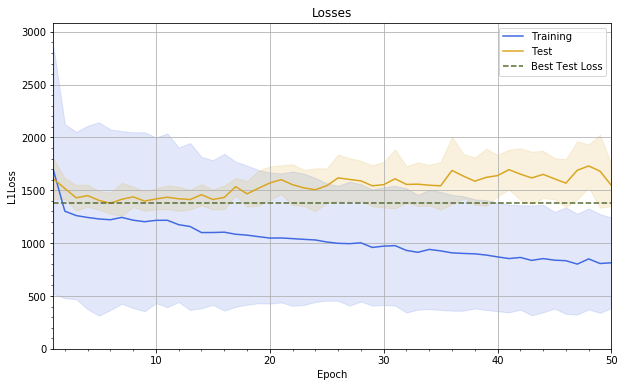

Dataset=DroneNDVILater, Image=32x32, CNN Depth=10
Best Test Loss: 1356.49


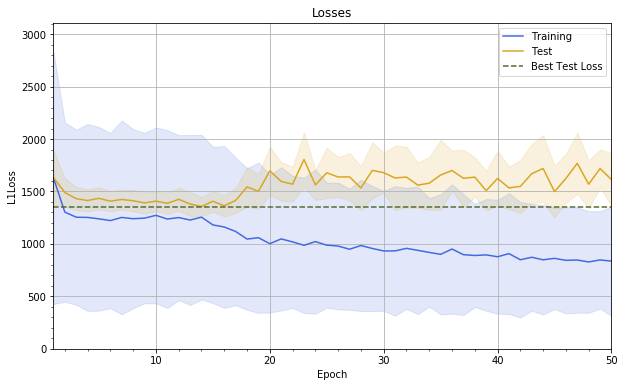

Dataset=DroneNDVILater, Image=32x32, CNN Depth=12
Best Test Loss: 1327.40


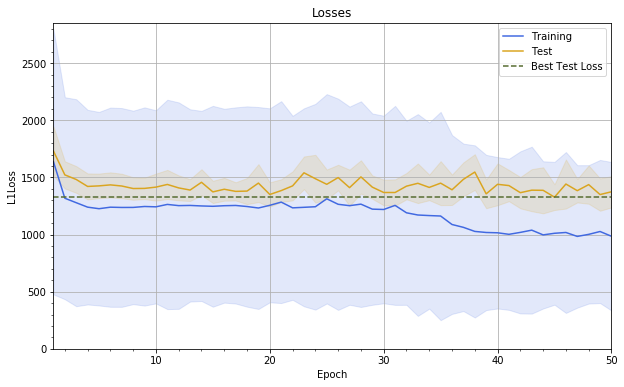

Dataset=DroneNDVILater, Image=64x64, CNN Depth=4
Best Test Loss: 1238.11


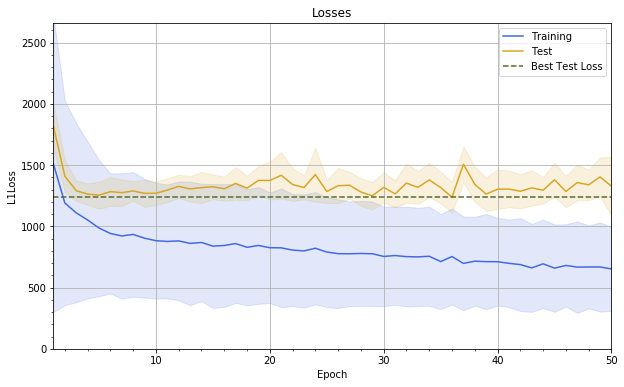

Dataset=DroneNDVILater, Image=64x64, CNN Depth=6
Best Test Loss: 1188.71


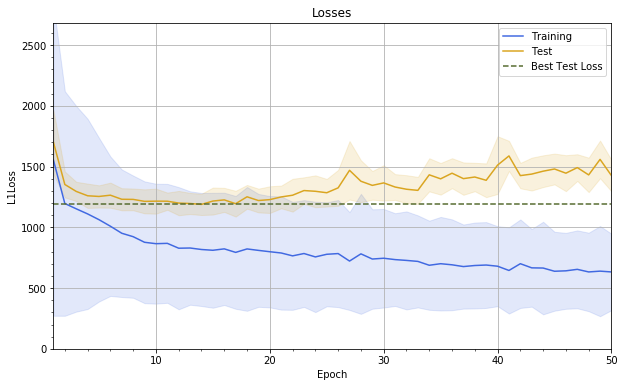

Dataset=DroneNDVILater, Image=64x64, CNN Depth=8
Best Test Loss: 1244.99


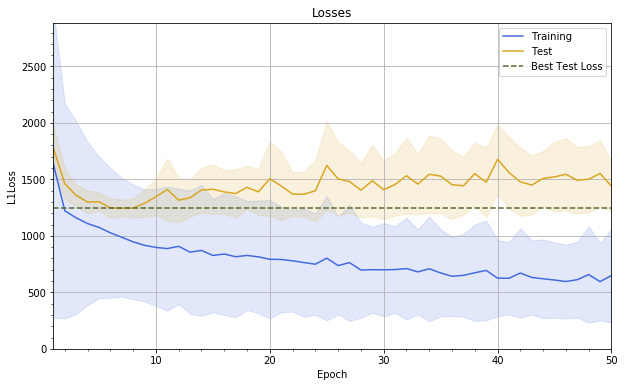

Dataset=DroneNDVILater, Image=64x64, CNN Depth=10
Best Test Loss: 1166.55


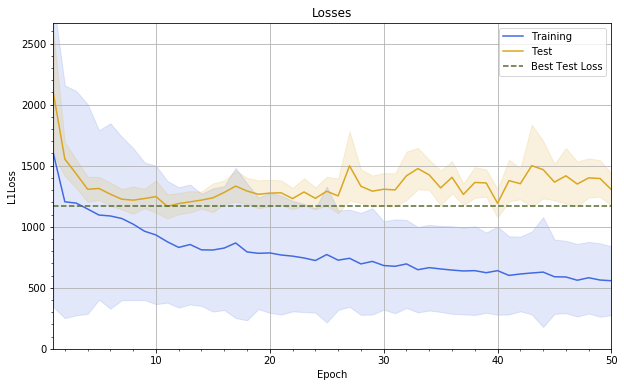

Dataset=DroneNDVILater, Image=64x64, CNN Depth=12
Best Test Loss: 1230.94


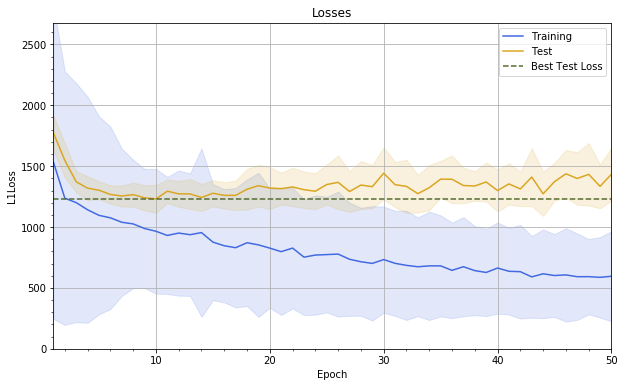

Dataset=DroneNDVILater, Image=128x128, CNN Depth=4
Best Test Loss: 1101.56


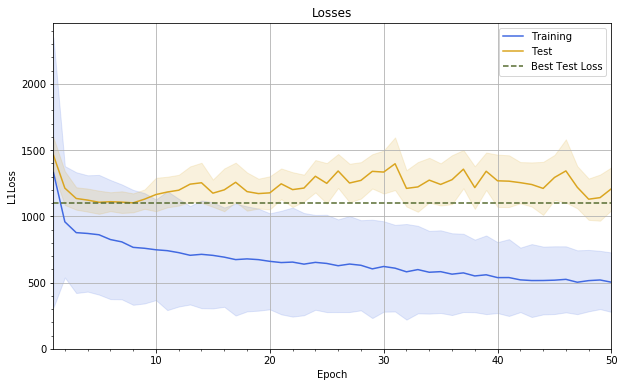

Dataset=DroneNDVILater, Image=128x128, CNN Depth=6
Best Test Loss: 1129.44


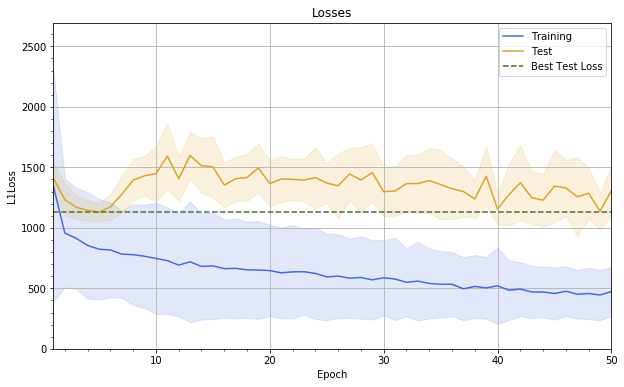

Dataset=DroneNDVILater, Image=128x128, CNN Depth=8
Best Test Loss: 1116.44


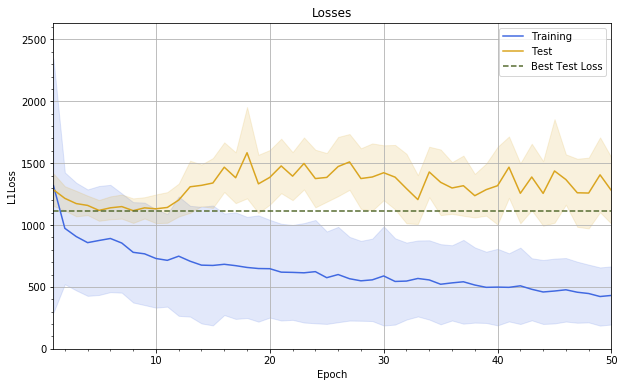

Dataset=DroneNDVILater, Image=128x128, CNN Depth=10
Best Test Loss: 1096.43


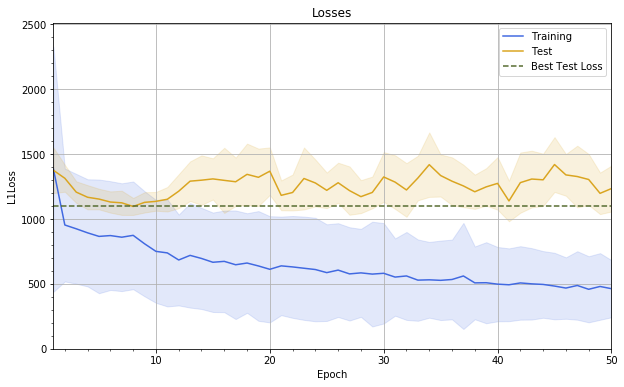

Dataset=DroneNDVILater, Image=128x128, CNN Depth=12
Best Test Loss: 967.22


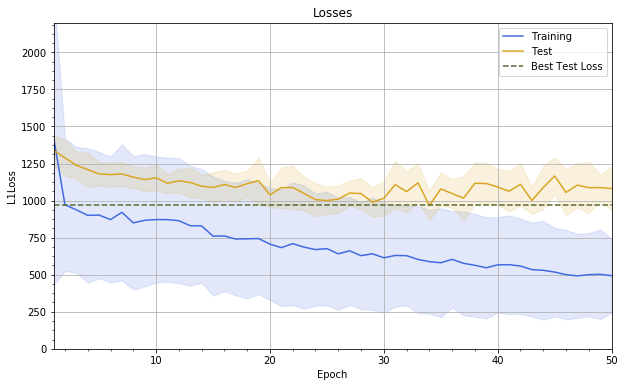

In [5]:
depth_ndvi_later = test_depth(dp.DroneNDVILater, 1)

#### 2.1.3 RGB Earlier Dataset

Dataset=DroneRGBEarlier, Image=32x32, CNN Depth=4
Best Test Loss: 806.81


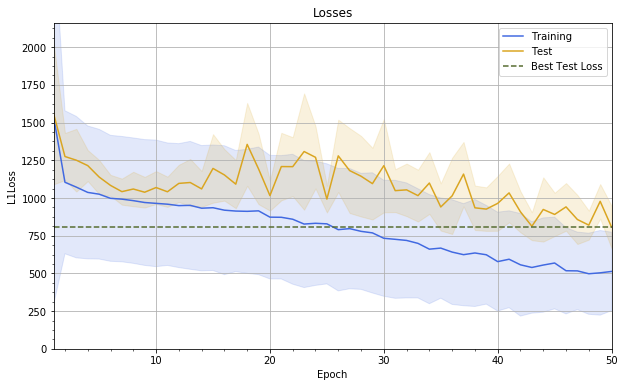

Dataset=DroneRGBEarlier, Image=32x32, CNN Depth=6
Best Test Loss: 645.95


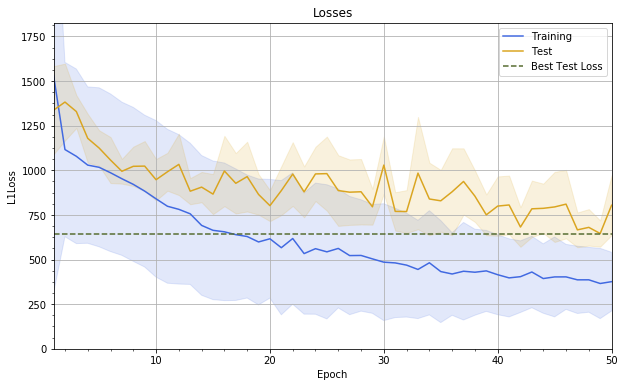

Dataset=DroneRGBEarlier, Image=32x32, CNN Depth=8
Best Test Loss: 572.07


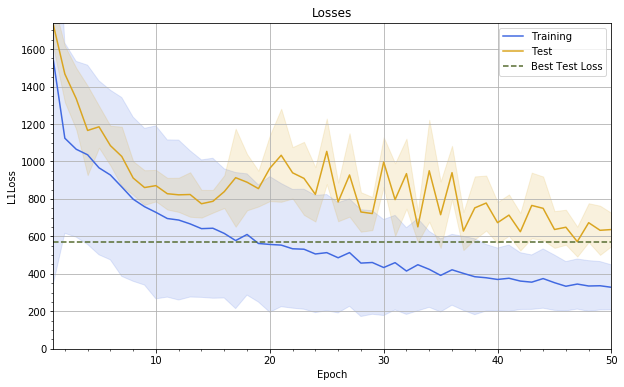

Dataset=DroneRGBEarlier, Image=32x32, CNN Depth=10
Best Test Loss: 490.30


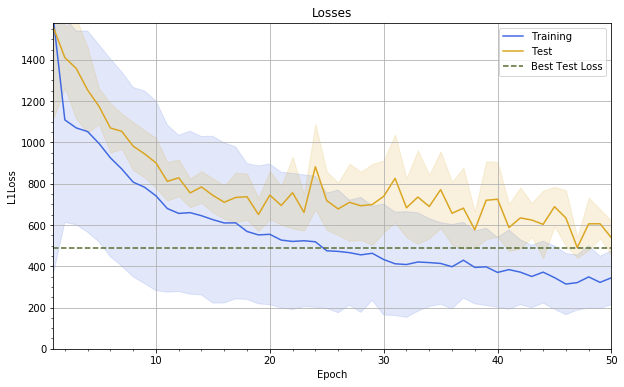

Dataset=DroneRGBEarlier, Image=32x32, CNN Depth=12
Best Test Loss: 619.16


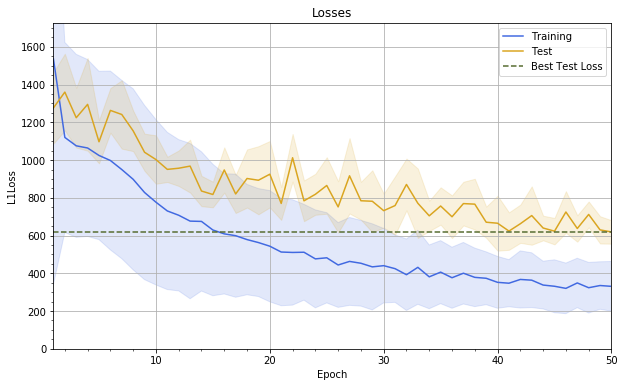

Dataset=DroneRGBEarlier, Image=64x64, CNN Depth=4
Best Test Loss: 767.44


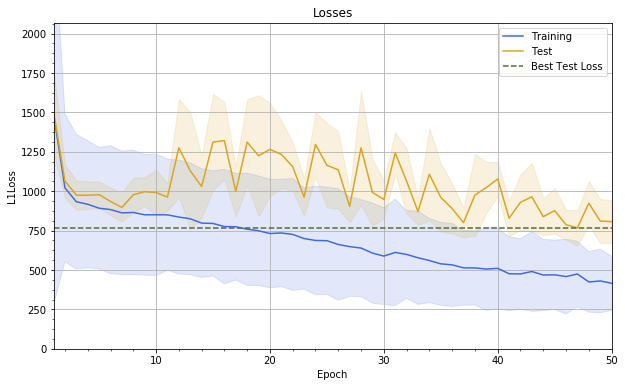

Dataset=DroneRGBEarlier, Image=64x64, CNN Depth=6
Best Test Loss: 740.29


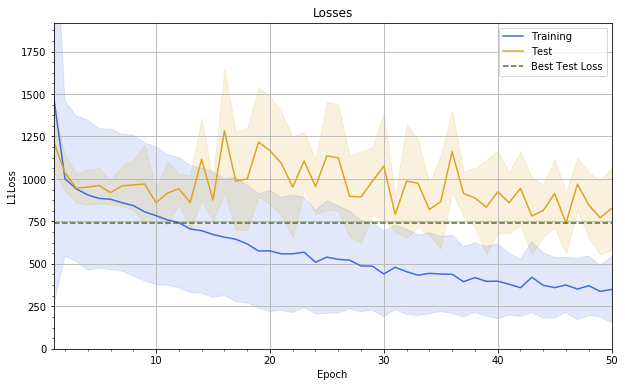

Dataset=DroneRGBEarlier, Image=64x64, CNN Depth=8
Best Test Loss: 618.93


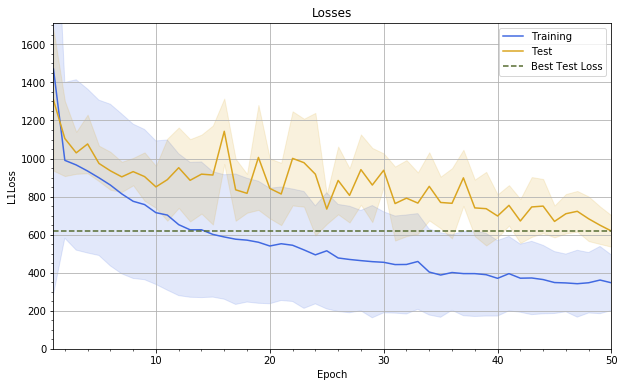

Dataset=DroneRGBEarlier, Image=64x64, CNN Depth=10
Best Test Loss: 574.11


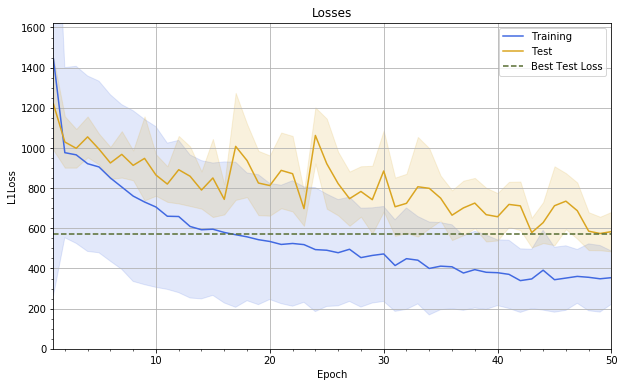

Dataset=DroneRGBEarlier, Image=64x64, CNN Depth=12
Best Test Loss: 615.36


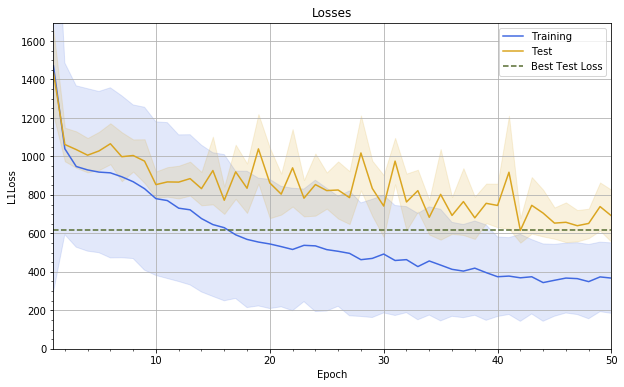

Dataset=DroneRGBEarlier, Image=128x128, CNN Depth=4
Best Test Loss: 679.51


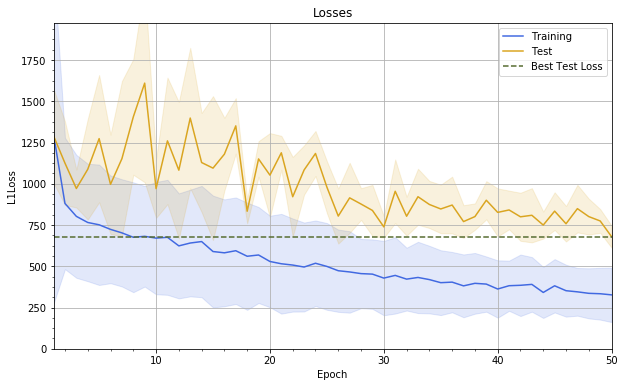

Dataset=DroneRGBEarlier, Image=128x128, CNN Depth=6
Best Test Loss: 555.29


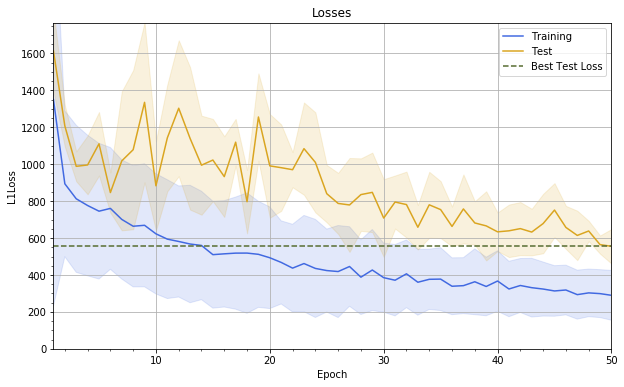

Dataset=DroneRGBEarlier, Image=128x128, CNN Depth=8
Best Test Loss: 534.89


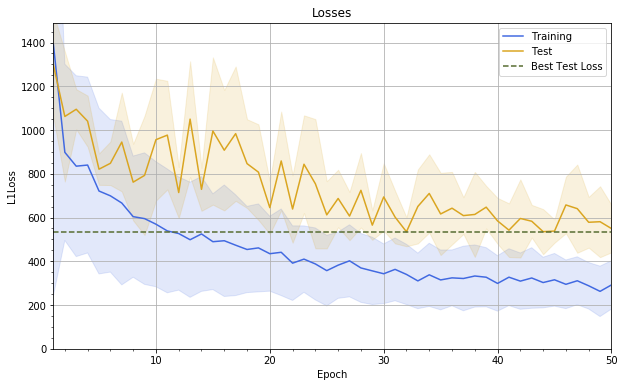

Dataset=DroneRGBEarlier, Image=128x128, CNN Depth=10
Best Test Loss: 484.82


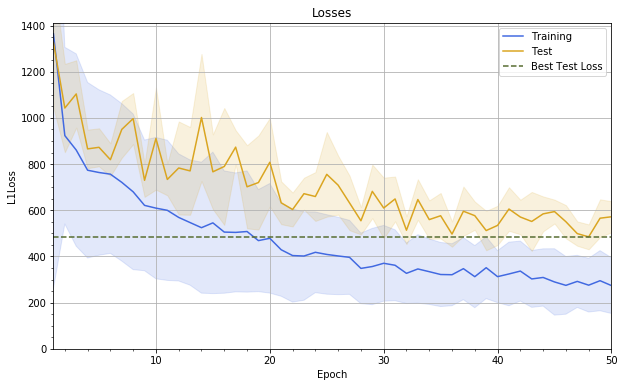

Dataset=DroneRGBEarlier, Image=128x128, CNN Depth=12
Best Test Loss: 704.98


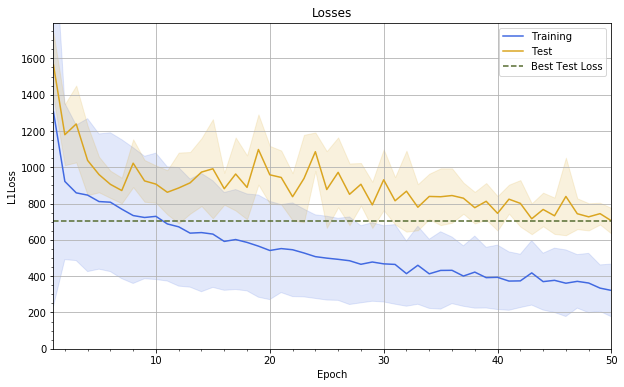

In [6]:
depth_rgb_earlier = test_depth(dp.DroneRGBEarlier, 3)

#### 2.1.4 RGB Later Dataset

Dataset=DroneRGBLater, Image=32x32, CNN Depth=4
Best Test Loss: 666.32


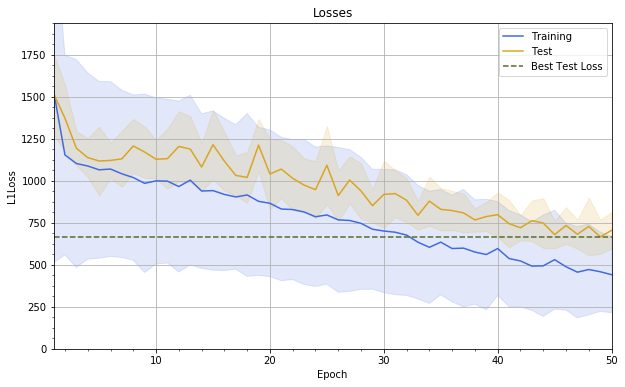

Dataset=DroneRGBLater, Image=32x32, CNN Depth=6
Best Test Loss: 579.10


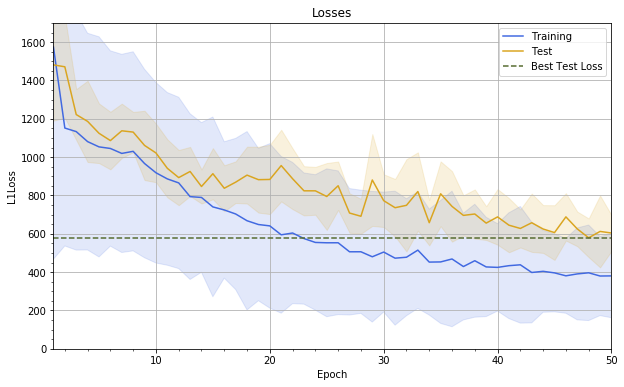

Dataset=DroneRGBLater, Image=32x32, CNN Depth=8
Best Test Loss: 645.19


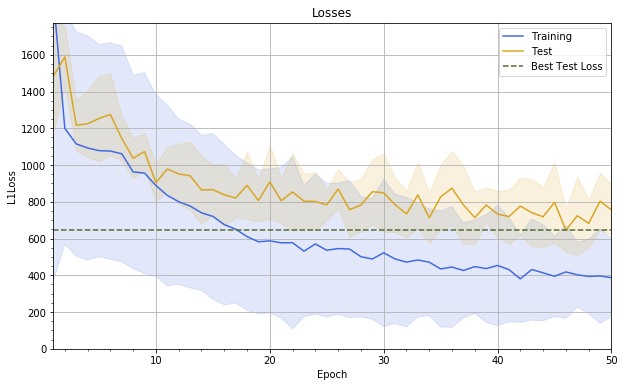

Dataset=DroneRGBLater, Image=32x32, CNN Depth=10
Best Test Loss: 646.61


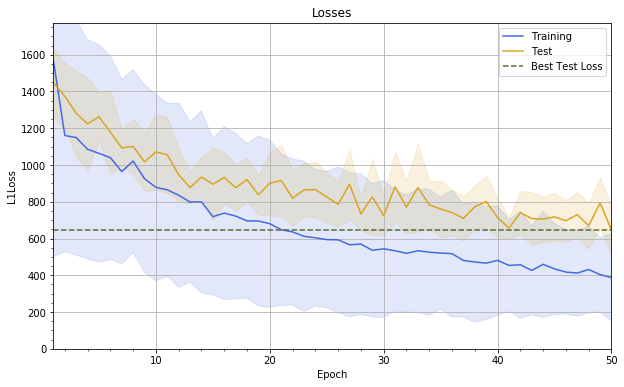

Dataset=DroneRGBLater, Image=32x32, CNN Depth=12
Best Test Loss: 695.63


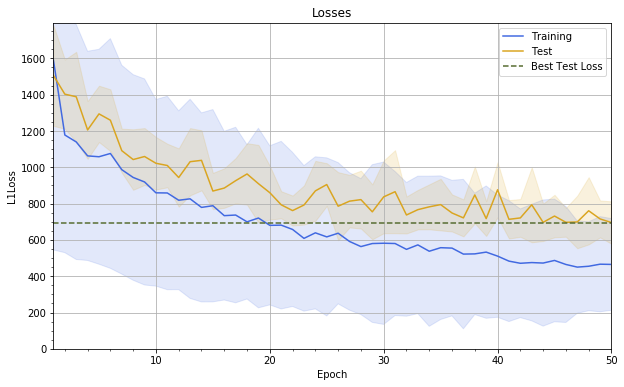

Dataset=DroneRGBLater, Image=64x64, CNN Depth=4
Best Test Loss: 609.77


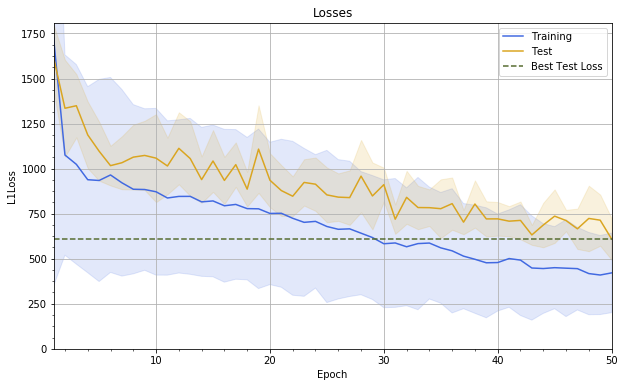

Dataset=DroneRGBLater, Image=64x64, CNN Depth=6
Best Test Loss: 552.15


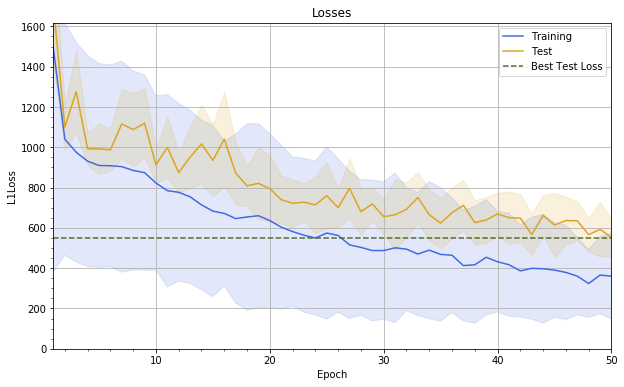

Dataset=DroneRGBLater, Image=64x64, CNN Depth=8
Best Test Loss: 590.50


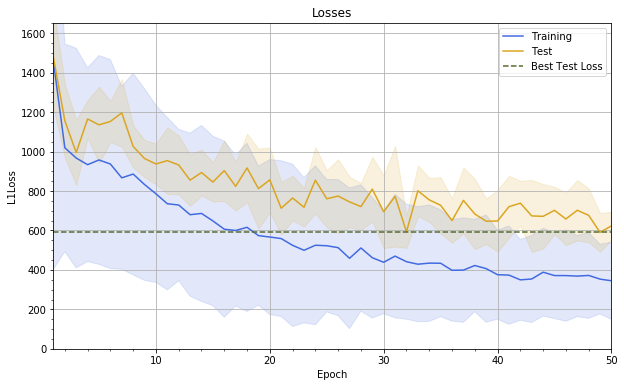

Dataset=DroneRGBLater, Image=64x64, CNN Depth=10
Best Test Loss: 625.42


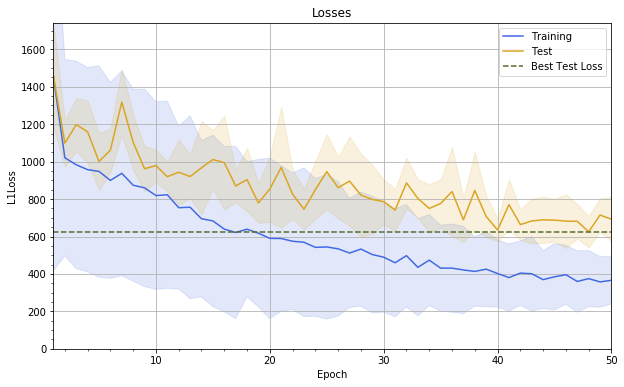

Dataset=DroneRGBLater, Image=64x64, CNN Depth=12
Best Test Loss: 618.16


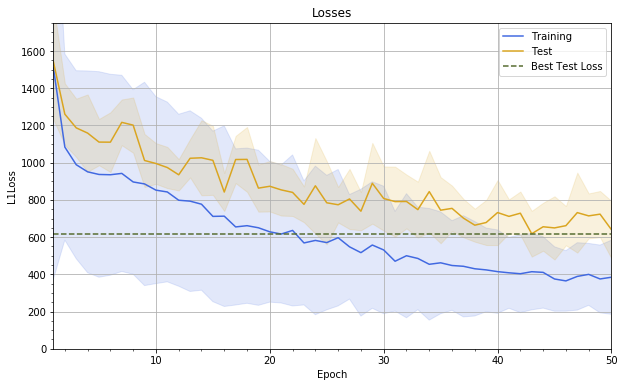

Dataset=DroneRGBLater, Image=128x128, CNN Depth=4
Best Test Loss: 430.76


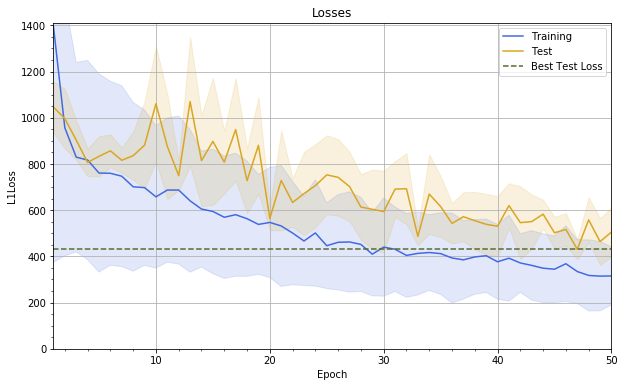

Dataset=DroneRGBLater, Image=128x128, CNN Depth=6
Best Test Loss: 373.48


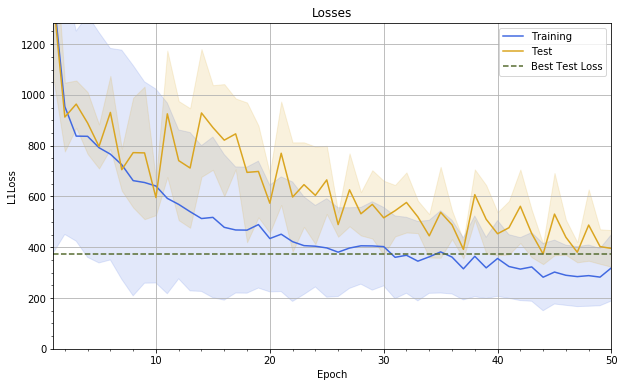

Dataset=DroneRGBLater, Image=128x128, CNN Depth=8
Best Test Loss: 372.41


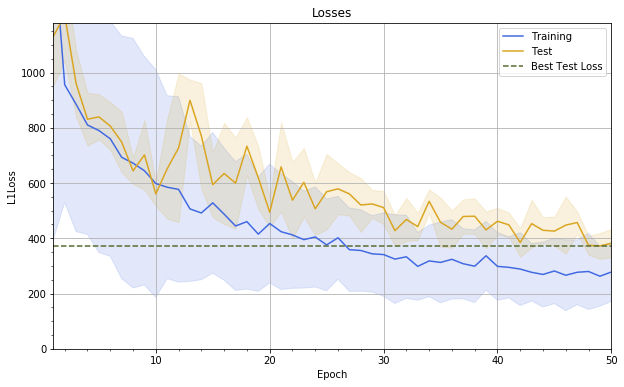

Dataset=DroneRGBLater, Image=128x128, CNN Depth=10
Best Test Loss: 427.63


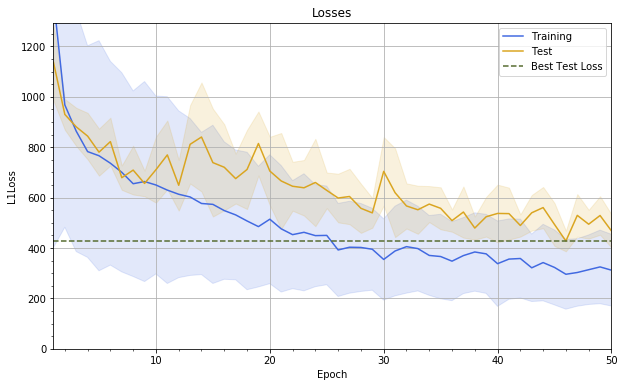

Dataset=DroneRGBLater, Image=128x128, CNN Depth=12
Best Test Loss: 505.86


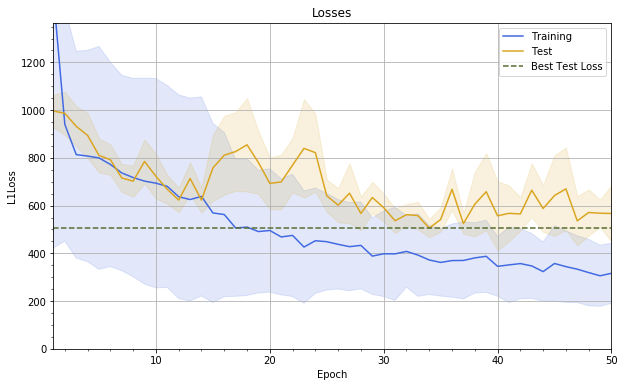

In [7]:
depth_rgb_later = test_depth(dp.DroneRGBLater, 3)

### 2.3 Conclusion for the Depth

We conclude that the optimal depth is 8 layers in total for the CNN-portion of the network. We will also attempt at bringin the test loss to a lowest possible value using 128px RGB datasets.

Here are the test and train loss tables for NDVI datasets before (*pre*) and during-and-after (*post*) July:

In [8]:
print("NDVI Earlier")
depth_ndvi_earlier

NDVI Earlier


32                                           64                     \
            4        6        8        10       12       4        6        8    
test   911.927  799.666  836.315  828.297  944.264  897.725  844.052  706.191   
train  453.909   382.66  364.084  388.629  476.719  440.025  331.712   328.35   

                             128                                      
            10       12       4        6        8        10       12  
test   691.862  782.794  845.803  718.116  700.643  666.163  782.615  
train  329.711  375.531  349.265  307.172  285.625  295.199  324.494

In [9]:
print("NDVI Later")
depth_ndvi_later

NDVI Later


32                                           64                     \
            4        6        8        10       12       4        6        8    
test   1376.76  1383.07  1377.54  1356.49   1327.4  1238.11  1188.71  1244.99   
train  900.305   847.05  801.686   828.12  983.657   651.73  632.702   594.85   

                             128                                      
            10       12       4        6        8        10       12  
test   1166.55  1230.94  1101.56  1129.44  1116.44  1096.43  967.224  
train  557.698  586.834  502.398  444.596  422.475  458.445  491.889

In [10]:
print("RGB Earlier")
depth_rgb_earlier

RGB Earlier


32                                           64                     \
            4        6        8        10       12       4        6        8    
test   806.811  645.953  572.072    490.3  619.159  767.437  740.286  618.931   
train  497.695   365.88  328.285  313.625  320.201  415.945  337.766  342.108   

                             128                                      
            10       12       4        6        8        10       12  
test   574.105  615.359  679.507  555.286  534.889   484.82  704.975  
train  339.541  344.139  326.822  289.779  262.564  273.785  321.462

In [21]:
print("RGB Later")
depth_rgb_later

RGB Later


32                                           64                     \
            4        6        8        10       12       4        6        8    
test   666.325  579.098  645.186  646.612  695.625  609.775  552.155  590.505   
train   440.97  379.728  380.727  387.654  450.091  409.439  323.966  345.006   

                             128                                      
            10       12       4        6        8        10       12  
test   625.422  618.156  430.764  373.476  372.406  427.632  505.855  
train  357.398  364.775  314.502   282.03  262.745  295.746  305.949

With so many numbers it is actually starting to get a bit hard to grasp the progression. We therefore take these numbers and plot them  out. The error values for the unfitted will be handled as `NaN`s to ensure proper scaling of the plots. The plotted areas use the training error as the upper bound and the test error as the lower bound.

/home/nevavuor/.conda/envs/pytorch/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


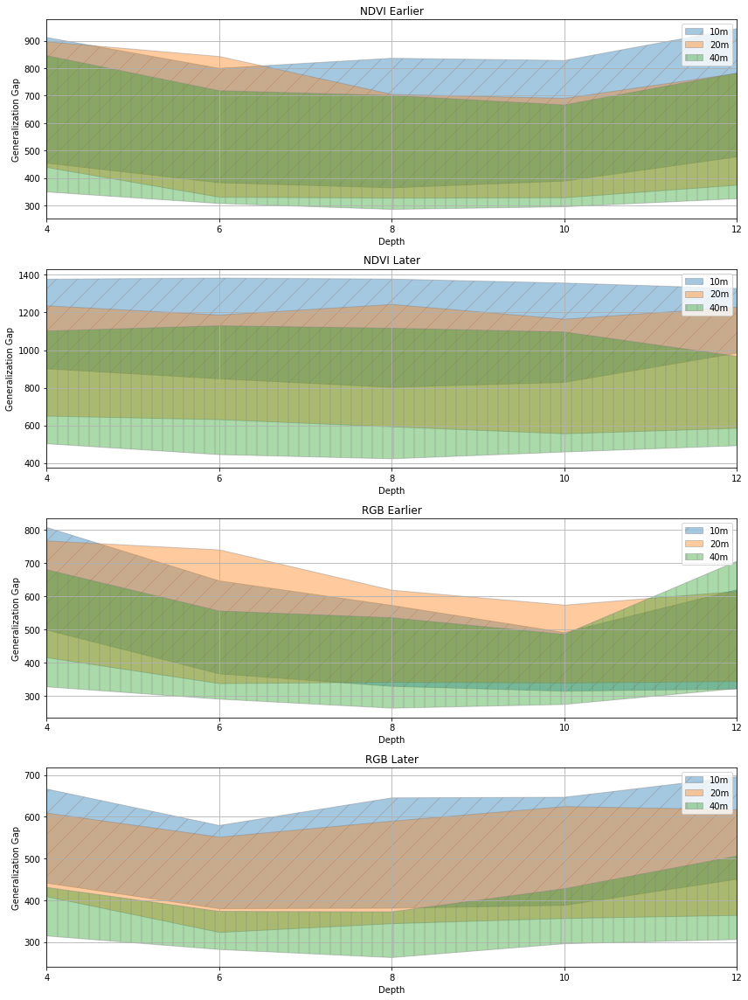

In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = 12, 16

hatches = ['/', None, '|']
x = list(range(4, 14, 2))
result_sets = [depth_ndvi_earlier, depth_ndvi_later, depth_rgb_earlier ,depth_rgb_later]
result_set_names = ['NDVI Earlier','NDVI Later','RGB Earlier','RGB Later']

for i, label in enumerate(['10m', '20m', '40m']):
    
    window_px = 32*2**i
    
    for j, result_set in enumerate(result_sets):
    
        plt.subplot(411+j)
        plt.fill_between(x, 
                         list(result_set.loc['train',window_px].values), 
                         list(result_set.loc['test',window_px].values),
                         label=label, hatch=hatches[i], edgecolor='gray', alpha=0.4)
        plt.xticks(x)
        plt.xlim([4, 12])
        plt.legend()
        plt.grid()
        plt.xlabel("Depth")
        plt.ylabel("Generalization Gap")
        plt.title(result_set_names[j])


plt.tight_layout()
plt.show()

While we are missing the 64px dataset's information for the later NDVI dataset, there seems to two conclusions to be made. The first is that the best test loss is achievable with the largest dataset having 128px images. Also the training loss is pretty similar from the depth of 6 layers onwards. Thus it seems, that the combination of 128px dataset and 8-layer CNN would be to optimal to regularize for the NDVI datasets.

The optimal result is once again achieved with depth of 8 layers and the 128px image dataset. The test losses are however notably lower for the RGB images than for the NDVI images.

## 3. Regularization

We have already concluded that the optimal optimizer to use is the Adadelta and the optimal CNN depth is 8 layers. We have also concluded as a side product of the optimal depth research that minimal test loss is best achieved using 128px RGB datasets. Now it is time to attempt at drivin the test loss down by means of regularization. We have two possibilities, early stopping and weight decay.

The hyperparameter for the early stopping is the number of consecutive non-improving training iterations to perform before terminating the training. We will also implement a second boolean hyperparameter for whether to continue training after first termination. The hyperparameter for the weight decay is the decay coefficient. We will try out several values with random search. Thus we will try out a fixed amount of trainings and see which one of them produces the lowest test error.

We will set the hyperparameter value ranges as follows:

- Early stopping (`patience`): $[10, ... , 50]$
- Weight decay (`weight_decay`): $[0.0, ... , 1.0]$

While this is just a comparison, we'll continue using a limited amount of epochs to see how the overall progression of the training proceeds. We'll also proceed byt first testing the weight decay and only after that the early stopping. This is because the training times grow exceedingly after the number of epochs is in ballpark where early stopping is able to show its effectiveness.

In [1]:
import os
import shutil

import numpy as np
import pandas as pd
import torch
from torch import optim

from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN

%matplotlib inline

DB_128 = 'field_analysis_40m_128px.db'
DATASET_NAMES = ['earlier', 'later']
EPOCHS = 50

def copy_model(cnn, is_later, save):
    "Copy the dataset-wise persisted model either for later use (`save=True`) or current use (`save=False`)."
    
    model_folder, _ = os.path.split(cnn.model_path)
    model_name, suffix = cnn.model_filename.split('.')
    model_name = "{}_{}.{}".format(
        model_name, DATASET_NAMES[is_later], suffix)

    if save:
        
        from_path = cnn.model_path
        to_path = os.path.join(model_folder, model_name)

    else:

        from_path = os.path.join(model_folder, model_name)
        to_path = cnn.model_path

    shutil.copyfile(from_path, to_path)
    print("Persisted model copied \n\tFrom: {} \n\tTo: {}".format(from_path, to_path))

In [44]:
cnn = DroneYieldMeanCNN(
    source_bands=3,
    source_dim=128,
    cnn_layers=8,
    optimizer=optim.Adadelta)
cnn.save_model(suppress_output=False)

Saving the model to /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl


### 3.1 Initializing Networks

Before we delve deeper in to comparing the performance metrics with varying hyperparametervalues, we will initialize a network with no further training. This is to ensure that all the runs are performed with equally initialized model and.

#### 3.1.1 RGB Earlier Dataset

First we train the initial model for earlier dataset.

In [45]:
cnn = DroneYieldMeanCNN(
    source_bands=3,
    source_dim=128,
    cnn_layers=8,
    optimizer=optim.Adadelta)

copy_model(cnn=cnn, is_later=False, save=True)

Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl


#### 3.1.2 RGB Later Dataset

Then we train the later dataset initial model.

In [46]:
cnn = DroneYieldMeanCNN(
    source_bands=3,
    source_dim=128,
    cnn_layers=8,
    optimizer=optim.Adadelta)

copy_model(cnn=cnn, is_later=True, save=True)

Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_later.pkl


### 3.2 Benchmark Trainings

We will first perform benchmark trainings with no regularization. This is to see where the training would progress. We will then compare the regularized trainings to these to see the level of improvement attained.

#### 3.2.1 RGB Earlier Dataset

Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[   3/  50] (1m 38s) 	Mean Loss:	Train=822.75 +-404.39	Test=929.56 +-133.03
[   6/  50] (3m  9s) 	Mean Loss:	Train=742.65 +-357.11	Test=818.34 +-71.27
[   9/  50] (4m 39s) 	Mean Loss:	Train=669.52 +-314.91	Test=1064.95 +-292.20
[  12/  50] (6m 10s) 	Mean Loss:	Train=605.08 +-301.95	Test=1021.83 +-212.18
[  15/  50] (7m 40s) 	Mean Loss:	Train=547.06 +-308.86	Test=1222.96 +-422.72
[  18/  50] (9m 11s) 	Mean Loss:	Train=501.61 +-266.57	Test=1241.87 +-182.80
[  21/  50] (10m 42s) 	Mean Loss:	Train=481.21 +-243.31	Test=922.41 +-323.08
[  24/  50] (12m 13s) 	Mean Loss:	Train=425.54 +-224.18	Test=689.81 +-52.57
[  27/  50] (13m 43s) 	Mean Loss:	Train=405.39 +-197.87	Test=700.41 +-97.23
[  30/  50] (15m 14s) 	

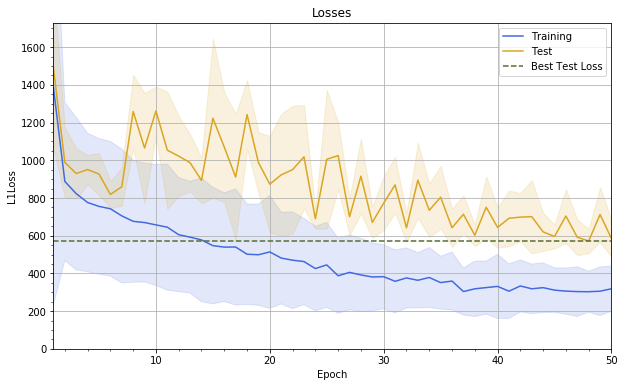

In [47]:
cnn = DroneYieldMeanCNN(
    source_bands=3,
    source_dim=128,
    cnn_layers=8,
    optimizer=optim.Adadelta)

copy_model(cnn=cnn, is_later=False, save=False)
cnn.load_model()

_ = cnn.train(
    epochs=EPOCHS,
    training_data=dp.DroneRGBEarlier(DB_128),
    k_cv_folds=3)

#### 3.2.2 RGB Later Dataset

Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_later.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[   3/  50] (1m 31s) 	Mean Loss:	Train=838.27 +-456.84	Test=899.99 +-82.69
[   6/  50] (2m 56s) 	Mean Loss:	Train=705.23 +-388.30	Test=708.33 +-51.68
[   9/  50] (4m 20s) 	Mean Loss:	Train=618.99 +-409.83	Test=695.81 +-138.51
[  12/  50] (5m 45s) 	Mean Loss:	Train=580.17 +-347.65	Test=684.38 +-223.50
[  15/  50] (7m  9s) 	Mean Loss:	Train=515.63 +-291.49	Test=870.17 +-210.09
[  18/  50] (8m 33s) 	Mean Loss:	Train=512.08 +-302.21	Test=842.08 +-243.02
[  21/  50] (9m 57s) 	Mean Loss:	Train=498.70 +-296.63	Test=670.94 +-150.66
[  24/  50] (11m 22s) 	Mean Loss:	Train=428.16 +-234.93	Test=612.57 +-201.76
[  27/  50] (12m 46s) 	Mean Loss:	Train=402.32 +-197.59	Test=479.33 +-48.49
[  30/  50] (14m 10s) 	Mean Lo

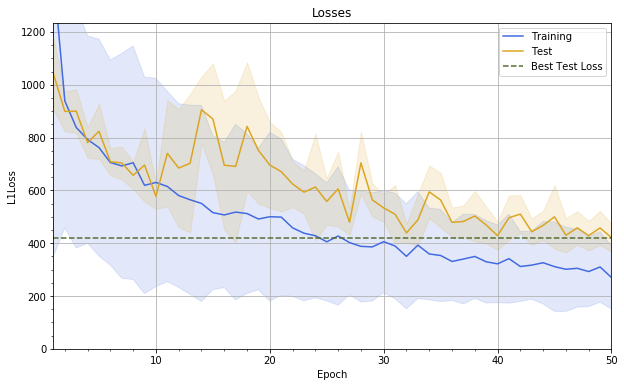

In [48]:
cnn = DroneYieldMeanCNN(
    source_bands=3,
    source_dim=128,
    cnn_layers=8,
    optimizer=optim.Adadelta)

copy_model(cnn=cnn, is_later=True, save=False)
cnn.load_model()

_ = cnn.train(
    epochs=EPOCHS,
    training_data=dp.DroneRGBLater(DB_128),
    k_cv_folds=3)

### 3.2 Weight decay

First we research the optimal weight decay by running series of grid searches. We want to first see if there is a coarse area of better test errors achieved with only a maximum of 50 epochs. After that we'll use this information to perform random searches in this neighborhood of best coarse values drawing random samples from a normal distribution with mean corresponding to the dataset-wise lowest grid search and standard deviation focusing the values around that particular mean value.

In [49]:
def test_weight_decay(dataset, weight_decays):

    best_losses = pd.DataFrame(
        columns=['weight_decay', 'best_loss', 'loss_mean', 'loss_std'])

    for weight_decay in weight_decays:

        print("weight_decay={}".format(
            weight_decay))

        cnn = DroneYieldMeanCNN(
            source_bands=3,
            source_dim=128,
            cnn_layers=8,
            optimizer=optim.Adadelta,
            optimizer_parameters={'weight_decay': weight_decay})

        copy_model(cnn=cnn, is_later=isinstance(dataset, dp.DroneRGBLater), save=False)
        cnn.load_model()

        losses_dict = cnn.train(
            epochs=EPOCHS,
            training_data=dataset(DB_128),
            k_cv_folds=3,
            suppress_output=True)

        losses = np.array(losses_dict['test_losses_mean_std'])[:, 0]
        best_losses = best_losses.append(
            {'weight_decay': weight_decay,
             'best_loss': losses.min(),
             'loss_mean': losses.mean(),
             'loss_std': losses.std()},
            ignore_index=True)

    return best_losses.sort_values(by='weight_decay').reset_index(drop=True)

#(weight_decay, best_loss)
best_l2_earlier = (None,None)
best_l2_later = (None,None)

#### 3.2.1 Grid Search with Both RGB Datasets

So first we perform a crude grid search with multiple values of powers of ten.

##### 3.2.1.1 RGB Earlier Dataset

weight_decay=0.001
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 519.19


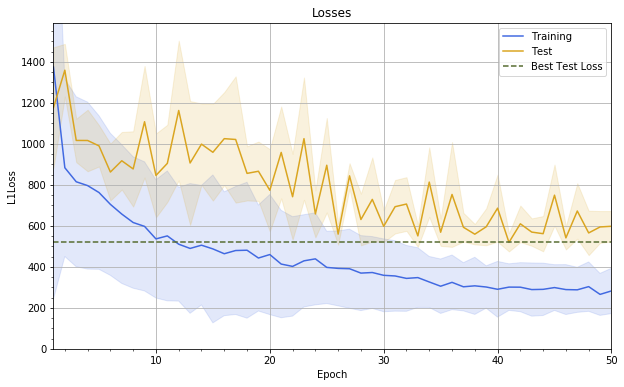

weight_decay=0.01
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 515.37


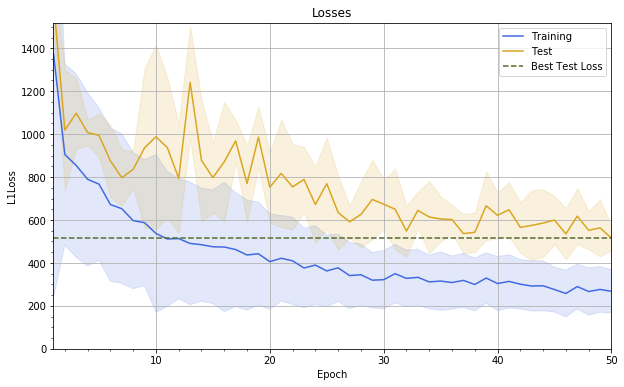

weight_decay=0.1
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 560.89


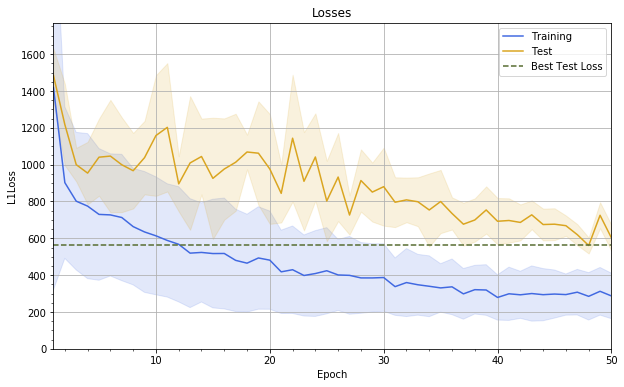

weight_decay=1.0
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 598.61


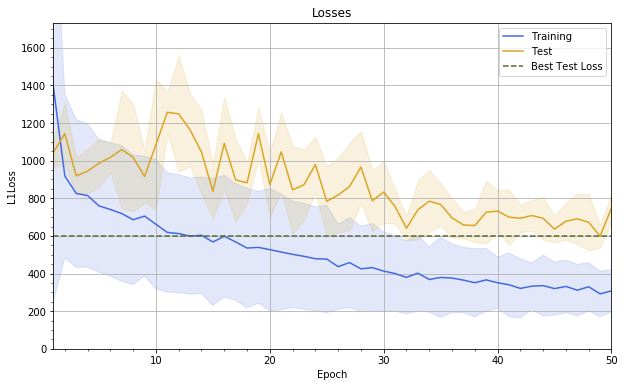

weight_decay=10.0
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 468.17


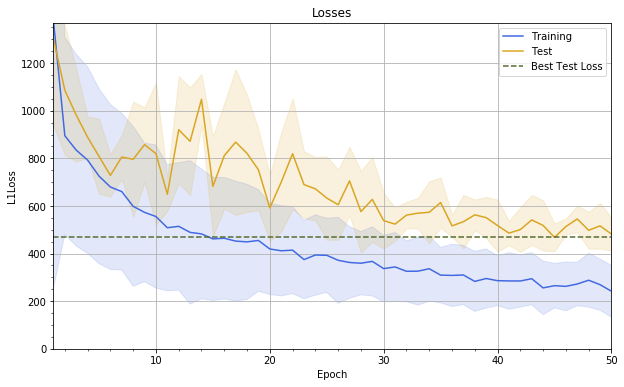

In [50]:
l2_earlier = test_weight_decay(dp.DroneRGBEarlier, [1e-3, 1e-2, 1e-1, 1e0, 1e1])

,weight_decay,best_loss,loss_mean,loss_std
0,0.001,519.193331,795.504842,200.775633
1,0.010,515.367367,759.761962,211.642120
2,0.100,560.891502,885.445217,186.706098
3,1.000,598.614703,866.846177,172.740586
4,10.000,468.167401,685.028851,181.101206


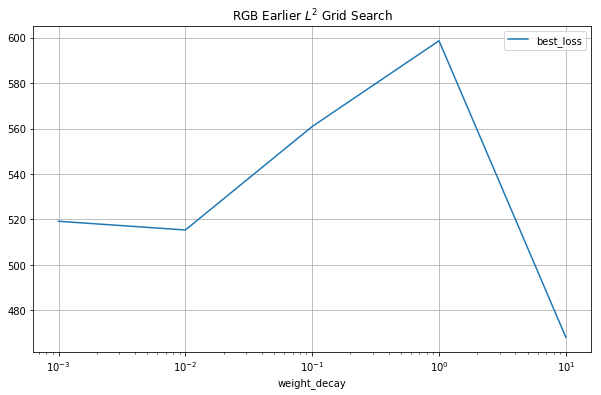

In [51]:
l2_earlier.plot(x='weight_decay', y='best_loss', logx=True, grid=True, title='RGB Earlier $L^2$ Grid Search')
l2_earlier

In [59]:
best_row = l2_earlier.loc[l2_earlier['best_loss'].idxmin()]
best_l2_earlier = (best_row['weight_decay'], best_row['best_loss'])
best_l2_earlier

(10.0, 468.1674009958903)

##### 3.2.1.2 RGB Later Dataset

weight_decay=0.001
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 421.80


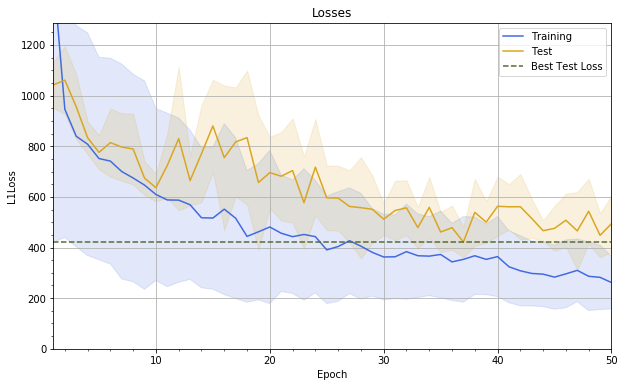

weight_decay=0.01
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 435.10


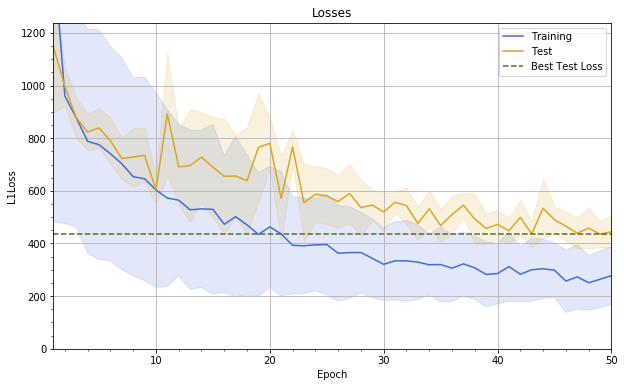

weight_decay=0.1
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 431.30


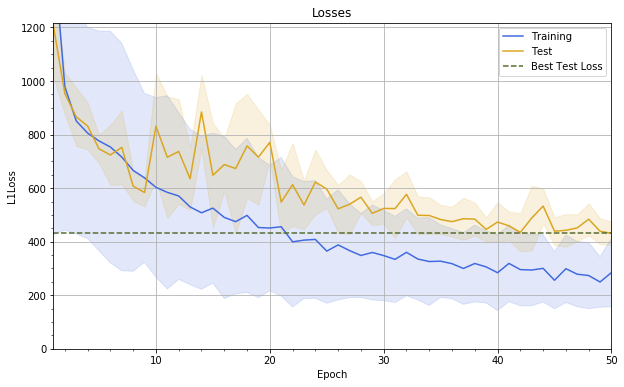

weight_decay=1.0
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 384.31


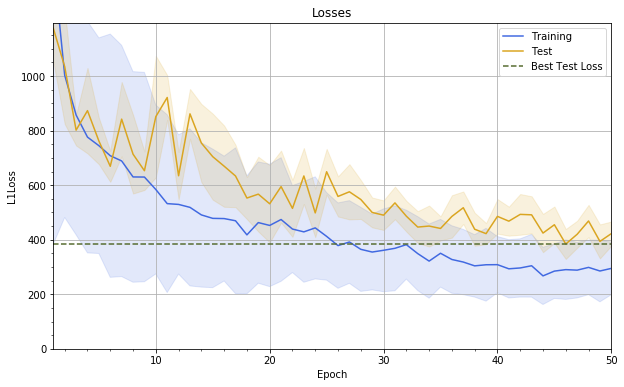

weight_decay=10.0
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 389.37


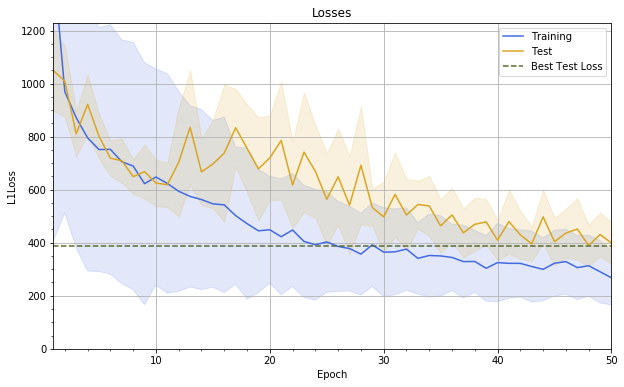

In [60]:
l2_later = test_weight_decay(dp.DroneRGBLater, [1e-3, 1e-2, 1e-1, 1e0, 1e1])

,weight_decay,best_loss,loss_mean,loss_std
0,0.001,421.803460,644.012301,156.433208
1,0.010,435.100005,619.417088,157.547836
2,0.100,431.304785,609.053613,160.144207
3,1.000,384.309217,598.034841,174.110857
4,10.000,389.365195,614.858068,161.436128


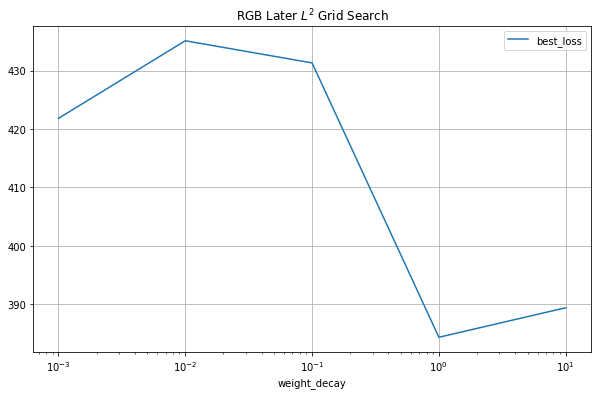

In [61]:
l2_later.plot(x='weight_decay', y='best_loss', logx=True, grid=True, title='RGB Later $L^2$ Grid Search')
l2_later

In [62]:
best_row = l2_later.loc[l2_later['best_loss'].idxmin()]
best_l2_later = (best_row['weight_decay'], best_row['best_loss'])
best_l2_later

(1.0, 384.30921718052457)

#### 3.2.2 Random Search with Both Datasets

Then we perform a zoomed search around the optimal values. 

There is one discussion point however, and that is the lowest test loss produced for RGB Earlier dataset. When comparing the loss progression with graphs, it seems that the lowest loss with ``weight_decay=0.001`` could be attributable to just random fluctuations. To support this notion, the graphs of other regularization values produce more values close to the lowest attained loss more coherently, while the loss of the first regularization test with the first dataset jumps back up to 550ish test loss range. 

Thus it seems that for both datasets we could use similar base ballpark of random search values. One option would to use a normal distribution. Another is to use a limited range uniform distribution. We will go with normal to properly zoom to a range of optimal values.

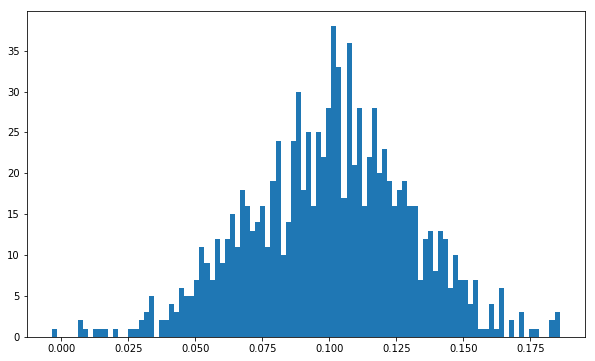

In [66]:
import matplotlib.pyplot as plt
import numpy as np
_ = plt.hist(np.random.normal(loc=1e-1, scale=3*1e-2, size=1000), bins=100)

##### 3.2.2.1 RGB Earlier Dataset

weight_decay=16.06845078282854
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 503.84


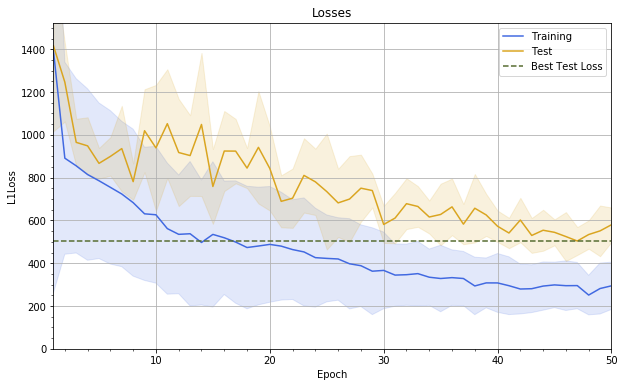

weight_decay=6.526148155181861
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 527.09


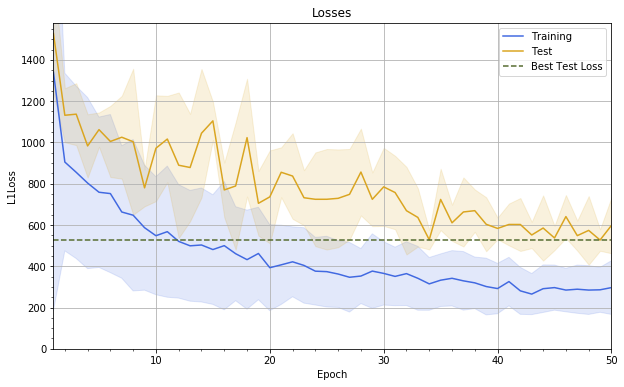

weight_decay=2.46957994299534
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 544.89


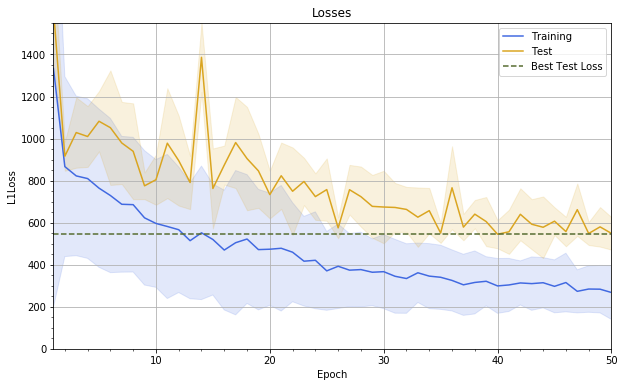

weight_decay=4.665408641354588
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 546.36


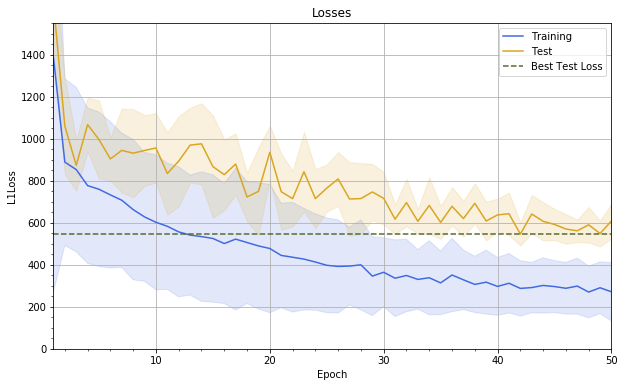

weight_decay=7.667982577763971
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 569.26


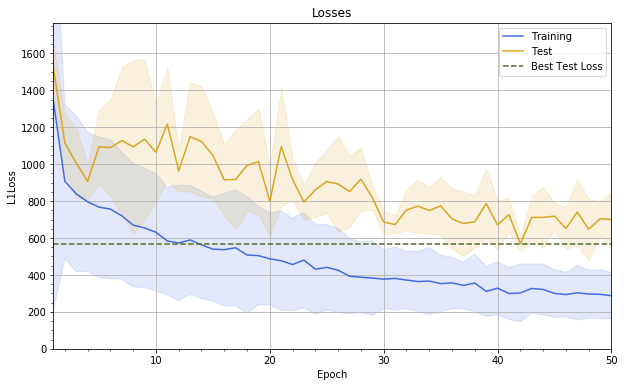

weight_decay=14.401059393750353
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 494.83


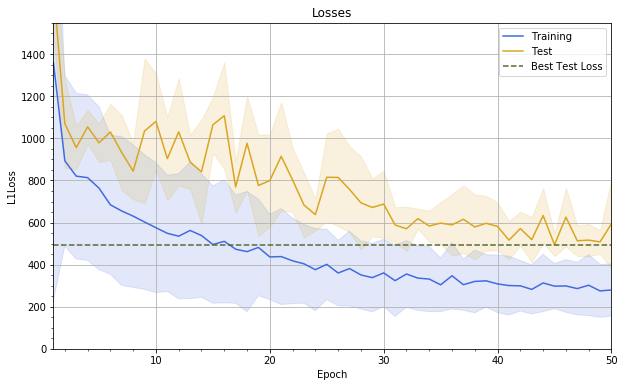

weight_decay=7.077576090445541
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 483.70


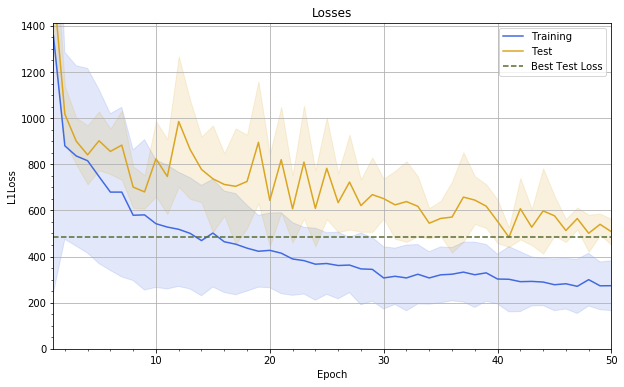

weight_decay=16.183913267326034
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 504.08


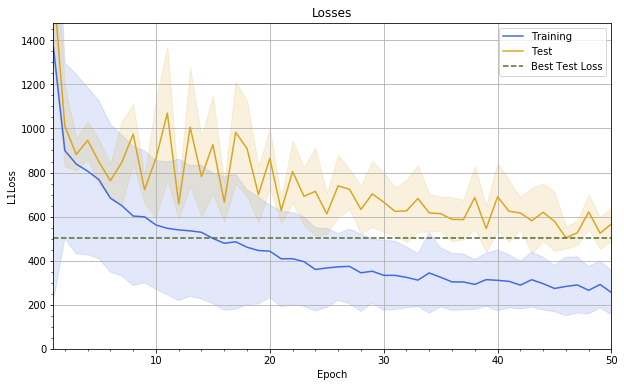

weight_decay=9.91444861335565
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 452.39


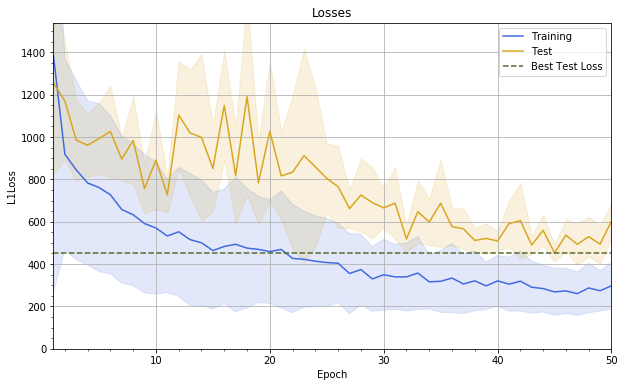

weight_decay=3.4926431391705375
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 484.17


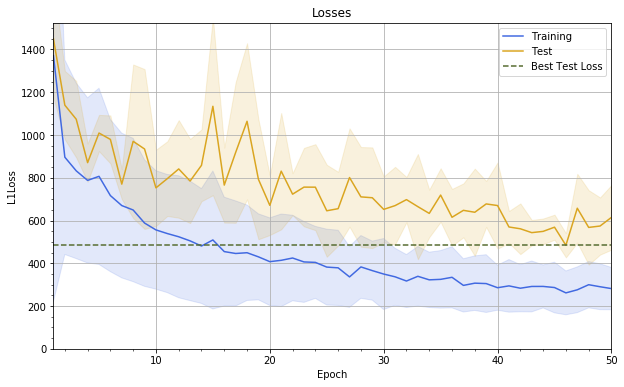

In [67]:
l2_earlier = test_weight_decay(dp.DroneRGBEarlier, 
                               np.abs(np.random.normal(loc=best_l2_earlier[0], 
                                                       scale=5*best_l2_earlier[0]*0.1, 
                                                       size=10)))

,weight_decay,best_loss,loss_mean,loss_std
0,2.469580,544.889791,775.700014,213.230163
1,3.492643,484.172098,762.759745,186.173952
2,4.665409,546.357424,776.757917,191.226006
3,6.526148,527.093555,790.313837,206.023580
4,7.077576,483.700656,706.969340,181.289961
5,7.667983,569.257258,883.303769,192.277487
6,9.914449,452.387275,770.008878,215.997887
7,14.401059,494.834682,775.066624,231.100990
8,16.068451,503.843330,762.298132,195.864509
9,16.183913,504.083286,740.111561,194.189223


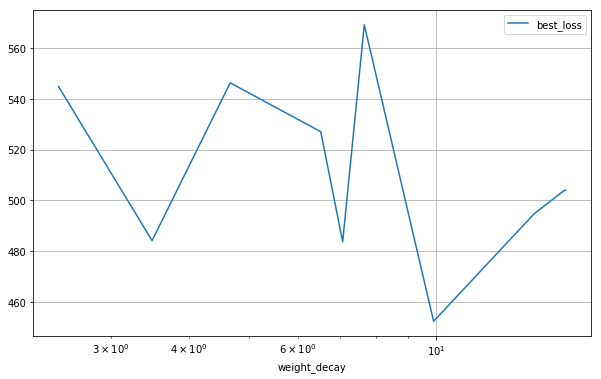

In [68]:
l2_earlier.plot(x='weight_decay', y='best_loss', logx=True, grid=True)
l2_earlier

In [69]:
best_row = l2_earlier.loc[l2_earlier['best_loss'].idxmin()]

if best_row['best_loss'] < best_l2_earlier[-1]:
    best_l2_earlier = (best_row['weight_decay'], best_row['best_loss'])

best_l2_earlier

(9.91444861335565, 452.3872750600179)

##### 3.2.2.2 RGB Later Dataset

weight_decay=1.1972984940467366
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 366.09


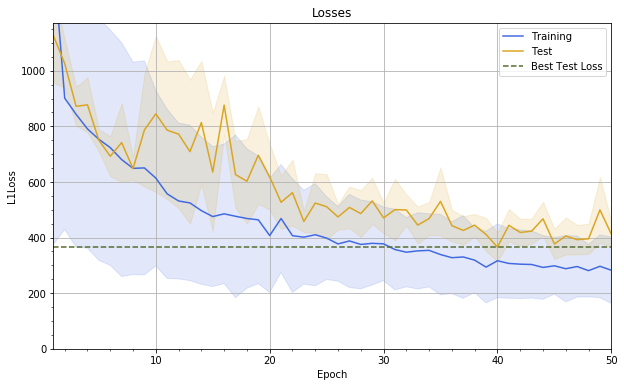

weight_decay=0.9699756681197421
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 408.31


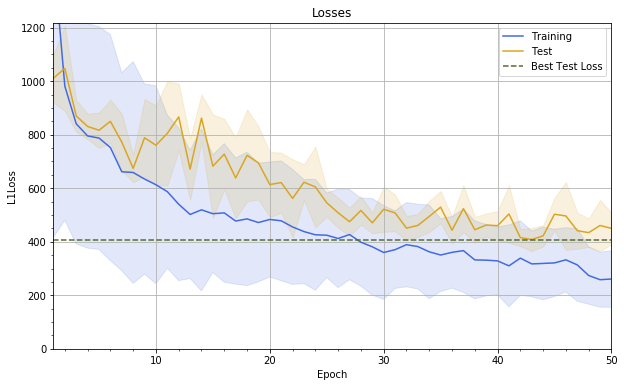

weight_decay=0.6868086212948887
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 395.67


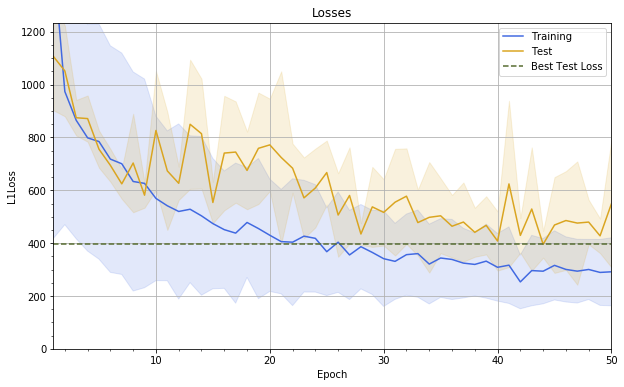

weight_decay=1.3408168577764916
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 407.75


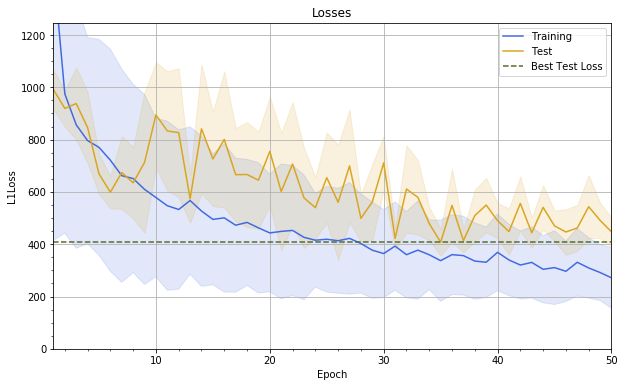

weight_decay=1.7400963309568243
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 363.69


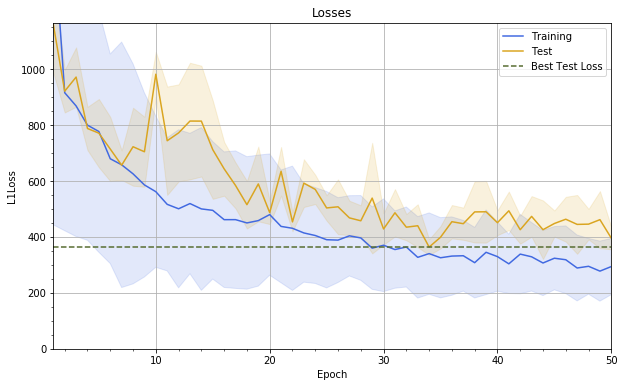

weight_decay=0.6135742248440783
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 402.48


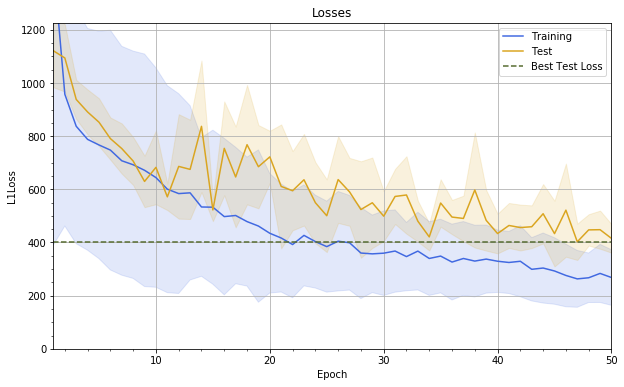

weight_decay=1.4659639701517484
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 380.36


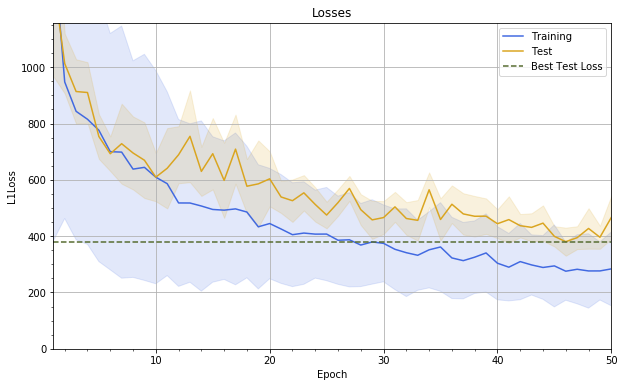

weight_decay=1.118248266309827
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 481.55


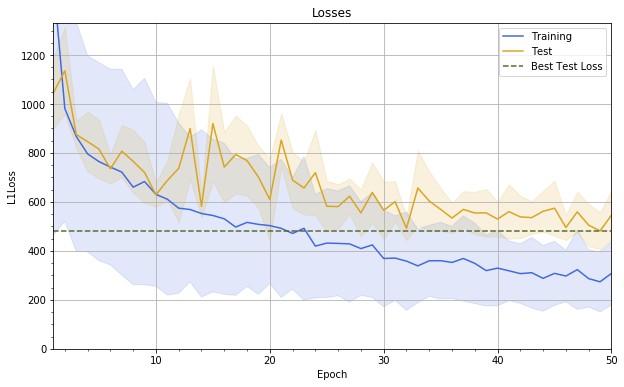

weight_decay=1.7058186429396307
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 428.40


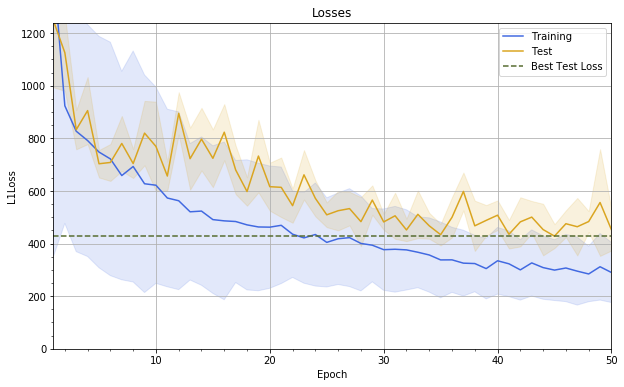

weight_decay=1.329896250027173
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 415.06


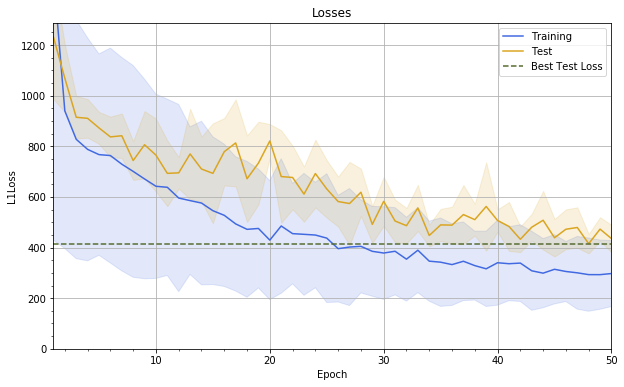

In [70]:
result_later = test_weight_decay(dp.DroneRGBLater, 
                                 np.abs(np.random.normal(loc=best_l2_later[0], 
                                                       scale=5*best_l2_later[0]*0.1, 
                                                       size=10)))

,weight_decay,best_loss,loss_mean,loss_std
0,0.613574,402.478442,613.465889,165.479872
1,0.686809,395.667595,617.380128,161.442674
2,0.969976,408.310718,609.340086,166.003327
3,1.118248,481.548874,666.077022,144.543795
4,1.197298,366.094462,586.542274,179.867291
5,1.329896,415.059315,644.087250,175.497331
6,1.340817,407.747920,623.735381,149.451960
7,1.465964,380.362419,579.109427,174.866213
8,1.705819,428.400199,619.968352,176.618836
9,1.740096,363.689501,583.061797,177.370028


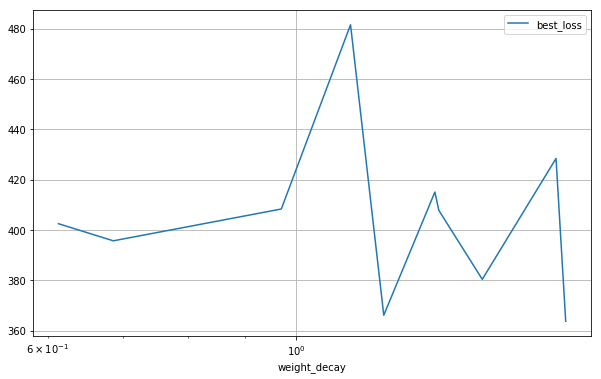

In [71]:
result_later.plot(x='weight_decay', y='best_loss', logx=True, grid=True)
result_later

In [72]:
best_row = l2_later.loc[l2_later['best_loss'].idxmin()]

if best_row['best_loss'] < best_l2_later[-1]:
    best_l2_later = (best_row['weight_decay'], best_row['best_loss'])

best_l2_later

(1.0, 384.30921718052457)

#### 3.2.3 Conclusions

In [1]:
best_l2_earlier = (9.91444861335565, 452.3872750600179)
best_l2_earlier

(9.91444861335565, 452.3872750600179)

In [2]:
best_l2_later = (1.0, 384.30921718052457)
best_l2_later

(1.0, 384.30921718052457)

In [3]:
print("RGB Earlier")
print("\tWeight Decay: {}".format(best_l2_earlier[0]))
print("\tBest Loss: {}".format(best_l2_earlier[1]))
print("RGB Later")
print("\tWeight Decay: {}".format(best_l2_later[0]))
print("\tBest Loss: {}".format(best_l2_later[1]))

RGB Earlier
	Weight Decay: 9.91444861335565
	Best Loss: 452.3872750600179
RGB Later
	Weight Decay: 1.0
	Best Loss: 384.30921718052457


### 3.3 Early Stopping

Next we test out multiple setting of early stopping. With early stopping it is adives by Goodfellow et al. (2016) to perform sequential training after the training has been terminated early using the same termination setting. We will thus try out several values for the early stopping patience, which is a number determining how many non-improving epochs we allow the training to pass before terminating it. We try with patiences 10, 20, 30, 40 and 50.

In [5]:
def test_early_stopping(dataset, weight_decay, patiences):

    best_losses = pd.DataFrame(
        columns=['patience', 'best_loss', 'epochs', 'loss_mean', 'loss_std'])

    for patience in patiences:

        print("patience={}".format(
            patience))

        cnn = DroneYieldMeanCNN(
            source_bands=3,
            source_dim=128,
            cnn_layers=8,
            optimizer=optim.Adadelta,
            optimizer_parameters={'weight_decay': weight_decay})

        copy_model(cnn=cnn, is_later=isinstance(dataset, dp.DroneRGBLater), save=False)
        cnn.load_model()

        losses = []
        
        losses_dict = cnn.train(
            epochs=250,
            training_data=dataset(DB_128),
            k_cv_folds=3,
            early_stopping_patience=patience)

        losses = list(np.array(losses_dict['test_losses_mean_std'])[:, 0])
                
        losses_dict = cnn.train(
            epochs=250,
            training_data=dataset(DB_128),
            k_cv_folds=3,
            early_stopping_patience=patience)

        losses += list(np.array(losses_dict['test_losses_mean_std'])[:, 0])
        
        losses = np.array(losses).flatten()

        best_losses = best_losses.append(
            {'patience': patience,
             'epochs':losses.size,
             'best_loss': losses.min(),
             'loss_mean': losses.mean(),
             'loss_std': losses.std()},
            ignore_index=True)
                
    return best_losses.sort_values(by='patience').reset_index(drop=True)

#### 3.3.1 RGB Earlier Dataset

patience=10
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (9m 40s) 	Mean Loss:	Train=497.87 +-257.14	Test=876.77 +-201.63
[  20/ 250] (14m 48s) 	Mean Loss:	Train=401.21 +-185.73	Test=714.79 +-132.64
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 699.54


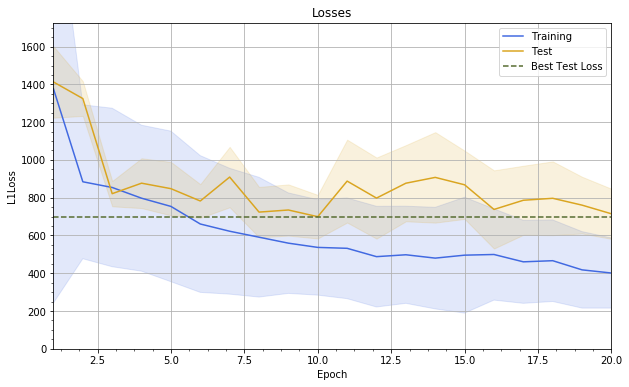

Starting the training with GPU:
[  13/ 250] (9m 37s) 	Mean Loss:	Train=340.49 +-143.57	Test=564.55 +-107.50
[  26/ 250] (19m  4s) 	Mean Loss:	Train=308.56 +-127.21	Test=500.69 +-91.72
[  39/ 250] (28m 27s) 	Mean Loss:	Train=255.27 +-90.34	Test=550.89 +-101.09
[  44/ 250] (32m  4s) 	Mean Loss:	Train=239.86 +-93.93	Test=538.67 +-150.54
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 442.57


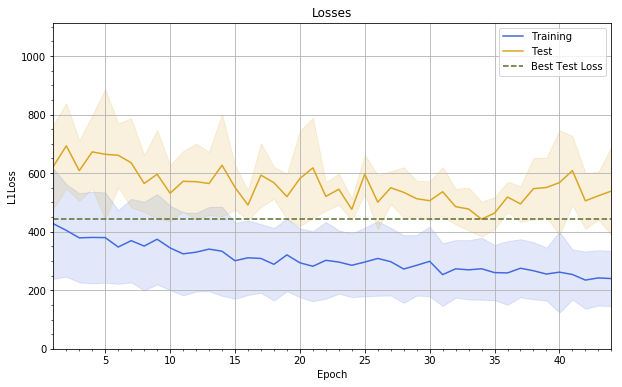

patience=20
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (9m 31s) 	Mean Loss:	Train=555.35 +-303.98	Test=1083.89 +-374.48
[  26/ 250] (18m 55s) 	Mean Loss:	Train=410.59 +-231.03	Test=773.68 +-208.66
[  39/ 250] (28m 19s) 	Mean Loss:	Train=345.98 +-167.95	Test=671.05 +-112.04
[  52/ 250] (37m 44s) 	Mean Loss:	Train=283.10 +-137.11	Test=601.97 +-94.68
[  65/ 250] (47m  9s) 	Mean Loss:	Train=254.50 +-103.08	Test=538.21 +-59.86
[  78/ 250] (56m 35s) 	Mean Loss:	Train=251.18 +-91.24	Test=555.55 +-59.17
[  91/ 250] (66m  1s) 	Mean Loss:	Train=218.99 +-89.12	Test=556.66 +-81.01
[ 100/ 250] (72m 35s) 	Mean Loss:	Train=210.87 +-92.25	Test=508.60 +-55.41
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/pelt

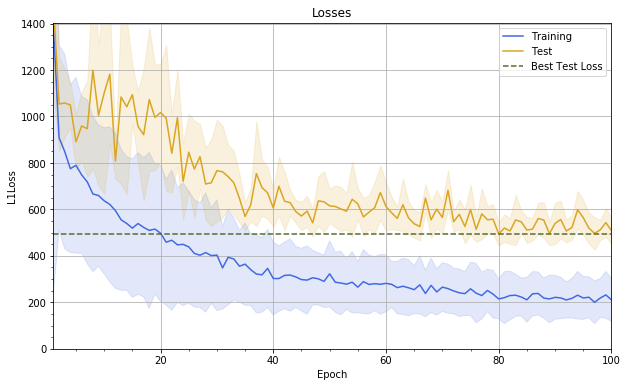

Starting the training with GPU:
[  13/ 250] (9m 33s) 	Mean Loss:	Train=206.98 +-88.17	Test=521.86 +-86.06
[  26/ 250] (18m 59s) 	Mean Loss:	Train=192.65 +-67.58	Test=543.48 +-70.53
[  28/ 250] (20m 26s) 	Mean Loss:	Train=198.70 +-80.41	Test=556.82 +-71.69
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 475.87


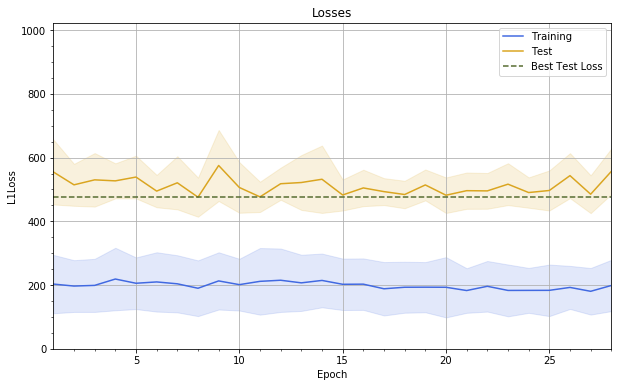

patience=30
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (9m 37s) 	Mean Loss:	Train=530.71 +-287.07	Test=1004.66 +-237.09
[  26/ 250] (19m 10s) 	Mean Loss:	Train=413.23 +-195.45	Test=622.77 +-161.01
[  39/ 250] (28m 44s) 	Mean Loss:	Train=303.32 +-122.92	Test=601.54 +-129.21
[  52/ 250] (38m 17s) 	Mean Loss:	Train=276.94 +-133.27	Test=504.85 +-43.29
[  65/ 250] (47m 50s) 	Mean Loss:	Train=261.03 +-103.23	Test=477.93 +-65.63
[  78/ 250] (57m 23s) 	Mean Loss:	Train=242.65 +-92.62	Test=530.59 +-60.31
[  91/ 250] (66m 57s) 	Mean Loss:	Train=223.49 +-90.51	Test=465.37 +-45.27
[ 104/ 250] (76m 29s) 	Mean Loss:	Train=192.21 +-69.14	Test=464.35 +-71.85
[ 117/ 250] (86m  2s) 	Mean Loss:	Train=196.12 +-77.92	Test=441.62 +-63.27
[ 130/ 250] (95m

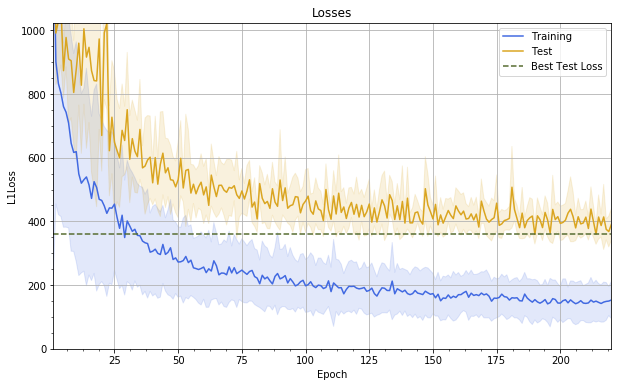

Starting the training with GPU:
[  13/ 250] (9m 40s) 	Mean Loss:	Train=136.62 +-64.81	Test=392.08 +-46.77
[  26/ 250] (19m 13s) 	Mean Loss:	Train=159.69 +-63.66	Test=363.79 +-33.61
[  31/ 250] (22m 53s) 	Mean Loss:	Train=138.84 +-63.01	Test=404.63 +-69.44
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 359.14


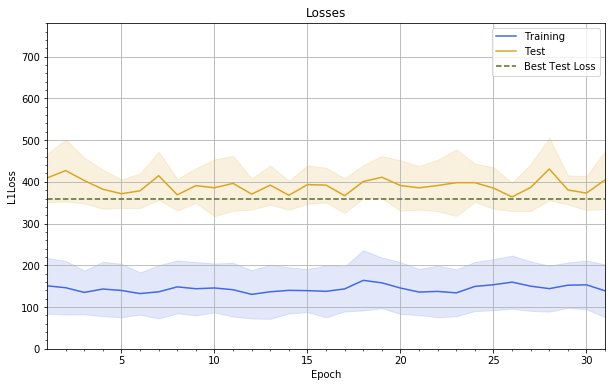

patience=40
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (9m 41s) 	Mean Loss:	Train=549.03 +-299.83	Test=845.17 +-160.39
[  26/ 250] (19m 15s) 	Mean Loss:	Train=379.19 +-187.87	Test=662.85 +-137.11
[  39/ 250] (28m 48s) 	Mean Loss:	Train=322.50 +-124.51	Test=651.53 +-85.92
[  52/ 250] (38m 22s) 	Mean Loss:	Train=281.64 +-106.83	Test=549.93 +-49.25
[  65/ 250] (47m 56s) 	Mean Loss:	Train=246.57 +-95.03	Test=526.81 +-50.06
[  78/ 250] (57m 31s) 	Mean Loss:	Train=232.63 +-83.73	Test=486.41 +-49.29
[  91/ 250] (67m  5s) 	Mean Loss:	Train=228.04 +-83.05	Test=482.25 +-45.33
[ 104/ 250] (76m 38s) 	Mean Loss:	Train=194.74 +-80.23	Test=478.60 +-56.14
[ 117/ 250] (86m 11s) 	Mean Loss:	Train=189.63 +-77.91	Test=449.57 +-34.89
[ 130/ 250] (95m 44

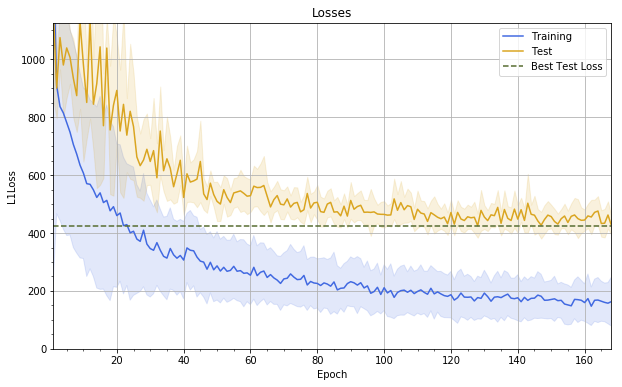

Starting the training with GPU:
[  13/ 250] (9m 40s) 	Mean Loss:	Train=150.67 +-63.11	Test=429.72 +-40.71
[  26/ 250] (19m 13s) 	Mean Loss:	Train=146.44 +-60.38	Test=445.47 +-51.51
[  39/ 250] (28m 46s) 	Mean Loss:	Train=144.24 +-66.76	Test=439.06 +-53.89
[  52/ 250] (38m 19s) 	Mean Loss:	Train=157.90 +-58.45	Test=423.24 +-37.85
[  65/ 250] (47m 52s) 	Mean Loss:	Train=144.54 +-64.48	Test=426.49 +-37.62
[  78/ 250] (57m 25s) 	Mean Loss:	Train=130.35 +-59.82	Test=445.83 +-49.62
[  91/ 250] (66m 58s) 	Mean Loss:	Train=139.36 +-56.89	Test=420.70 +-36.50
[ 104/ 250] (76m 34s) 	Mean Loss:	Train=127.66 +-69.27	Test=415.19 +-41.34
[ 117/ 250] (86m  8s) 	Mean Loss:	Train=124.20 +-54.28	Test=419.89 +-43.80
[ 119/ 250] (87m 36s) 	Mean Loss:	Train=128.23 +-62.59	Test=428.45 +-42.35
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 387.71


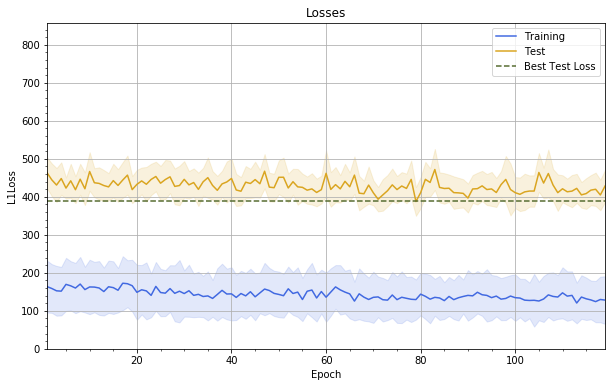

patience=50
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (9m 43s) 	Mean Loss:	Train=517.15 +-277.93	Test=1141.48 +-227.52
[  26/ 250] (19m 19s) 	Mean Loss:	Train=374.57 +-127.90	Test=567.81 +-86.50
[  39/ 250] (28m 55s) 	Mean Loss:	Train=332.14 +-99.03	Test=572.79 +-96.08
[  52/ 250] (38m 30s) 	Mean Loss:	Train=269.08 +-88.82	Test=477.79 +-46.09
[  65/ 250] (48m  5s) 	Mean Loss:	Train=236.22 +-82.64	Test=483.05 +-71.52
[  78/ 250] (57m 40s) 	Mean Loss:	Train=213.24 +-68.56	Test=449.87 +-36.21
[  91/ 250] (67m 15s) 	Mean Loss:	Train=199.12 +-79.52	Test=421.11 +-41.56
[ 104/ 250] (76m 49s) 	Mean Loss:	Train=204.67 +-73.90	Test=423.04 +-51.17
[ 117/ 250] (86m 23s) 	Mean Loss:	Train=185.03 +-72.58	Test=429.07 +-53.75
[ 130/ 250] (95m 59s)

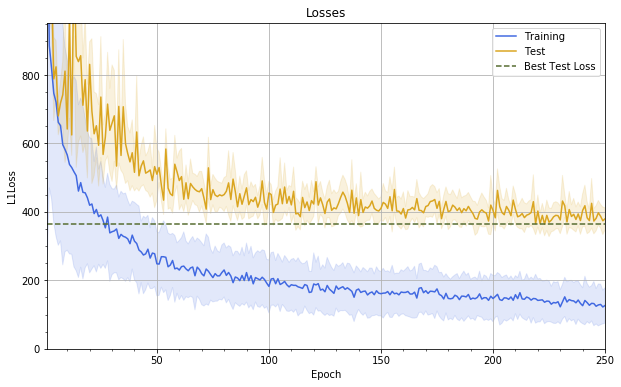

Starting the training with GPU:
[  13/ 250] (9m 43s) 	Mean Loss:	Train=139.55 +-59.49	Test=364.39 +-28.62
[  26/ 250] (19m 19s) 	Mean Loss:	Train=140.84 +-58.81	Test=371.20 +-29.00
[  39/ 250] (28m 54s) 	Mean Loss:	Train=120.52 +-50.19	Test=399.28 +-60.02
[  52/ 250] (38m 29s) 	Mean Loss:	Train=133.03 +-53.67	Test=371.04 +-40.97
[  65/ 250] (48m  4s) 	Mean Loss:	Train=121.06 +-55.87	Test=366.70 +-37.02
[  78/ 250] (57m 39s) 	Mean Loss:	Train=118.26 +-51.45	Test=379.81 +-42.91
[  91/ 250] (67m 13s) 	Mean Loss:	Train=120.63 +-51.32	Test=396.58 +-53.97
[ 104/ 250] (76m 47s) 	Mean Loss:	Train=113.89 +-54.59	Test=382.52 +-37.70
[ 117/ 250] (86m 21s) 	Mean Loss:	Train=114.71 +-43.59	Test=367.75 +-36.79
[ 124/ 250] (91m 30s) 	Mean Loss:	Train=118.93 +-47.18	Test=361.67 +-37.85
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 336.42


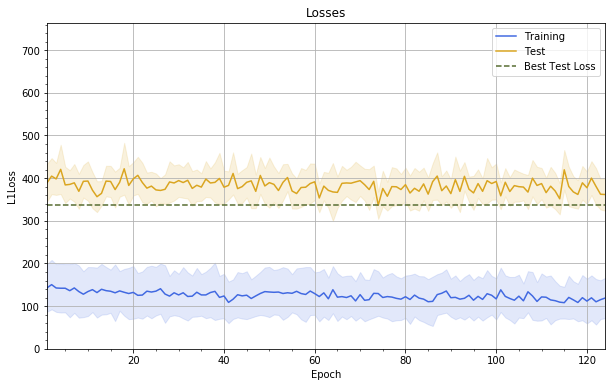

In [6]:
patience_earlier = test_early_stopping(
    dataset=dp.DroneRGBEarlier, 
    weight_decay=best_l2_earlier[0], 
    patiences=[10,20,30,40,50])

#### 3.3.2 RGB Later Dataset

patience=10
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (8m 55s) 	Mean Loss:	Train=546.45 +-301.51	Test=826.08 +-212.63
[  22/ 250] (15m  1s) 	Mean Loss:	Train=411.48 +-205.39	Test=663.89 +-103.73
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 558.12


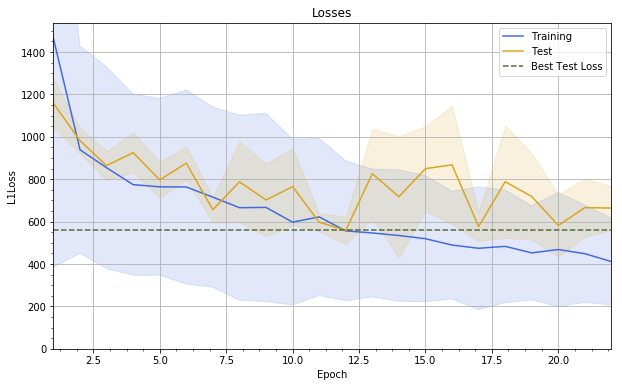

Starting the training with GPU:
[  13/ 250] (8m 56s) 	Mean Loss:	Train=340.56 +-146.25	Test=525.82 +-77.71
[  15/ 250] (10m 18s) 	Mean Loss:	Train=314.17 +-138.76	Test=461.25 +-86.06
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 458.26


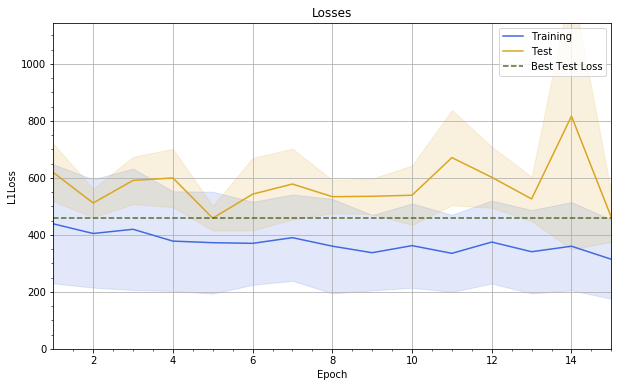

patience=20
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (8m 56s) 	Mean Loss:	Train=538.42 +-326.28	Test=934.81 +-246.79
[  26/ 250] (17m 46s) 	Mean Loss:	Train=388.04 +-184.62	Test=638.11 +-140.04
[  39/ 250] (26m 41s) 	Mean Loss:	Train=313.51 +-150.50	Test=451.43 +-71.15
[  52/ 250] (35m 33s) 	Mean Loss:	Train=279.85 +-121.35	Test=391.21 +-56.63
[  65/ 250] (44m 22s) 	Mean Loss:	Train=243.28 +-98.44	Test=396.77 +-66.06
[  78/ 250] (53m 11s) 	Mean Loss:	Train=219.77 +-102.87	Test=383.44 +-69.33
[  91/ 250] (61m 59s) 	Mean Loss:	Train=217.29 +-79.28	Test=403.41 +-65.20
[ 104/ 250] (70m 47s) 	Mean Loss:	Train=198.81 +-77.16	Test=363.55 +-39.45
[ 117/ 250] (79m 35s) 	Mean Loss:	Train=212.42 +-91.83	Test=341.59 +-42.85
[ 123/ 250] (83m 3

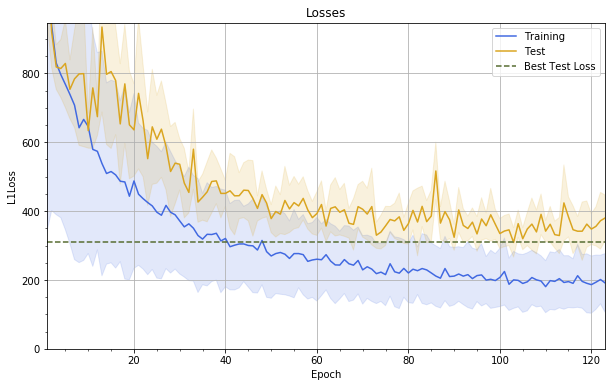

Starting the training with GPU:
[  13/ 250] (8m 44s) 	Mean Loss:	Train=175.65 +-73.92	Test=330.23 +-69.98
[  22/ 250] (14m 42s) 	Mean Loss:	Train=182.11 +-80.77	Test=352.71 +-66.21
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 299.52


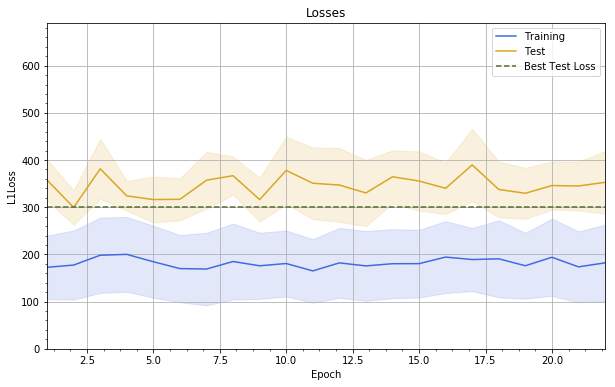

patience=30
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (8m 45s) 	Mean Loss:	Train=569.03 +-308.12	Test=575.95 +-76.42
[  26/ 250] (17m 23s) 	Mean Loss:	Train=390.71 +-163.68	Test=451.43 +-97.49
[  39/ 250] (26m  1s) 	Mean Loss:	Train=285.69 +-112.47	Test=422.59 +-69.51
[  52/ 250] (34m 39s) 	Mean Loss:	Train=275.37 +-121.17	Test=517.08 +-147.72
[  65/ 250] (43m 17s) 	Mean Loss:	Train=235.00 +-104.87	Test=360.48 +-37.12
[  78/ 250] (51m 55s) 	Mean Loss:	Train=232.66 +-103.48	Test=397.09 +-103.42
[  91/ 250] (60m 34s) 	Mean Loss:	Train=206.20 +-85.17	Test=384.74 +-102.32
[ 104/ 250] (69m 14s) 	Mean Loss:	Train=206.56 +-100.92	Test=378.56 +-76.17
[ 117/ 250] (77m 56s) 	Mean Loss:	Train=191.08 +-88.98	Test=464.41 +-116.07
[ 130/ 250] (8

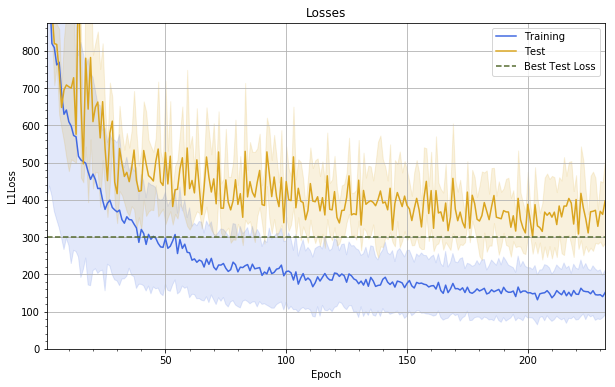

Starting the training with GPU:
[  13/ 250] (8m 48s) 	Mean Loss:	Train=152.00 +-62.84	Test=338.86 +-74.53
[  26/ 250] (17m 28s) 	Mean Loss:	Train=146.05 +-65.97	Test=371.71 +-102.72
[  31/ 250] (20m 48s) 	Mean Loss:	Train=148.34 +-67.54	Test=349.10 +-71.32
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 300.42


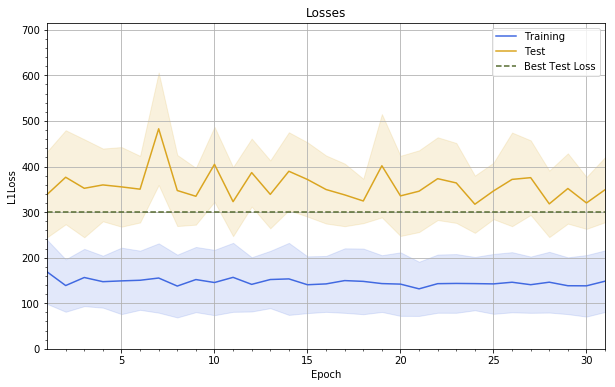

patience=40
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (8m 48s) 	Mean Loss:	Train=590.72 +-312.71	Test=609.66 +-70.43
[  26/ 250] (17m 26s) 	Mean Loss:	Train=420.90 +-192.57	Test=639.48 +-160.23
[  39/ 250] (26m  4s) 	Mean Loss:	Train=314.72 +-129.78	Test=405.27 +-51.33
[  52/ 250] (34m 42s) 	Mean Loss:	Train=279.31 +-121.06	Test=396.70 +-55.06
[  65/ 250] (43m 19s) 	Mean Loss:	Train=268.27 +-108.16	Test=395.05 +-87.63
[  78/ 250] (51m 55s) 	Mean Loss:	Train=214.12 +-80.79	Test=374.29 +-42.71
[  91/ 250] (60m 31s) 	Mean Loss:	Train=222.22 +-97.96	Test=424.99 +-59.55
[ 104/ 250] (69m  7s) 	Mean Loss:	Train=205.71 +-83.91	Test=336.43 +-35.20
[ 117/ 250] (77m 44s) 	Mean Loss:	Train=200.76 +-86.01	Test=375.33 +-43.58
[ 120/ 250] (79m 44

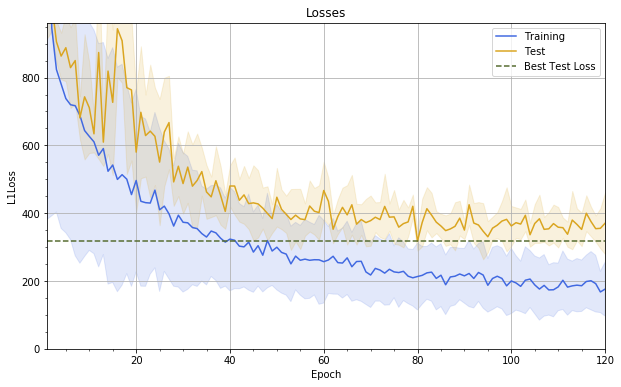

Starting the training with GPU:
[  13/ 250] (8m 48s) 	Mean Loss:	Train=165.80 +-74.72	Test=370.51 +-74.31
[  26/ 250] (17m 29s) 	Mean Loss:	Train=175.97 +-87.34	Test=344.92 +-45.41
[  39/ 250] (26m 10s) 	Mean Loss:	Train=151.14 +-64.18	Test=311.10 +-54.75
[  52/ 250] (34m 50s) 	Mean Loss:	Train=158.01 +-66.69	Test=375.23 +-58.16
[  65/ 250] (43m 32s) 	Mean Loss:	Train=165.32 +-62.65	Test=346.01 +-56.38
[  78/ 250] (52m 14s) 	Mean Loss:	Train=143.07 +-55.00	Test=370.68 +-60.33
[  91/ 250] (60m 54s) 	Mean Loss:	Train=150.21 +-74.85	Test=326.79 +-55.65
[  93/ 250] (62m 14s) 	Mean Loss:	Train=146.96 +-52.49	Test=363.68 +-43.87
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 284.24


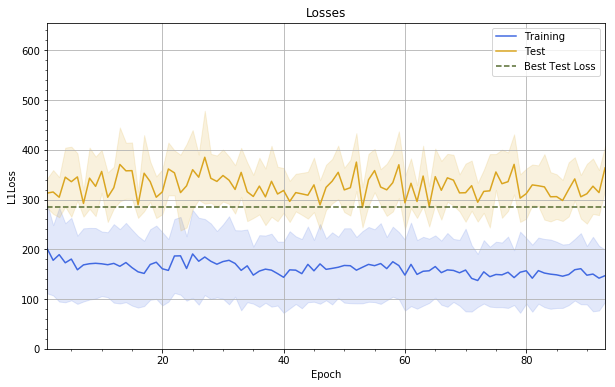

patience=50
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (8m 49s) 	Mean Loss:	Train=539.91 +-297.10	Test=747.61 +-167.97
[  26/ 250] (17m 30s) 	Mean Loss:	Train=410.08 +-149.02	Test=596.28 +-63.93
[  39/ 250] (26m 13s) 	Mean Loss:	Train=305.19 +-131.30	Test=504.77 +-80.78
[  52/ 250] (34m 55s) 	Mean Loss:	Train=280.82 +-115.69	Test=462.48 +-80.15
[  65/ 250] (43m 38s) 	Mean Loss:	Train=261.03 +-103.07	Test=536.52 +-72.38
[  78/ 250] (52m 19s) 	Mean Loss:	Train=225.04 +-95.97	Test=461.32 +-69.43
[  91/ 250] (61m  0s) 	Mean Loss:	Train=216.06 +-100.51	Test=446.92 +-61.84
[ 104/ 250] (69m 41s) 	Mean Loss:	Train=199.71 +-74.40	Test=353.41 +-37.75
[ 117/ 250] (78m 20s) 	Mean Loss:	Train=186.74 +-84.00	Test=419.22 +-98.65
[ 130/ 250] (87m  

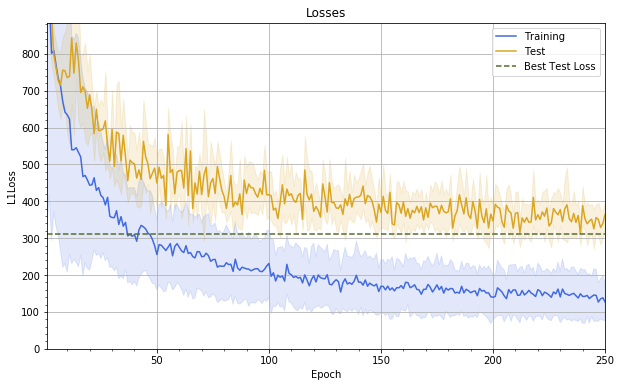

Starting the training with GPU:
[  13/ 250] (8m 49s) 	Mean Loss:	Train=137.21 +-61.00	Test=321.23 +-39.46
[  26/ 250] (17m 32s) 	Mean Loss:	Train=133.49 +-55.50	Test=364.65 +-44.88
[  39/ 250] (26m 15s) 	Mean Loss:	Train=143.56 +-62.83	Test=339.39 +-37.19
[  52/ 250] (34m 59s) 	Mean Loss:	Train=120.03 +-55.65	Test=349.77 +-47.32
[  65/ 250] (43m 42s) 	Mean Loss:	Train=122.22 +-59.81	Test=364.32 +-78.52
[  78/ 250] (52m 25s) 	Mean Loss:	Train=129.59 +-56.16	Test=314.33 +-49.93
[  91/ 250] (61m  7s) 	Mean Loss:	Train=120.74 +-58.63	Test=332.97 +-34.64
[ 104/ 250] (69m 46s) 	Mean Loss:	Train=121.27 +-50.15	Test=332.58 +-44.95
[ 117/ 250] (78m 26s) 	Mean Loss:	Train=117.71 +-62.47	Test=323.16 +-40.69
[ 130/ 250] (87m  6s) 	Mean Loss:	Train=130.03 +-51.66	Test=384.05 +-40.33
[ 143/ 250] (95m 45s) 	Mean Loss:	Train=123.34 +-57.81	Test=344.28 +-60.24
[ 156/ 250] (104m 25s) 	Mean Loss:	Train=116.01 +-46.40	Test=330.08 +-42.67
[ 169/ 250] (113m  4s) 	Mean Loss:	Train=119.28 +-46.53	Test=347.49 

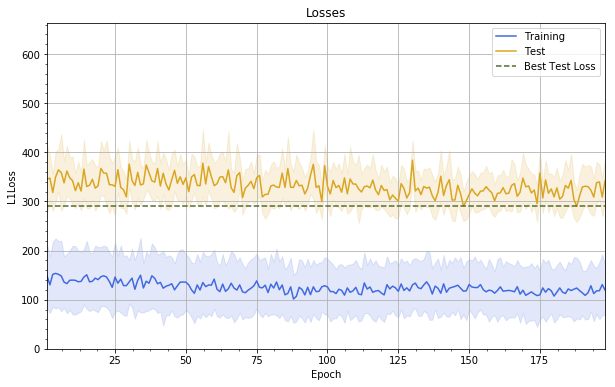

In [7]:
patience_later = test_early_stopping(
    dataset=dp.DroneRGBLater, 
    weight_decay=best_l2_later[0], 
    patiences=[10,20,30,40,50])

#### 3.3.3 Conclusions

The results of early stopping are given for both datasets in the following tables:

In [8]:
print("RGB Earlier")
patience_earlier

RGB Earlier


,patience,best_loss,epochs,loss_mean,loss_std
0,10.0,442.568905,64.0,652.732973,181.010949
1,20.0,475.865384,128.0,660.361022,197.497219
2,30.0,359.135610,251.0,496.956566,163.637972
3,40.0,387.705086,287.0,507.828459,145.497254
4,50.0,336.424516,374.0,445.221032,121.583728


In [9]:
print("RGB Later")
patience_later

RGB Later


,patience,best_loss,epochs,loss_mean,loss_std
0,10.0,458.259208,37.0,689.366714,156.662237
1,20.0,299.523190,145.0,454.339165,158.508255
2,30.0,300.424082,263.0,428.345090,118.286111
3,40.0,284.238316,213.0,414.121476,150.115116
4,50.0,290.214867,448.0,393.599324,107.938768


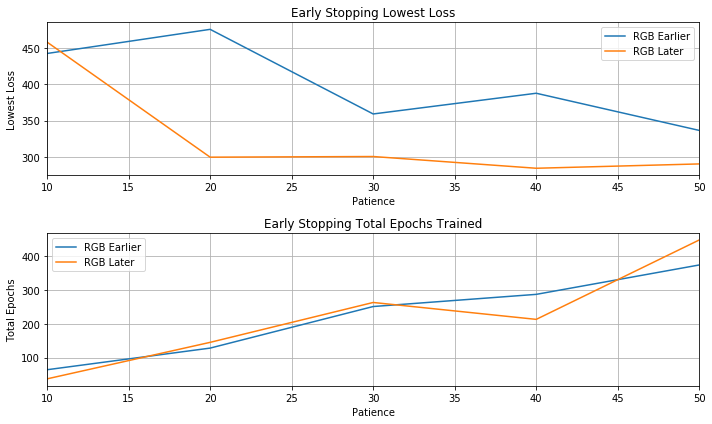

In [26]:
import matplotlib.pyplot as plt

plt.subplot(211)
plt.plot(patience_earlier['patience'],patience_earlier['best_loss'],label='RGB Earlier')
plt.plot(patience_later['patience'],patience_later['best_loss'],label='RGB Later')
plt.title("Early Stopping Lowest Loss")
plt.xlabel("Patience")
plt.ylabel("Lowest Loss")
plt.xlim(10,50)
plt.grid()
plt.legend()

plt.subplot(212)
plt.plot(patience_earlier['patience'],patience_earlier['epochs'],label='RGB Earlier')
plt.plot(patience_later['patience'],patience_later['epochs'],label='RGB Later')
plt.title("Early Stopping Total Epochs Trained")
plt.xlabel("Patience")
plt.ylabel("Total Epochs")
plt.xlim(10,50)
plt.grid()
plt.legend()

plt.tight_layout()
plt.show()

The increase in in patience seems have the average effect of linearly increasing the training time. However at the same time the losses behave in convex way, where the minimum is somewhere between 150 and 300 total epochs trained. 

### 3.4 Conclusions for Regularization

We will use weight decays ``9.914449`` and ``1.0`` for the earlier and later datasets respectively and patience of ``30`` for the earlier and ``40`` for the later dataset.

## 4. Optimizer Tuning

The last step is to tune the hyperparameters of the optimizer. Adadelta has effectively two parameters that can be tuned. These are the initial learning rate ``lr`` that will be dynamically changed by the optimizer and the coefficient for running average of squared gradients ``rho`` used to determinate the changing of the learning rate. 

In the original Adadelta paper they performed hyperparameter tuning with just 6 epochs on the digit classification task. We will be a bit more generous to our network and use 25 epochs to determine the optimal settings. This means that we wont be utilizing early stopping here, but we will incorporate weight decay.

We will first conduct coarse grid search and random searh after that if necessary. We will use same initialized models as in the regularization testing phase.

In [4]:
import os
import shutil

import numpy as np
import pandas as pd
import seaborn as sns

from torch import optim
from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN

%matplotlib inline

DB_128 = 'field_analysis_40m_128px.db'
DATASET_NAMES = ['earlier', 'later']


def copy_model(cnn, is_later, save):
    "Copy the dataset-wise persisted model either for later use (`save=True`) or current use (`save=False`)."

    model_folder, _ = os.path.split(cnn.model_path)
    model_name, suffix = cnn.model_filename.split('.')
    model_name = "{}_{}.{}".format(
        model_name, DATASET_NAMES[is_later], suffix)

    if save:

        from_path = cnn.model_path
        to_path = os.path.join(model_folder, model_name)

    else:

        from_path = os.path.join(model_folder, model_name)
        to_path = cnn.model_path

    shutil.copyfile(from_path, to_path)
    print("Persisted model copied \n\tFrom: {} \n\tTo: {}".format(from_path, to_path))


def test_optimizer(dataset, weight_decay, lrs, rhos):

    best_losses = pd.DataFrame(
        columns=['lr', 'rho', 'best_loss', 'loss_mean', 'loss_std'])

    for lr in lrs:

        for rho in rhos:

            print("lr={}, rho={}".format(lr, rho))

            cnn = DroneYieldMeanCNN(
                source_bands=3,
                source_dim=128,
                cnn_layers=8,
                optimizer=optim.Adadelta,
                optimizer_parameters={
                    'weight_decay': weight_decay,
                    'lr': lr,
                    'rho': rho})

            copy_model(
                cnn=cnn,
                is_later=isinstance(dataset, dp.DroneRGBLater),
                save=False)
            cnn.load_model()

            losses_dict = cnn.train(
                epochs=50,
                training_data=dataset(DB_128),
                k_cv_folds=3,
                suppress_output=True)

            losses = np.array(losses_dict['test_losses_mean_std'])[:, 0]
            best_losses = best_losses.append(
                {'lr': lr,
                 'rho': rho,
                 'best_loss': losses.min(),
                 'loss_mean': losses.mean(),
                 'loss_std': losses.std()},
                ignore_index=True)

    return best_losses.sort_values(by='best_loss').reset_index(drop=True)

# (lr, rho, loss)
best_optimizer_earlier = (None, None, None)
best_optmizer_later = (None, None, None)

### 4.1 Grid Search

For the initial values we will use learning rates of ``1e-4``,``1e-3``,``1e-2``,``1e-1`` and ``1e0``. For the running average coefficient we will use ``0.0``,``0.3``,``0.6`` and ``0.9``. This totals to 20 trainings per dataset.

#### 4.1.1 RGB Earlier Dataset

lr=0.0001, rho=0
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 524.65


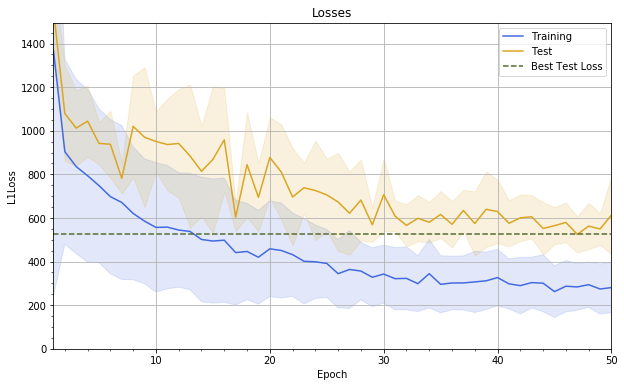

lr=0.0001, rho=0.3
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 512.13


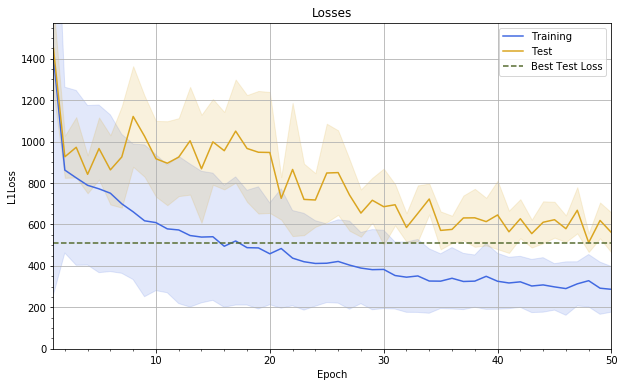

lr=0.0001, rho=0.6
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 427.84


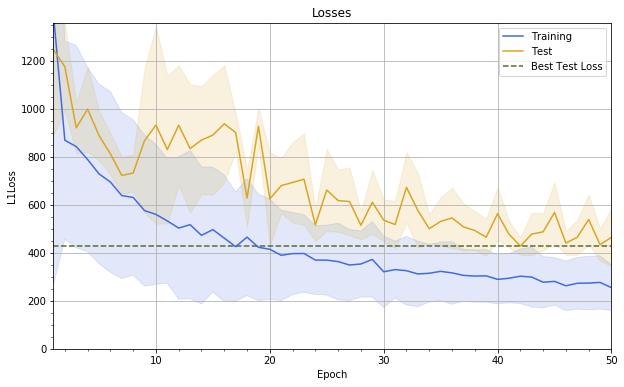

lr=0.0001, rho=0.9
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 440.32


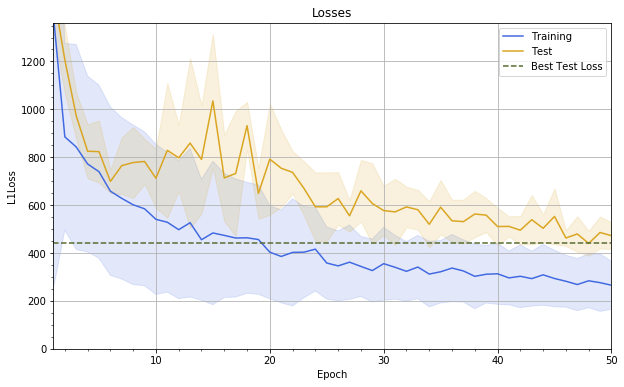

lr=0.001, rho=0
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 464.72


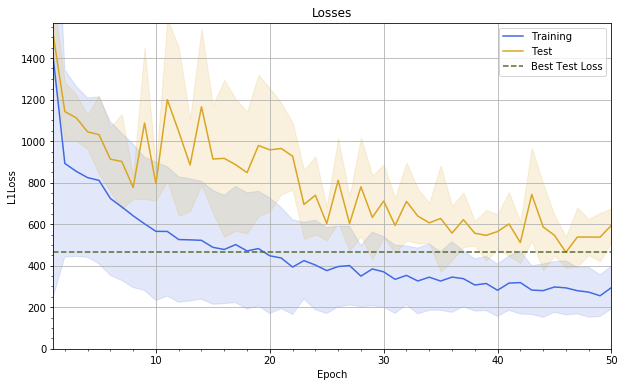

lr=0.001, rho=0.3
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 456.94


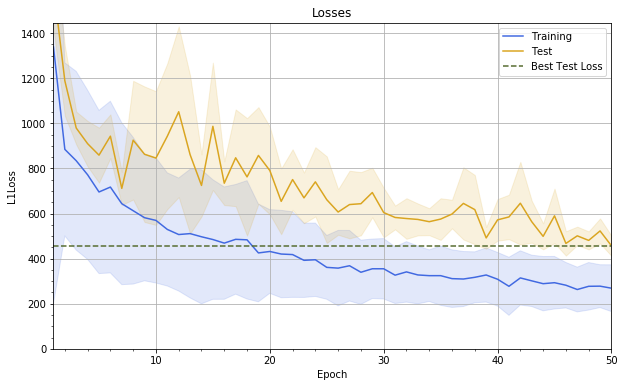

lr=0.001, rho=0.6
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 476.31


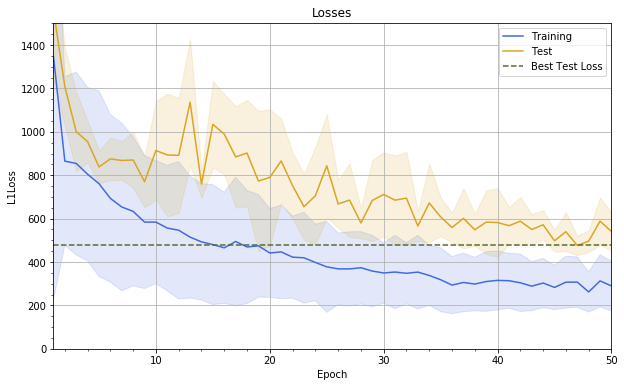

lr=0.001, rho=0.9
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 488.59


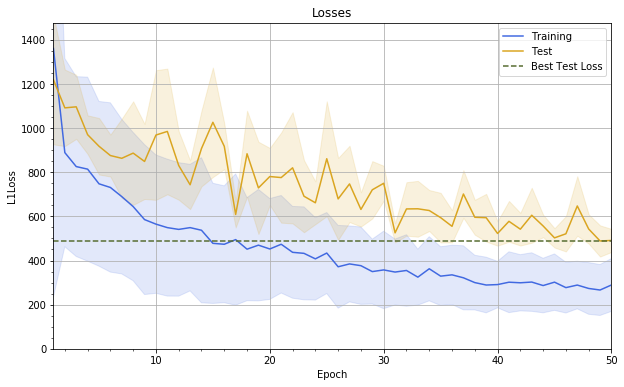

lr=0.01, rho=0
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 437.35


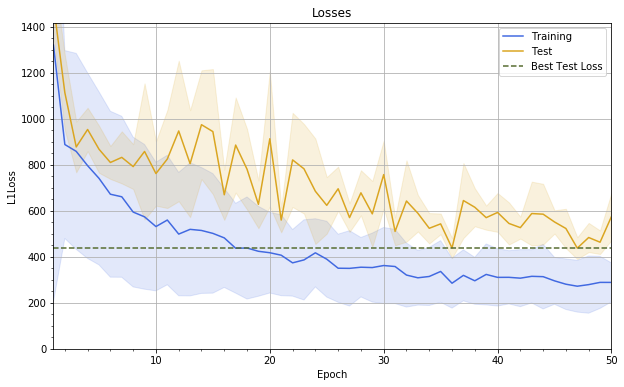

lr=0.01, rho=0.3
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 439.34


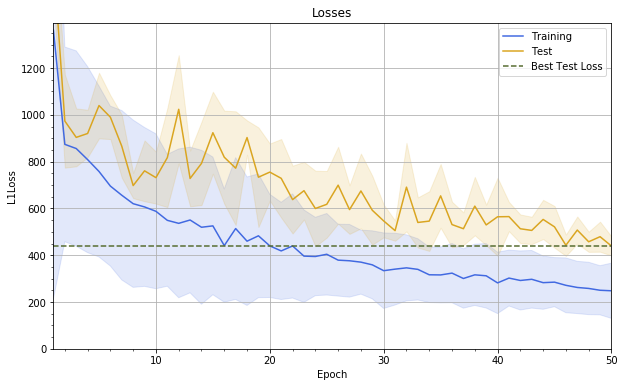

lr=0.01, rho=0.6
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 546.91


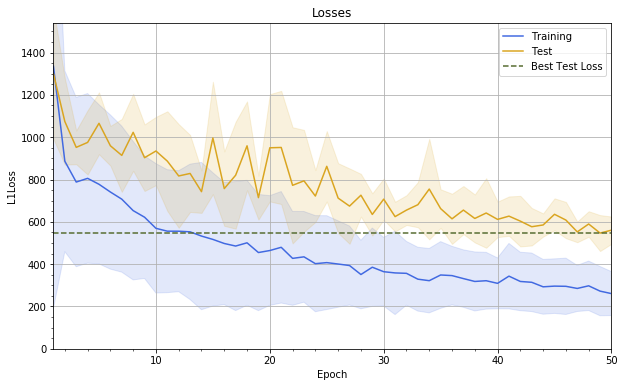

lr=0.01, rho=0.9
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 517.19


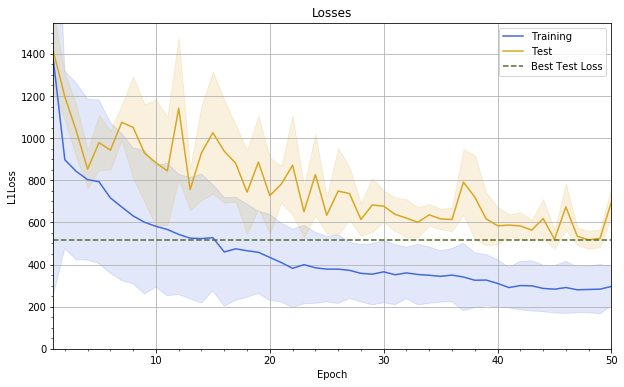

lr=0.1, rho=0
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 616.66


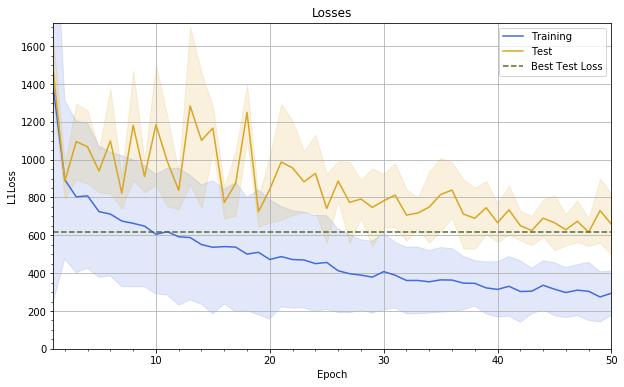

lr=0.1, rho=0.3
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 550.98


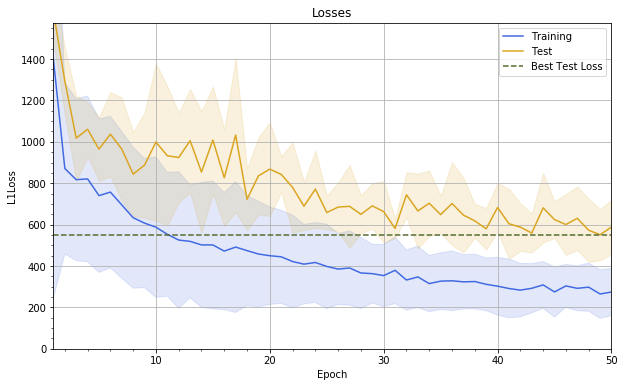

lr=0.1, rho=0.6
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 509.39


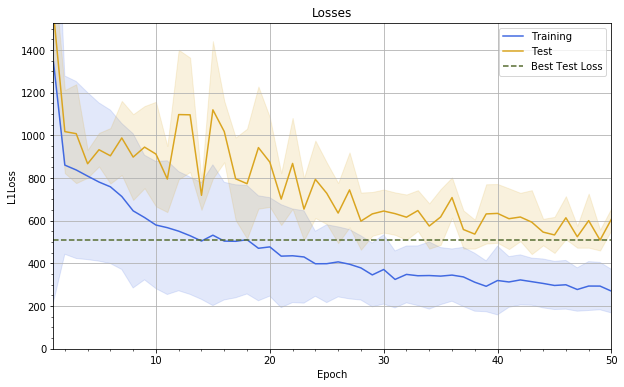

lr=0.1, rho=0.9
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 566.90


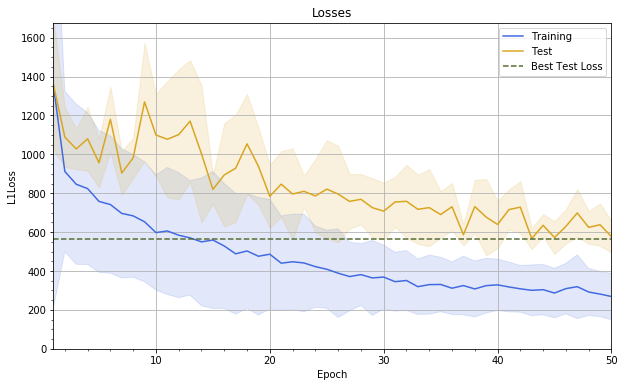

lr=1.0, rho=0
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 563.87


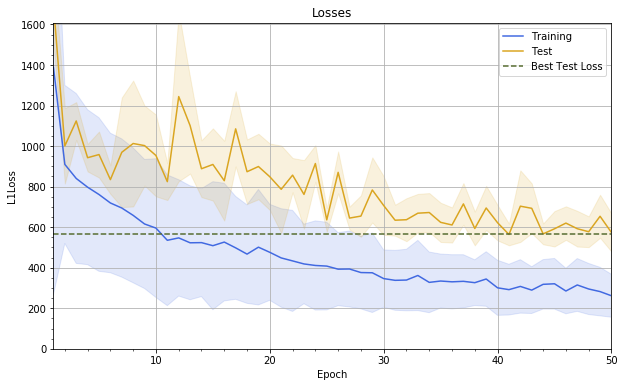

lr=1.0, rho=0.3
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 462.14


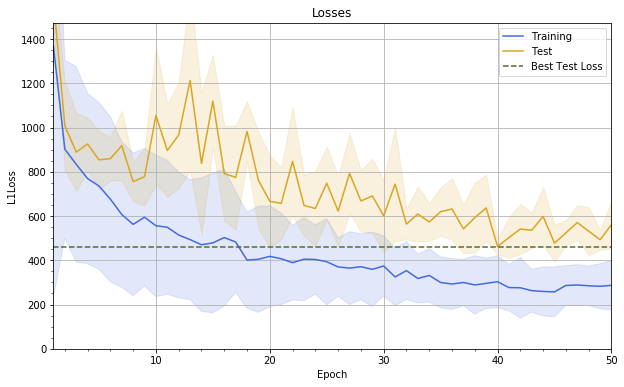

lr=1.0, rho=0.6
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 499.73


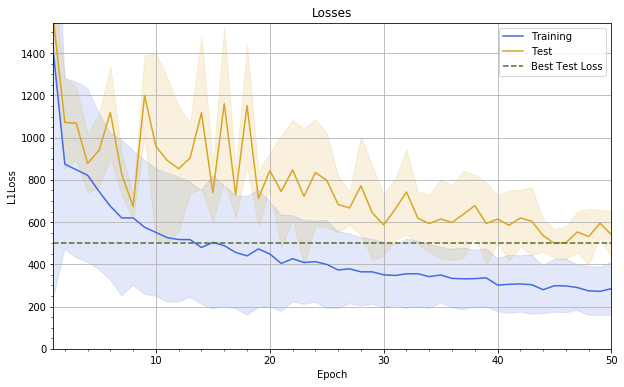

lr=1.0, rho=0.9
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 502.95


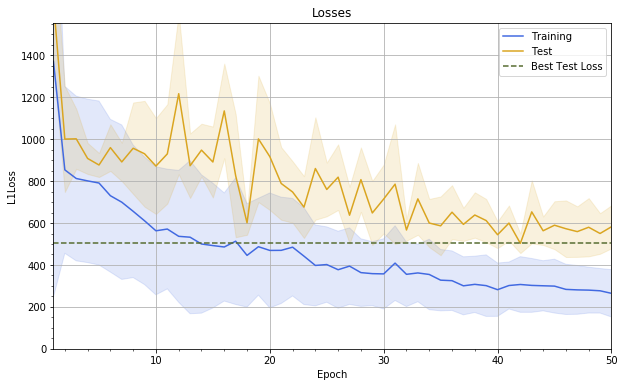

In [6]:
optimizer_earlier = test_optimizer(dp.DroneRGBEarlier, 
                                   best_l2_earlier[0], 
                                   [1e-4,1e-3,1e-2,1e-1,1e0], 
                                   [0,0.3,0.6,0.9])

rho,0.0,0.3,0.6,0.9
lr,,,,
0.0001,524.651799,512.128309,427.840375,440.321377
0.0010,464.722813,456.944336,476.314810,488.591600
0.0100,437.348932,439.337653,546.907639,517.187096
0.1000,616.661708,550.980401,509.392738,566.901261
1.0000,563.873631,462.139700,499.726654,502.954276


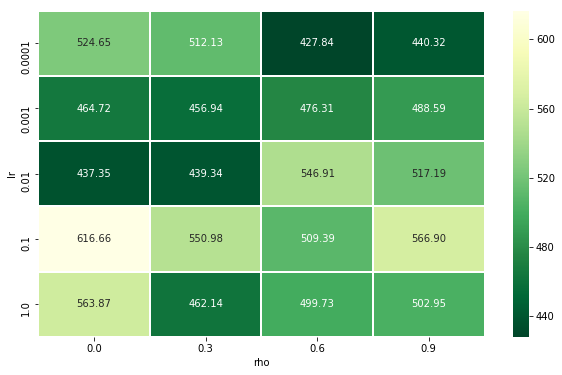

In [7]:
pivot = optimizer_earlier.pivot_table(values='best_loss',index='lr',columns='rho')
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGn_r', linewidth=1, linecolor='white')
pivot

In [8]:
best_row = optimizer_earlier.loc[optimizer_earlier['best_loss'].idxmin()]
best_optimizer_earlier = (best_row['lr'], best_row['rho'], best_row['best_loss'])
best_optimizer_earlier

(0.0001, 0.6, 427.8403746287028)

#### 4.1.2 RGB Later Dataset

lr=0.0001, rho=0
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 380.99


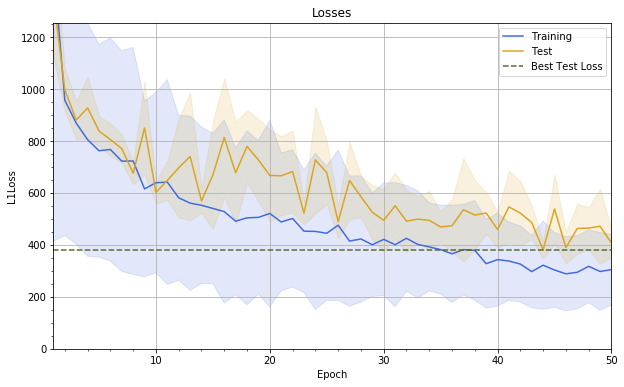

lr=0.0001, rho=0.3
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 456.98


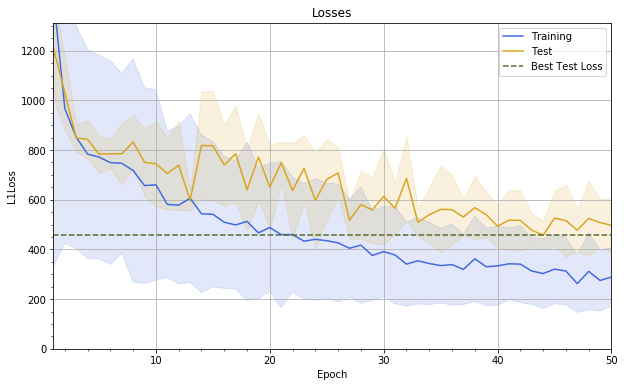

lr=0.0001, rho=0.6
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 417.54


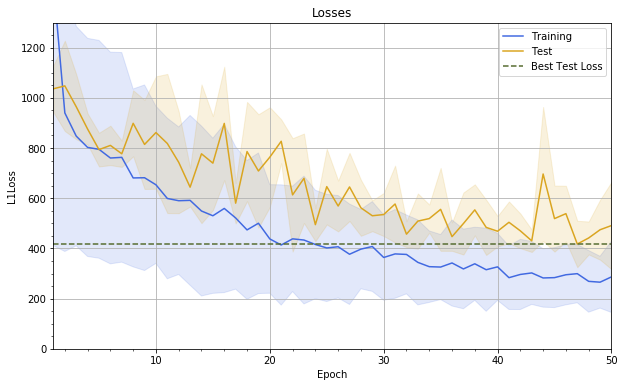

lr=0.0001, rho=0.9
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 435.79


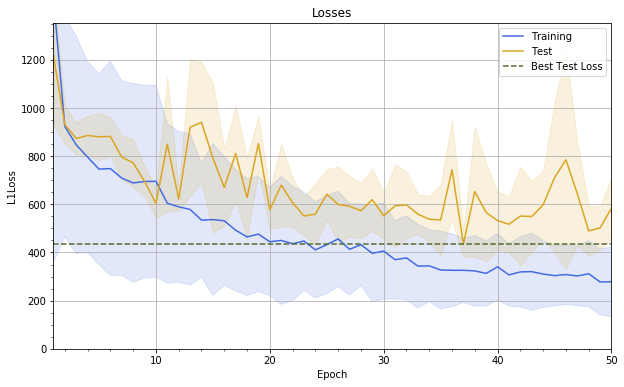

lr=0.001, rho=0
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 389.47


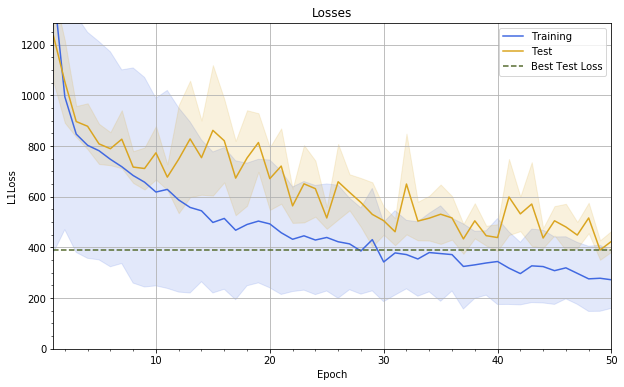

lr=0.001, rho=0.3
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 422.01


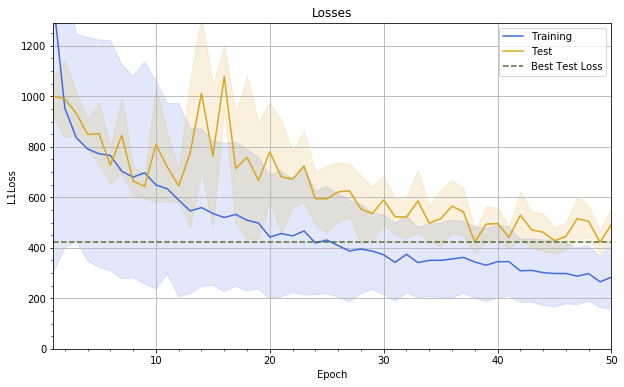

lr=0.001, rho=0.6
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 431.45


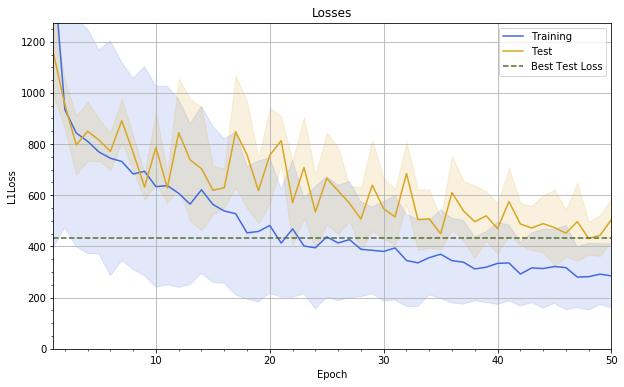

lr=0.001, rho=0.9
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 423.39


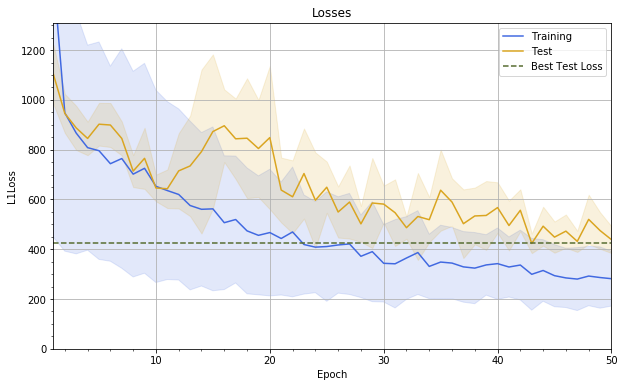

lr=0.01, rho=0
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 421.74


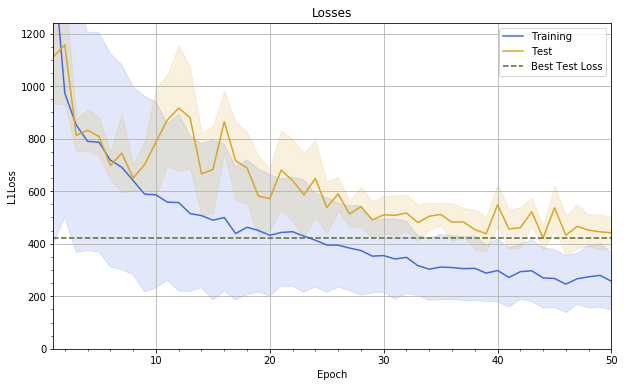

lr=0.01, rho=0.3
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 364.64


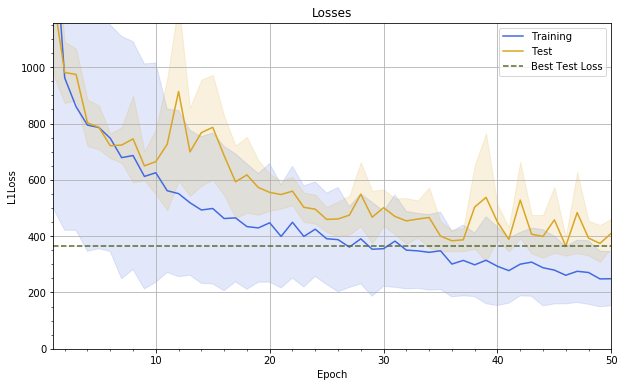

lr=0.01, rho=0.6
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 432.56


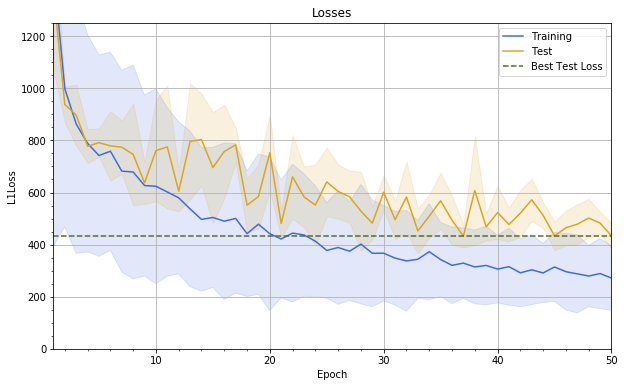

lr=0.01, rho=0.9
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 379.04


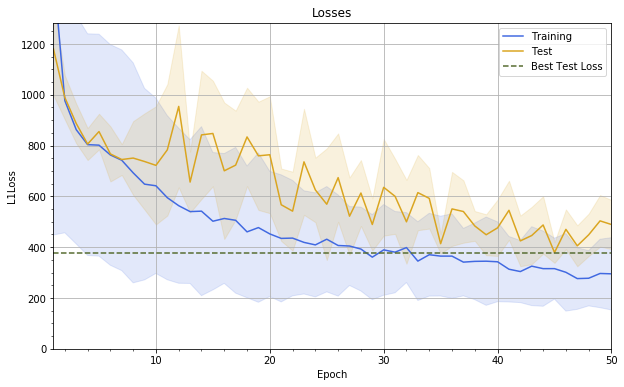

lr=0.1, rho=0
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 421.25


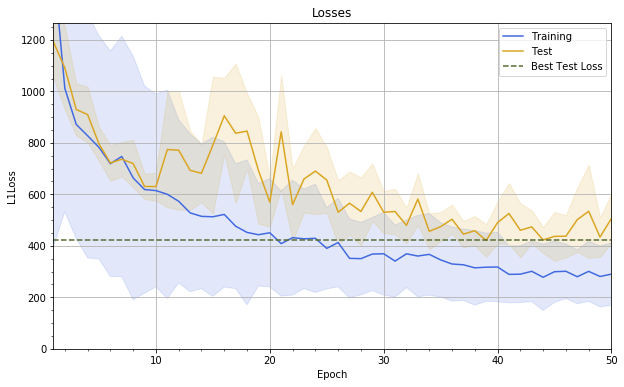

lr=0.1, rho=0.3
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 354.19


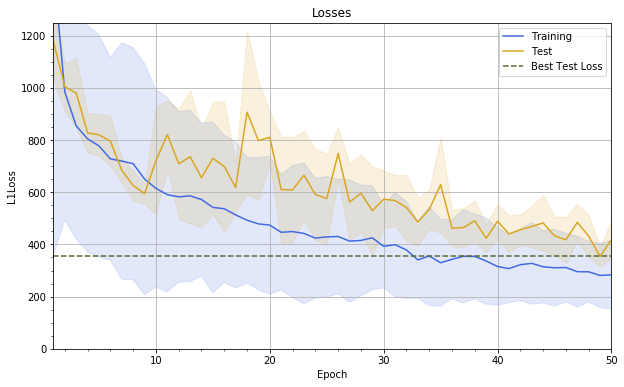

lr=0.1, rho=0.6
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 394.00


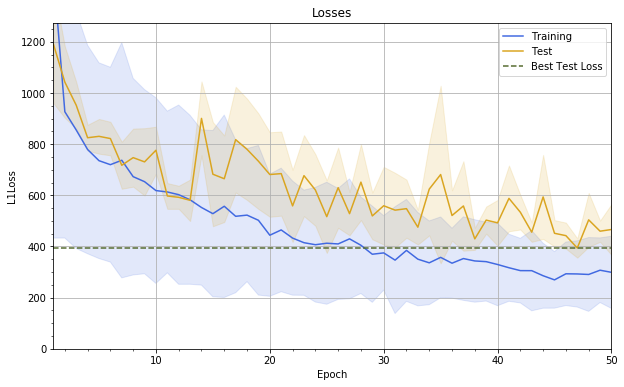

lr=0.1, rho=0.9
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 384.50


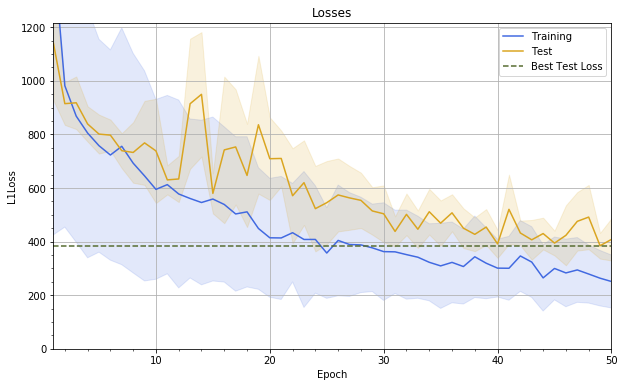

lr=1.0, rho=0
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 389.61


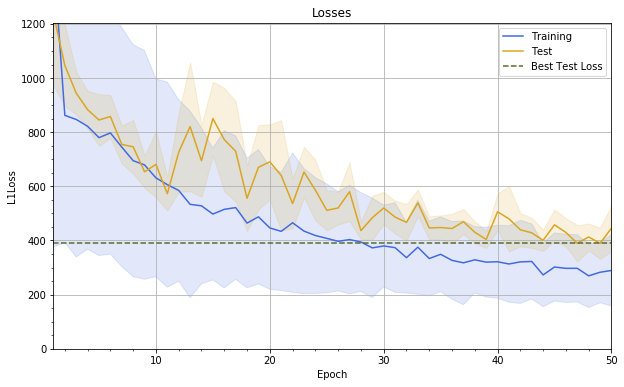

lr=1.0, rho=0.3
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 395.83


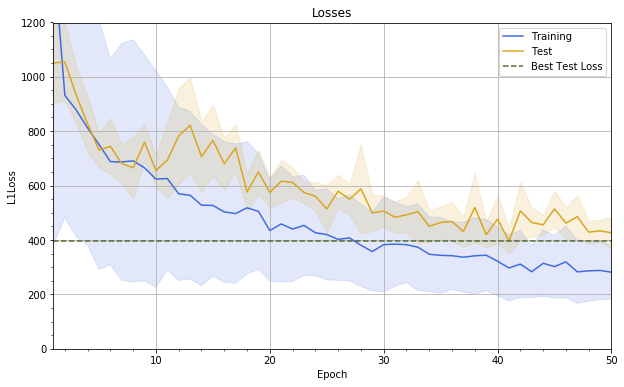

lr=1.0, rho=0.6
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 392.24


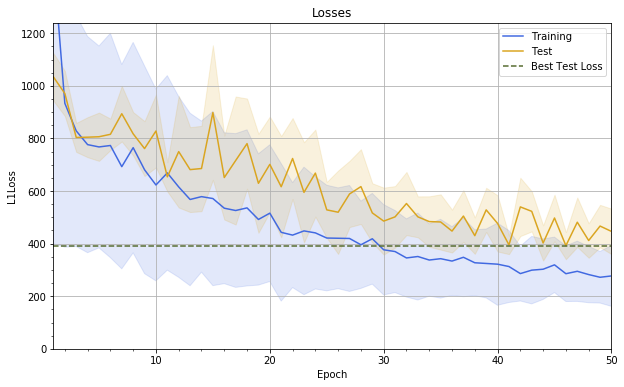

lr=1.0, rho=0.9
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 395.21


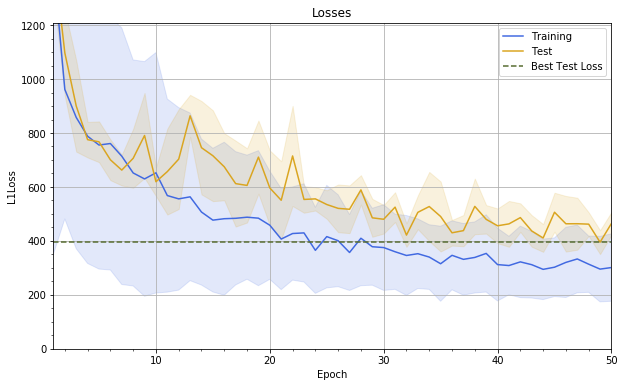

In [9]:
optimizer_later = test_optimizer(dp.DroneRGBLater, 
                                   best_l2_later[0], 
                                   [1e-4,1e-3,1e-2,1e-1,1e0], 
                                   [0,0.3,0.6,0.9])

rho,0.0,0.3,0.6,0.9
lr,,,,
0.0001,380.990003,456.981073,417.538918,435.790875
0.0010,389.466664,422.005511,431.449004,423.393032
0.0100,421.737947,364.644929,432.557881,379.035538
0.1000,421.246863,354.190124,393.996984,384.504067
1.0000,389.605764,395.834487,392.242872,395.213361


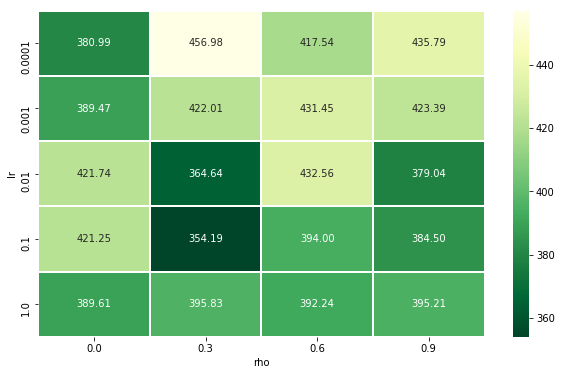

In [10]:
pivot = optimizer_later.pivot_table(values='best_loss',index='lr',columns='rho')
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGn_r', linewidth=1, linecolor='white')
pivot

In [11]:
best_row = optimizer_later.loc[optimizer_later['best_loss'].idxmin()]
best_optimizer_later = (best_row['lr'], best_row['rho'], best_row['best_loss'])
best_optimizer_later

(0.1, 0.3, 354.19012378510973)

#### 4.1.3 Conclusions

From the results it seems that the optimal learning rate is in the ballpark of ``0.01`` for the earlier and ``0.1`` for the later dataset. The coefficient for the squared gradients is however around ``0.3`` for both datasets.

### 4.2 Random Search

Next up the random search with values in the ballpark of the ones concluded in the grid search.

#### 4.2.1 RGB Earlier Dataset

lr=0.0001360584767623883, rho=0.5479246795085355
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 512.91


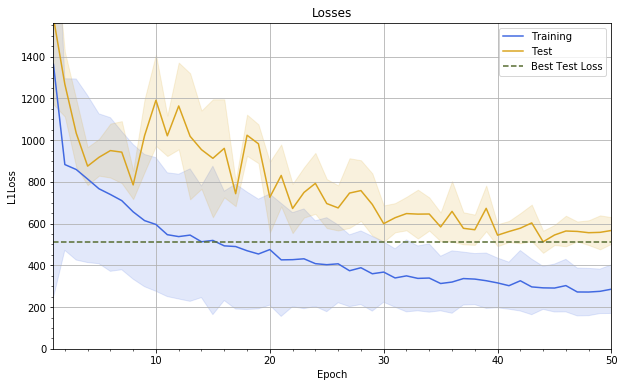

lr=0.0001360584767623883, rho=0.49426359152608784
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 521.41


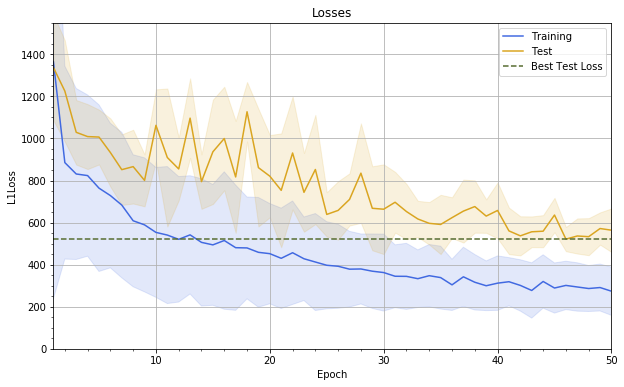

lr=0.0001360584767623883, rho=0.5273141811567177
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 468.78


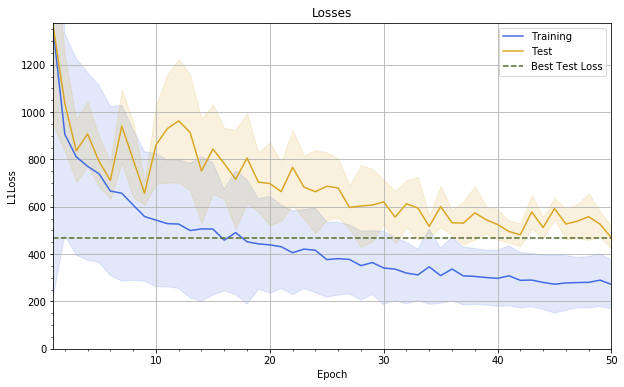

lr=0.0001360584767623883, rho=0.5595068456595697
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 445.15


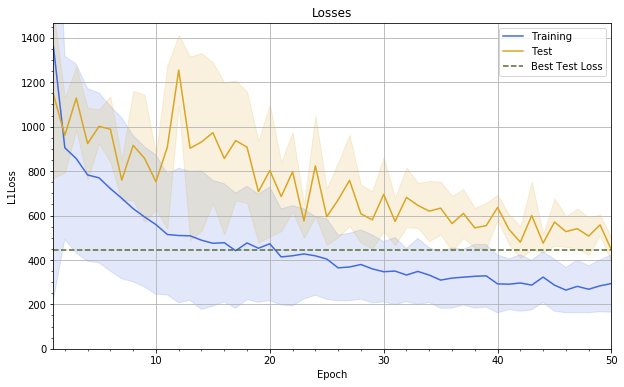

lr=0.00010803726260004399, rho=0.5479246795085355
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 632.33


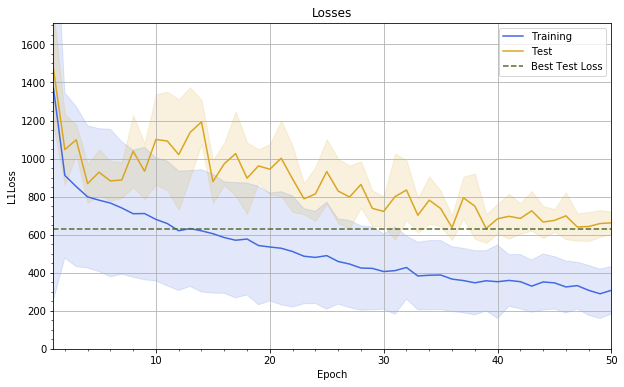

lr=0.00010803726260004399, rho=0.49426359152608784
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 515.73


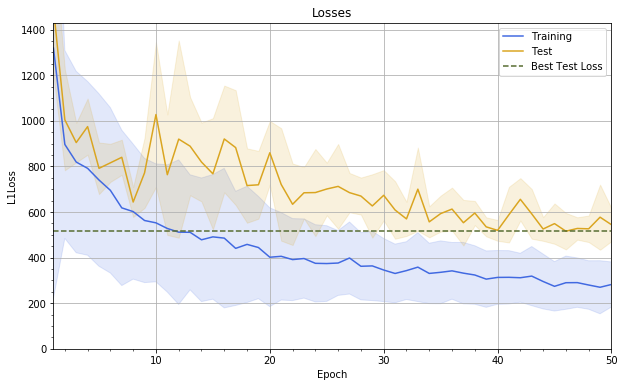

lr=0.00010803726260004399, rho=0.5273141811567177
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 482.17


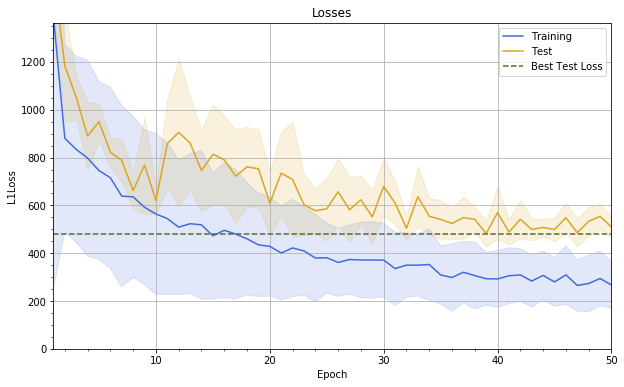

lr=0.00010803726260004399, rho=0.5595068456595697
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 530.41


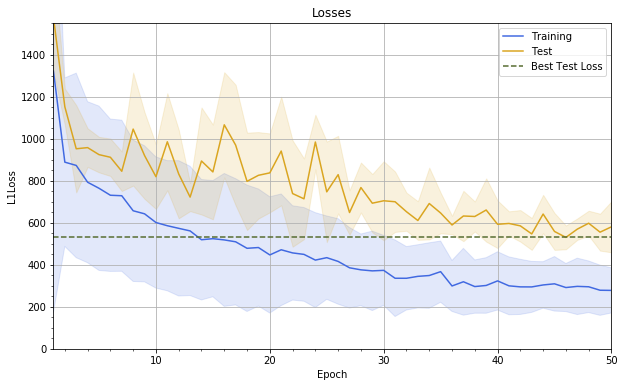

lr=0.00012192289791136362, rho=0.5479246795085355
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 527.95


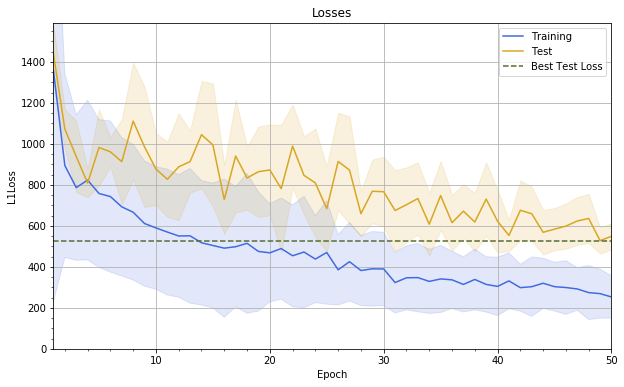

lr=0.00012192289791136362, rho=0.49426359152608784
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 465.57


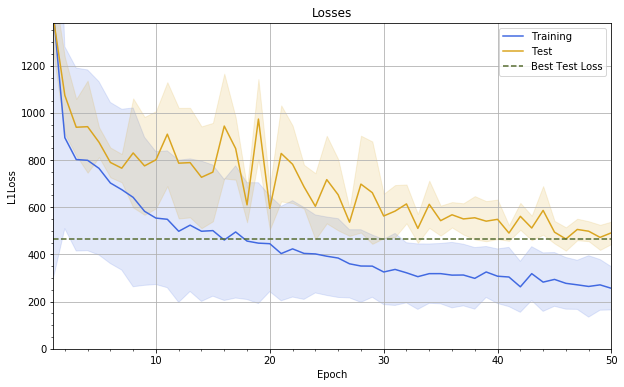

lr=0.00012192289791136362, rho=0.5273141811567177
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 471.26


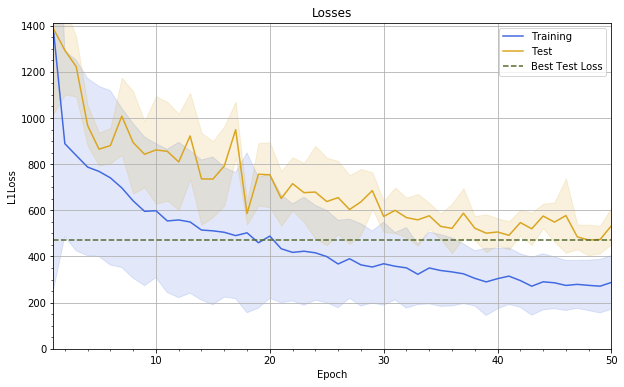

lr=0.00012192289791136362, rho=0.5595068456595697
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 458.88


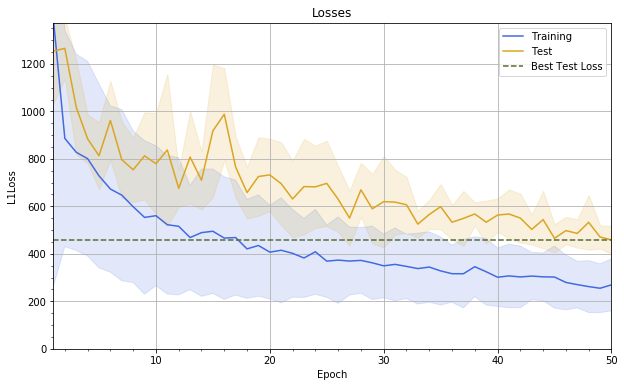

lr=0.00011272612809968208, rho=0.5479246795085355
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 507.67


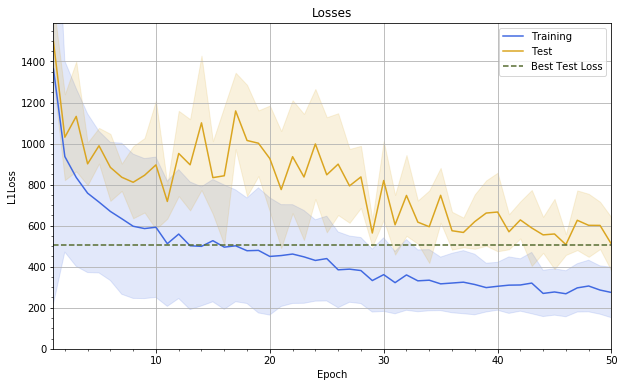

lr=0.00011272612809968208, rho=0.49426359152608784
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 470.56


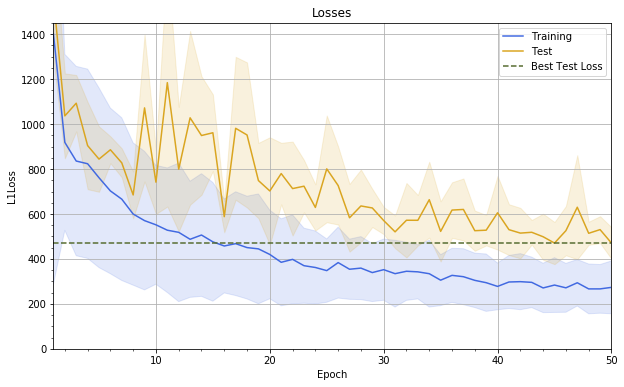

lr=0.00011272612809968208, rho=0.5273141811567177
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 536.38


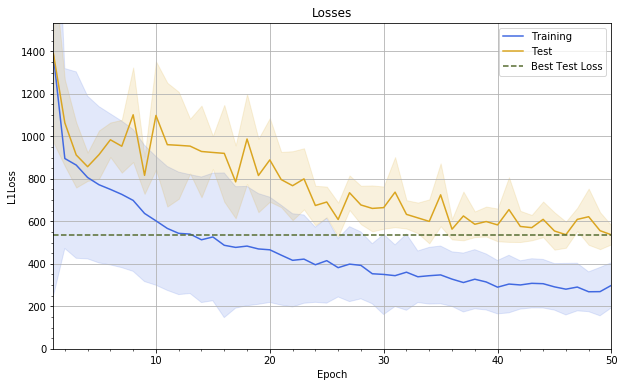

lr=0.00011272612809968208, rho=0.5595068456595697
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 477.97


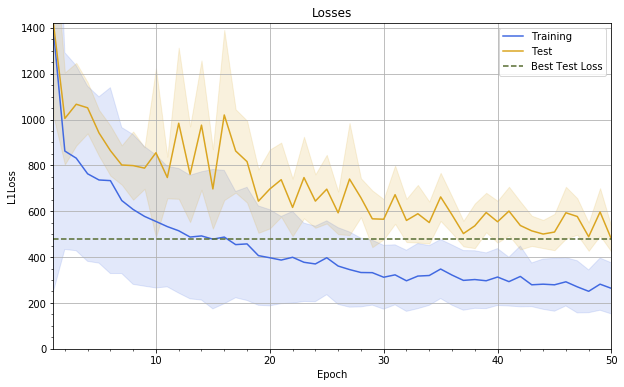

In [12]:
optimizer_earlier = test_optimizer(
    dp.DroneRGBEarlier, 
    best_l2_earlier[0],
    np.abs(np.random.normal(loc=best_optimizer_earlier[0],
                            scale=2*best_optimizer_earlier[0]*0.1, 
                            size=4)),
    np.abs(np.random.normal(loc=best_optimizer_earlier[1],
                            scale=2*best_optimizer_earlier[1]*0.1, 
                            size=4)))

rho,0.49426359152608784,0.5273141811567177,0.5479246795085355,0.5595068456595697
lr,,,,
0.000108,515.731616,482.170986,632.331785,530.410683
0.000113,470.561107,536.381951,507.667383,477.972389
0.000122,465.571954,471.264332,527.946226,458.884445
0.000136,521.407012,468.783473,512.909559,445.147072


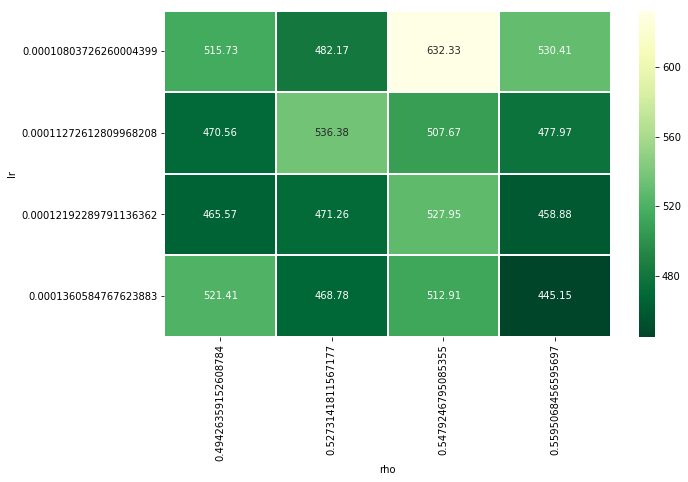

In [13]:
pivot = optimizer_earlier.pivot_table(values='best_loss',index='lr',columns='rho')
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGn_r', linewidth=1, linecolor='white')
pivot

In [14]:
best_row = optimizer_earlier.loc[optimizer_earlier['best_loss'].idxmin()]

if best_row['best_loss'] < best_optimizer_earlier[-1]:
    best_optimizer_earlier = (best_row['lr'], best_row['rho'], best_row['best_loss'])
    
best_optimizer_earlier

(0.0001, 0.6, 427.8403746287028)

#### 4.2.2 RGB Later Dataset

lr=0.13045993203868536, rho=0.4019908165639722
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 389.89


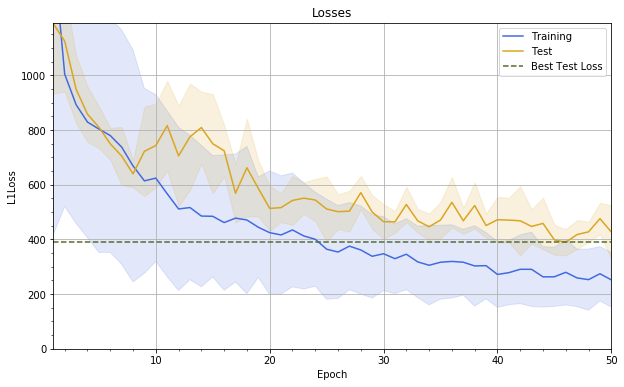

lr=0.13045993203868536, rho=0.3520236251079397
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 411.19


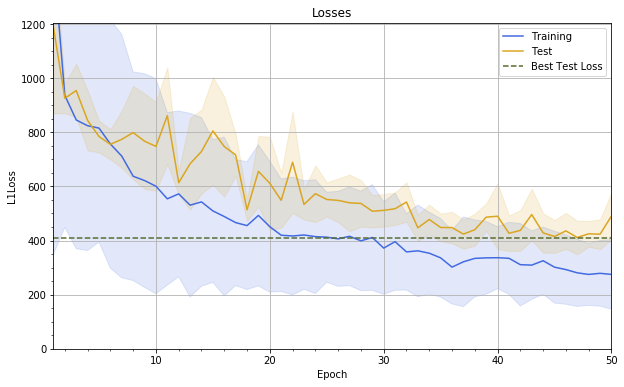

lr=0.13045993203868536, rho=0.34221224798163696
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 493.20


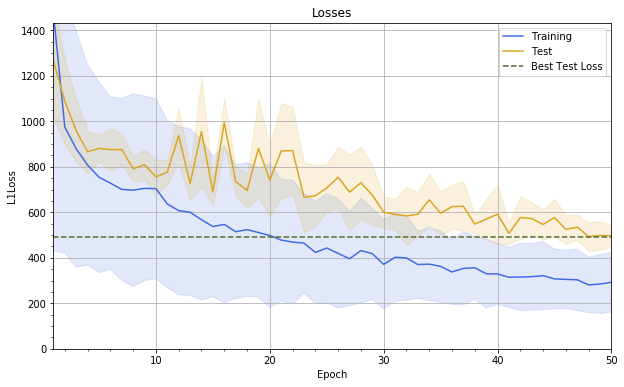

lr=0.13045993203868536, rho=0.3130855543561266
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 448.27


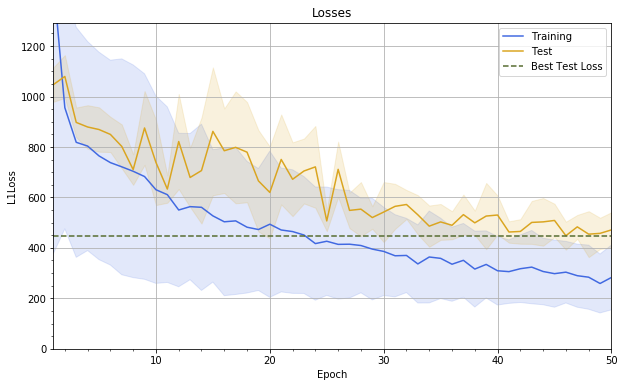

lr=0.07504137486297979, rho=0.4019908165639722
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 408.63


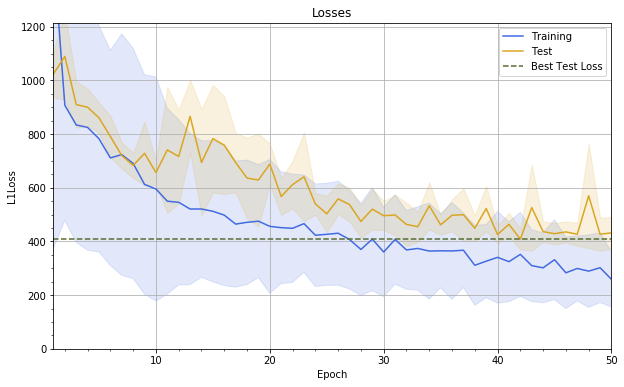

lr=0.07504137486297979, rho=0.3520236251079397
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 386.43


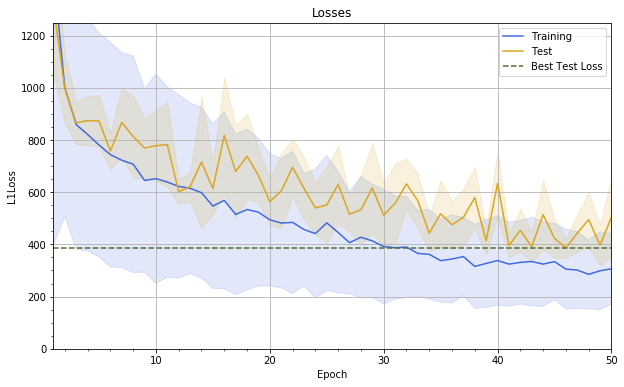

lr=0.07504137486297979, rho=0.34221224798163696
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 388.31


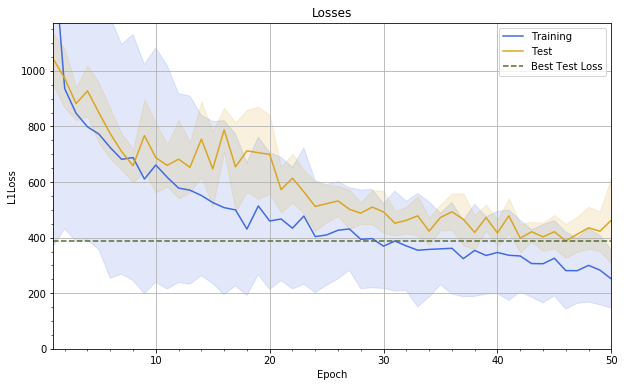

lr=0.07504137486297979, rho=0.3130855543561266
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 398.49


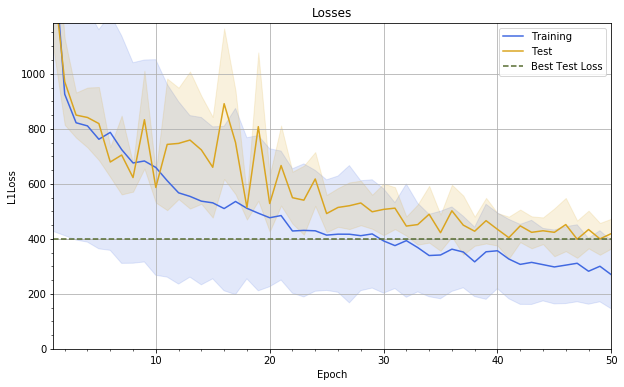

lr=0.07829348507503459, rho=0.4019908165639722
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 381.02


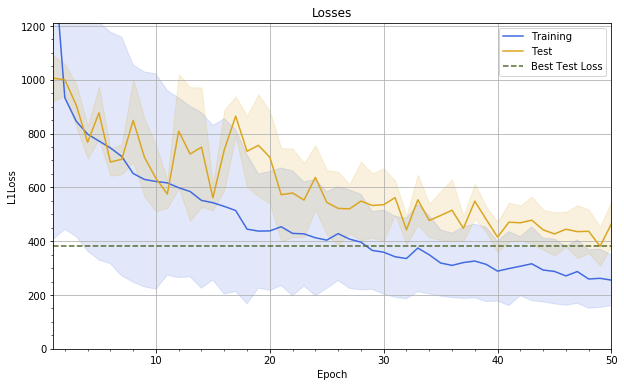

lr=0.07829348507503459, rho=0.3520236251079397
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 518.88


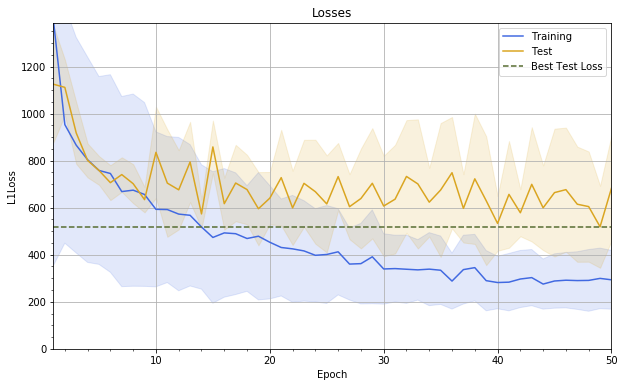

lr=0.07829348507503459, rho=0.34221224798163696
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 412.74


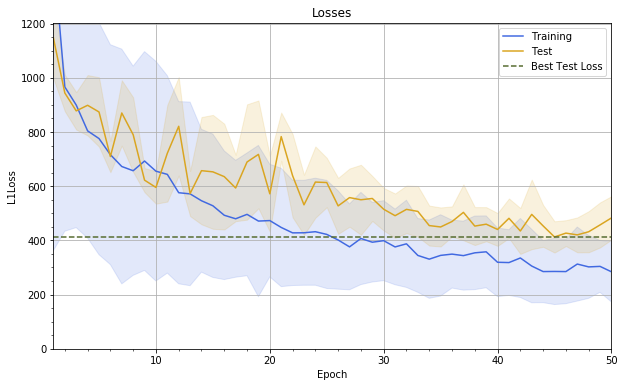

lr=0.07829348507503459, rho=0.3130855543561266
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 408.35


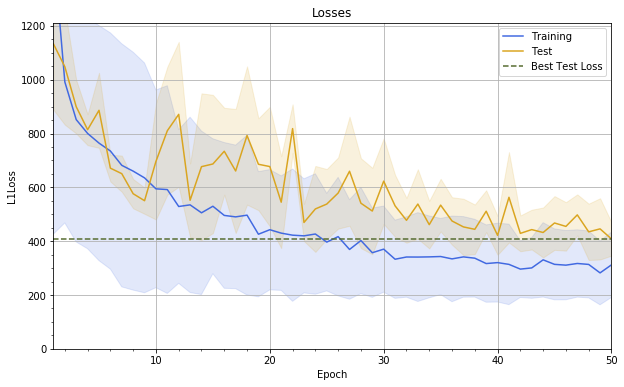

lr=0.11997355678672353, rho=0.4019908165639722
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 376.29


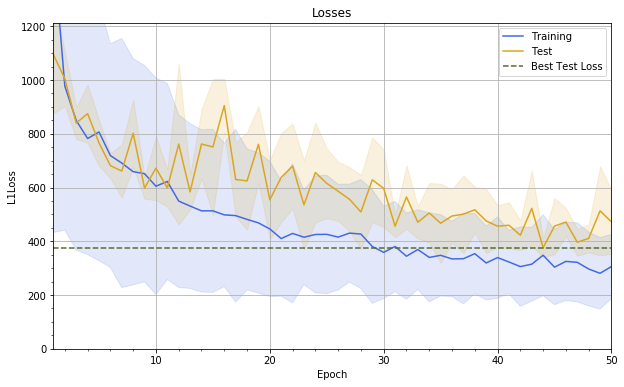

lr=0.11997355678672353, rho=0.3520236251079397
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 394.88


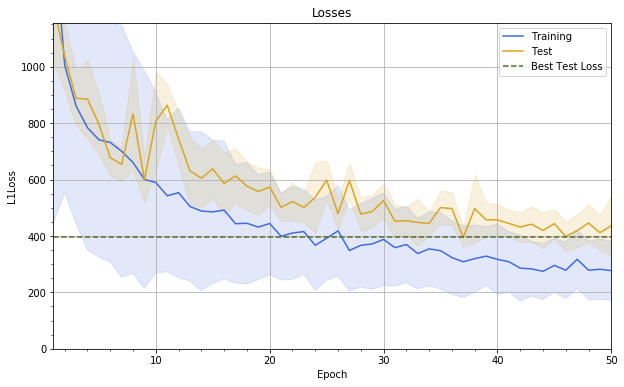

lr=0.11997355678672353, rho=0.34221224798163696
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 410.91


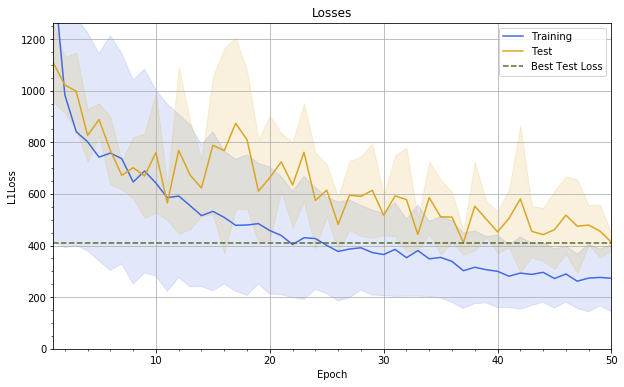

lr=0.11997355678672353, rho=0.3130855543561266
Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 413.70


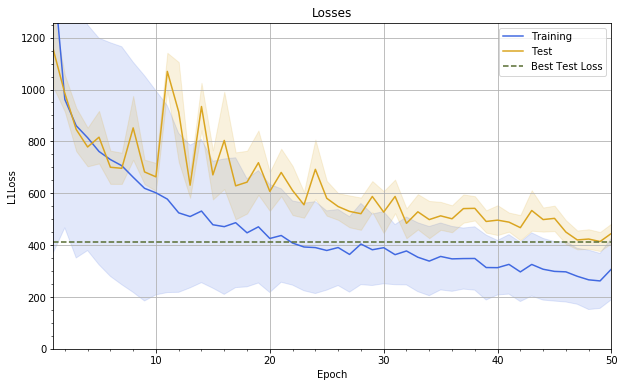

In [16]:
optimizer_later = test_optimizer(
    dp.DroneRGBLater, 
    best_l2_later[0],
    np.abs(np.random.normal(loc=best_optimizer_later[0],
                            scale=2*best_optimizer_later[0]*0.1, 
                            size=4)),
    np.abs(np.random.normal(loc=best_optimizer_later[1],
                            scale=2*best_optimizer_later[1]*0.1, 
                            size=4)))

rho,0.3130855543561266,0.34221224798163696,0.3520236251079397,0.4019908165639722
lr,,,,
0.075041,398.486795,388.306436,386.430412,408.634006
0.078293,408.350490,412.744742,518.878081,381.016260
0.119974,413.702855,410.907899,394.883502,376.290323
0.130460,448.270315,493.204742,411.194558,389.893366


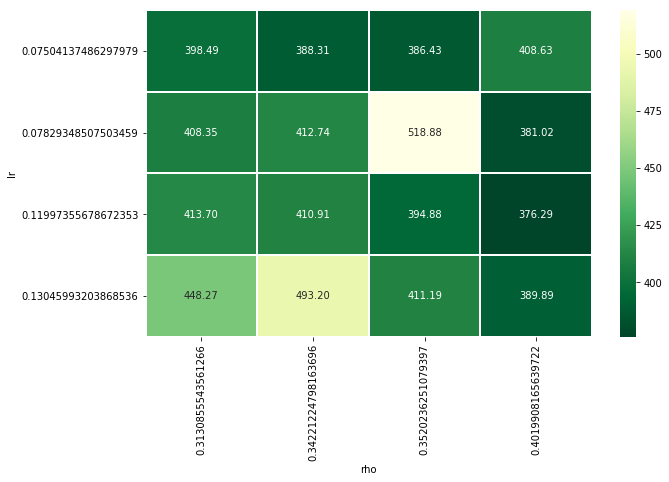

In [17]:
pivot = optimizer_later.pivot_table(values='best_loss',index='lr',columns='rho')
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGn_r', linewidth=1, linecolor='white')
pivot

In [18]:
best_row = optimizer_later.loc[optimizer_later['best_loss'].idxmin()]

if best_row['best_loss'] < best_optimizer_later[-1]:
    best_optimizer_later = (best_row['lr'], best_row['rho'], best_row['best_loss'])
    
best_optimizer_later

(0.1, 0.3, 354.19012378510973)

#### 4.2.3 Conclusions


In [19]:
print("RGB Earlier")
print("\tLearning Rate: {}".format(best_optimizer_earlier[0]))
print("\tMoving Mean Gradient Coefficient: {}".format(best_optimizer_earlier[1]))
print("\tBest Loss: {}".format(best_optimizer_earlier[2]))
print("RGB Later")
print("\tLearning Rate: {}".format(best_optimizer_later[0]))
print("\tMoving Mean Gradient Coefficient: {}".format(best_optimizer_later[1]))
print("\tBest Loss: {}".format(best_optimizer_later[2]))


RGB Earlier
	Learning Rate: 0.0001
	Moving Mean Gradient Coefficient: 0.6
	Best Loss: 427.8403746287028
RGB Later
	Learning Rate: 0.1
	Moving Mean Gradient Coefficient: 0.3
	Best Loss: 354.19012378510973


### 4.3. Full Training

We then want to see if tuning the optimizer resulted in better loss than using only vanilla default values.

In [20]:
def test_optimizer_full(dataset, weight_decay, patience, lr, rho):
    
    cnn = DroneYieldMeanCNN(
        source_bands=3,
        source_dim=128,
        cnn_layers=8,
        optimizer=optim.Adadelta,
        optimizer_parameters={
            'weight_decay': weight_decay,
            'lr': lr,
            'rho': rho})

    copy_model(
        cnn=cnn,
        is_later=isinstance(dataset, dp.DroneRGBLater),
        save=False)
    cnn.load_model()

    cnn.train(
        epochs=250,
        training_data=dataset(DB_128),
        k_cv_folds=3,
        early_stopping_patience=patience)
    
    cnn.train(
        epochs=250,
        training_data=dataset(DB_128),
        k_cv_folds=3,
        early_stopping_patience=patience)

#### 4.3.1 RGB Earlier Dataset

Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 21s) 	Mean Loss:	Train=518.49 +-298.81	Test=905.32 +-220.27
[  26/ 250] (12m 46s) 	Mean Loss:	Train=396.63 +-190.24	Test=752.50 +-195.16
[  39/ 250] (18m 60s) 	Mean Loss:	Train=330.18 +-146.39	Test=496.37 +-48.57
[  52/ 250] (25m 13s) 	Mean Loss:	Train=288.94 +-107.69	Test=552.19 +-162.76
[  65/ 250] (31m 27s) 	Mean Loss:	Train=234.77 +-103.16	Test=491.32 +-53.00
[  78/ 250] (37m 41s) 	Mean Loss:	Train=215.85 +-88.55	Test=495.02 +-69.26
[  91/ 250] (43m 55s) 	Mean Loss:	Train=234.99 +-94.57	Test=481.10 +-44.79
[ 104/ 250] (50m  9s) 	Mean Loss:	Train=196.54 +-84.38	Test=459.99 +-62.37
[ 117/ 250] (56m 23s) 	Mean Loss:	Train=189.19 +-79.87	Test=434.46 +-51.75
[ 130/ 250] (62m 38s) 	Mean L

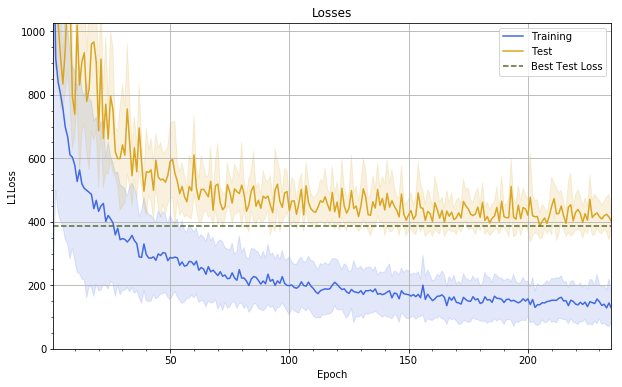

Starting the training with GPU:
[  13/ 250] (6m 21s) 	Mean Loss:	Train=127.89 +-55.23	Test=432.18 +-44.69
[  26/ 250] (12m 35s) 	Mean Loss:	Train=130.02 +-61.44	Test=407.48 +-44.74
[  32/ 250] (15m 35s) 	Mean Loss:	Train=134.29 +-52.71	Test=380.46 +-54.59
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Best Test Loss: 376.45


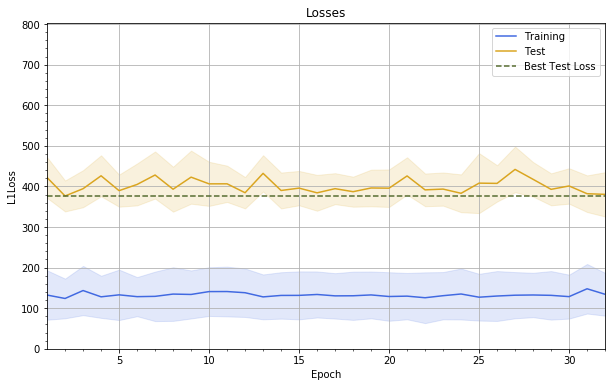

In [23]:
test_optimizer_full(dataset=dp.DroneRGBEarlier,
                    weight_decay=best_l2_earlier[0],
                    patience=30,
                    lr=best_optimizer_earlier[0], 
                    rho=best_optimizer_earlier[1])

#### 4.3.2 RGB Later Dataset

Persisted model copied 
	From: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc_earlier.pkl 
	To: /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Reading the model from /home/nevavuor/peltoanalyysi/models/cnn_3x128x128_8cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (5m 59s) 	Mean Loss:	Train=550.94 +-328.20	Test=609.42 +-115.20
[  26/ 250] (11m 46s) 	Mean Loss:	Train=412.74 +-176.35	Test=550.03 +-107.54
[  39/ 250] (17m 33s) 	Mean Loss:	Train=330.32 +-136.90	Test=488.86 +-95.78
[  52/ 250] (23m 20s) 	Mean Loss:	Train=268.82 +-121.98	Test=394.20 +-50.80
[  65/ 250] (29m  8s) 	Mean Loss:	Train=239.95 +-106.25	Test=401.39 +-64.57
[  78/ 250] (34m 55s) 	Mean Loss:	Train=214.86 +-109.17	Test=375.29 +-67.40
[  91/ 250] (40m 43s) 	Mean Loss:	Train=210.11 +-85.66	Test=321.39 +-40.88
[ 104/ 250] (46m 31s) 	Mean Loss:	Train=201.65 +-103.42	Test=319.71 +-33.63
[ 117/ 250] (52m 20s) 	Mean Loss:	Train=194.46 +-82.45	Test=340.35 +-52.06
[ 130/ 250] (58m  7s) 	Mean 

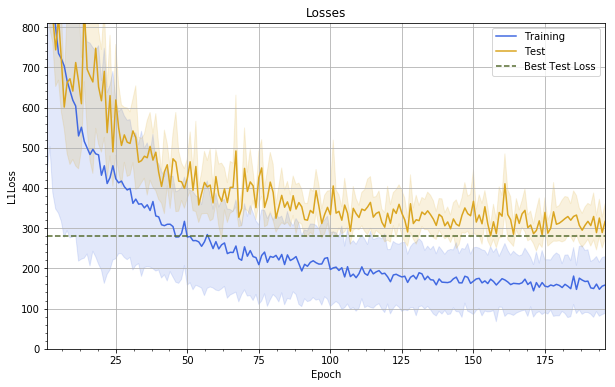

Starting the training with GPU:
[  13/ 250] (5m 54s) 	Mean Loss:	Train=156.04 +-72.14	Test=323.96 +-49.82
[  26/ 250] (11m 41s) 	Mean Loss:	Train=153.15 +-59.78	Test=313.42 +-59.57
[  39/ 250] (17m 28s) 	Mean Loss:	Train=140.79 +-54.97	Test=297.99 +-51.10
[  52/ 250] (23m 15s) 	Mean Loss:	Train=129.70 +-65.23	Test=299.65 +-50.22
[  65/ 250] (29m 11s) 	Mean Loss:	Train=142.56 +-66.93	Test=299.13 +-43.29
[  78/ 250] (35m  6s) 	Mean Loss:	Train=140.39 +-59.60	Test=328.33 +-51.95
[  91/ 250] (40m 55s) 	Mean Loss:	Train=128.25 +-59.56	Test=269.03 +-45.12
[ 104/ 250] (46m 46s) 	Mean Loss:	Train=125.12 +-51.63	Test=270.66 +-49.03
[ 117/ 250] (52m 36s) 	Mean Loss:	Train=115.25 +-55.32	Test=280.09 +-40.07
[ 130/ 250] (58m 27s) 	Mean Loss:	Train=124.19 +-57.86	Test=309.34 +-60.79
[ 143/ 250] (64m 17s) 	Mean Loss:	Train=122.01 +-62.43	Test=258.97 +-30.89
[ 156/ 250] (70m  2s) 	Mean Loss:	Train=115.49 +-52.53	Test=239.39 +-33.16
[ 169/ 250] (75m 47s) 	Mean Loss:	Train=124.60 +-61.26	Test=271.51 +-

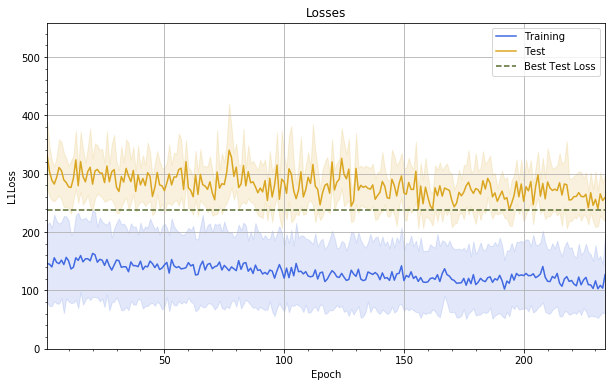

In [24]:
test_optimizer_full(dataset=dp.DroneRGBLater,
                    weight_decay=best_l2_later[0],
                    patience=40,
                    lr=best_optimizer_later[0], 
                    rho=best_optimizer_later[1])